In [1]:
c_from_inversecm_to_MHz = 29979.2458


location = 'DAQ'
data_folder = r'\20221029'
if location == 'laptop':
    code_path = r'D:\Dropbox (Hutzler Lab)\HutzlerLabShared\Personal\ArianJadbabaie\Code\Data_Analysis\Analysis_Code'
    #code_path = r'E:\Code\Data Analysis\Analysis_Code'
    #code_path = r'C:\Users\Arian\Dropbox (Hutzler Lab)\HutzlerLabShared\Personal\NickPilgram\Code\Data Analysis\Analysis_Code'
    path = r'D:\Dropbox (Hutzler Lab)\HutzlerLabData\Orange Beam Source\PXI Data'
    path+=data_folder
    #path = r'E:\Data\OrangeBeamBox\20200624'
elif location == 'home':
    code_path = r'C:\Users\Yuiki Takahashi\Dropbox (Hutzler Lab)\HutzlerLabShared\Personal\Yuiki Takahashi\Spinprecession\Spin_precession_try'
    path = r'C:\Users\Yuiki Takahashi\Dropbox (Hutzler Lab)\HutzlerLabData\Orange Beam Source\PXI Data'
    path+=data_folder
elif location == 'DAQ':
    code_path = r'F:\Hutzler Lab Dropbox\HutzlerLabShared\Personal\Yuiki Takahashi\Spinprecession\Spin_precession_try'
    path = r'F:\Hutzler Lab Dropbox\HutzlerLabData\Orange Beam Source\PXI Data'
    path+=data_folder
elif location == 'work':
    code_path = r'C:\Users\ajadbaba\Dropbox (Hutzler Lab)\HutzlerLabShared\Personal\ArianJadbabaie\Code\Data_Analysis\Analysis_Code'
    path = r'C:\Users\ajadbaba\Dropbox (Hutzler Lab)\HutzlerLabData\Orange Beam Source\PXI Data'
    path+=data_folder
print(path)

%matplotlib inline
import json
import ujson as uj
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import sys
sys.path.append(code_path)
#import fit_functions as f
import pathlib
import datetime
from copy import deepcopy
version = 4
import math
import numpy as np
import scipy.stats as st
import scipy.interpolate as si
#from joblib import Parallel, delayed
from scipy.ndimage import uniform_filter1d
import itertools
import argparse
import sys
#import joblib.parallel
from scipy.stats import uniform
from numpy import random, linalg
from scipy.optimize import curve_fit
import scipy.integrate as integrate
import scipy.special as special
import csv 
from scipy.signal import butter, sosfiltfilt, sosfreqz
import bisect
#from sigfig import round
import pandas as pd
from operator import itemgetter
#import data_analysis_functions_v2 as d2
from scipy.integrate import quad
from scipy.misc import derivative as driv
from scipy.special import j0
from scipy.special import j1
from scipy.special import jv
from scipy.special import dawsn
from scipy.optimize import curve_fit
from scipy.optimize import least_squares
from scipy.integrate import cumtrapz
from random import randint
from numpy.random import choice
import scipy.stats as st
import lmfit
import matplotlib
from scipy.interpolate import interp1d
from matplotlib.backends.backend_pdf import PdfPages


F:\Hutzler Lab Dropbox\HutzlerLabData\Orange Beam Source\PXI Data\20221029


In [2]:
def get_raw_data_run(run_name,path,start = None,stop=None,save_raw = False, save_path = None,ujson=False):
    if start is None:
        start = 1
    if stop is None:
        file_nums = np.arange(start,d2.find_last_file(path,run_name))
    else:
        file_nums = np.arange(start,stop+1)
    print(run_name)
    raw_data, meta_data = d2.read_raw_data_array(file_nums,run_name,path,map_version='map',chunksize=2)
    print('Finished reading raw data')
    
    if save_raw:
        if run_name[-1] == '_':
            run_name = run_name[:-1]
        if save_path is None:
            data_file_path = 'raw_'+run_name
            meta_file_path = 'meta_'+run_name
        else:
            data_file_path = save_path+'_raw'
            meta_file_path = save_path+'_meta'
        save_json_data(raw_data,data_file_path,ujson=ujson)
        save_json_data(meta_data,meta_file_path,ujson=ujson)
    return raw_data,meta_data

def process_raw_data(raw_data,meta_data,ch_types = None,N_cmd=1,laser=None,num_avg=0, cycle_avg=False):
#     if N_cmd>1:
    all_raw_data = {}
    sorted_dict = d2.sort_by_command(raw_data,meta_data)
    for N in range(1,N_cmd+1):
        all_raw_data[N] = sorted_dict['waveform{:0>3d}'.format(N)]
    final_data = deepcopy(all_raw_data)
    for cmd_waveform in all_raw_data.keys():
        if laser is not None:
            final_data[cmd_waveform][-1] = d2.correct_freq(final_data[cmd_waveform][-1],laser=laser)
        if num_avg>0:
            final_data[cmd_waveform] = d2.average_raw_data_array(*final_data[cmd_waveform],num_avg=num_avg,cycle_avg=cycle_avg)
        final_data[cmd_waveform] = d2.process_raw_data_array(*final_data[cmd_waveform],ch_types)
#     elif N_cmd==1:
#         final_data=deepcopy([raw_data, meta_data])
#         if laser is not None:
#             final_data[-1] = d2.correct_freq(final_data[-1],laser=laser)
#         if num_avg>0:
#             final_data = d2.average_raw_data_array(*final_data,num_avg=num_avg,cycle_avg=cycle_avg)
#         final_data = d2.process_raw_data_array(*final_data,ch_types)
    return final_data

def get_json_data(file_path,numpy=False,ujson=False):
    if '.json' not in file_path:
        file_path+='.json'
    with open(file_path, 'r') as f:
        if ujson:
            data = uj.load(f)
        else:
            data = json.load(f)
    if numpy:
        data = np.array(data)
    return data

def save_json_data(data,file_path,ujson=False):
    if type(data) is np.ndarray:
        data_save = data.tolist()
    else:
        data_save=data
    if '.json' not in file_path:
        file_path+='.json'
    with open(file_path,'w') as f:
        if ujson:
            uj.dump(data_save,f)
        else:
            json.dump(data_save,f)
    print('Data saved to', file_path)
    
def smooth(y,N,sigma=0.4): #Implements a Gaussian convolution filter with N = width in indices and sigma = stdev normalized by N
    n=np.arange(N)
    gaussian = np.exp(-1/2*((n-N/2)/(sigma*N/2))**2)
    y_smooth = np.convolve(y, gaussian/gaussian.sum(), mode='valid')
    return y_smooth

def smooth_box(y, box_pts):
    box = np.ones(box_pts)/box_pts
    y_smooth = np.convolve(y, box, mode='same')
    return y_smooth

def import_multiple_runs(scan_numbers,name='scan',read_existing=False):
    all_fluor = []
    all_front = []
    fluor_norm = []
    all_data = {}
    for n in scan_numbers:
        scan = '{}_{}'.format(name,n)
        if read_existing:
            raw_name = '{}_{}_raw'.format(data_folder[1:],scan)
            print(raw_name)
            meta_name = '{}_{}_meta'.format(data_folder[1:],scan)
            print(meta_name)
            raw = get_json_data(raw_name,numpy=True,ujson=True)
            meta = get_json_data(meta_name,numpy=False,ujson=True)
        else:
             raw,meta = get_raw_data_run(scan+'_',path,start = 5,stop=None,save_path=r'{}_{}'.format(data_folder[1:],scan),save_raw = True,ujson=True)
        all_data[n] = [raw,meta]
    return all_data

def analyze_data(all_data,avg=0,N_cmd=1,int_bounds=[(0.3,4.5),(0.3,6),(1.2,8)],plot=True):
    fluor_norm_b = []
    fluor_norm_u = []
    for run,data in all_data.items():
        raw,meta = data
        proc_data = process_raw_data(raw,meta,cycle_avg=False,num_avg=avg,N_cmd=N_cmd)
        print(proc_data[1][0].shape[0])
        int_data_u = d2.integrate_data_array(proc_data[1][0],proc_data[1][1],int_bounds,plot=plot)
        int_data_b = d2.integrate_data_array(*proc_data[2],int_bounds,plot=plot)
        fluor_norm_u.append([(int_data_u[2]/int_data_u[1]).mean(),(int_data_u[2]/int_data_u[1]).std()])
        fluor_norm_b.append([(int_data_b[2]/int_data_b[1]).mean(),(int_data_b[2]/int_data_b[1]).std()])
        #all_fluor.append([int_data[2].mean(),int_data[2].std()])
        #all_front.append([int_data[1].mean(),int_data[1].std()])
    return np.array(fluor_norm_u).T,np.array(fluor_norm_b).T

def sort_data(indep_var,depend_var,return_IV=True):
    #print(len(indep_var))
    #print(len(depend_var))
    if len(indep_var) != len(depend_var):
        print('Number of independent and dependent variables do not match')
    else:
        if not isinstance(indep_var,list):
            indep_var = list(indep_var)
        sorted_DV = [DV for IV,DV in sorted(zip(indep_var,depend_var))]
        if return_IV:
            sorted_IV = sorted(indep_var)
            return [np.array(sorted_IV),np.array(sorted_DV)]
        else:
            return np.array(sorted_DV)
        

def butter_lowpass(lowcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    sos = butter(order, low, analog=False, btype='lowpass', output='sos')
    return sos

def butter_lowpass_filter(data, lowcut, fs, order=5):
    sos = butter_lowpass(lowcut, fs, order=order)
    y = sosfiltfilt(sos, data)
    return y

def line_func(x, a, b): 
    return x*a+b

def sine_func(t, A, w, p, c):  
    return A * np.sin(w*t + p) + c

def sine_line_func(t, A, w, p, c, a):  
    return A * np.sin(w*t + p) + t*a + c

In [3]:
def Spectrum_residuals(Lines,Pred, uncertainty_array):
    
    res=[]
    
    n = 0
    
    #print(Pred)
    
    for i in range(len(Lines)):
        N_g_data=Lines[i]['ground state']['N']
        G_g_data=Lines[i]['ground state']['G']
        F_g_data=Lines[i]['ground state']['F']
        Parity_g_data=Lines[i]['ground state']['Parity']
        J_e_data=Lines[i]['excited state']['J']
        P_e_data=Lines[i]['excited state']['P']
        F_e_data=Lines[i]['excited state']['F']
        Parity_e_data=Lines[i]['excited state']['Parity']
        for j in range(len(Pred)):
            N_g_pred=Pred[j]['ground state']['N']
            G_g_pred=Pred[j]['ground state']['G']
            F_g_pred=Pred[j]['ground state']['F']
            Parity_g_pred=Pred[j]['ground state']['Parity']
            J_e_pred=Pred[j]['excited state']['J']
            P_e_pred=Pred[j]['excited state']['P']
            F_e_pred=Pred[j]['excited state']['F']
            Parity_e_pred=Pred[j]['excited state']['Parity']
            
            if N_g_data==N_g_pred and G_g_data==G_g_pred and F_g_data==F_g_pred and Parity_g_data==Parity_g_pred and J_e_data==J_e_pred and Parity_e_data==Parity_e_pred and P_e_data==P_e_pred and F_e_data==F_e_pred:
                
                if uncertainty_array is None:
                    res.append(Lines[i]['freq']-Pred[j]['freq'])
                else:
                    res.append( (Lines[i]['freq']-Pred[j]['freq']) / uncertainty_array[i] )

                n += 1
                
                found = True
        if found:
            found = False
        else:
            print('The line cannot be found..  freq: ',Lines[i]['freq'])


                
    return res



def create_params_dict():
    
    params_dict={
        'Torg_g':['ground state','Torg','Torg'],
        'Be_g':['ground state', 'Be', 'Rotation'],
        'Gamma_SR_g':['ground state','Gamma_SR','Spin Rotation'],
        'Gamma_prime_g':['ground state','Gamma_prime','Spin Rotation gamma prime'],
        'ASO_g': ['ground_state', 'ASO','Spin Orbit'],
        'p2q_g': ['ground state','p+2q','Lambda Doubling'],
        'qG_g': ['ground state','q_G','l Doubling qG'],
        'pG2qG_g': ['ground state','p_G+2q_G','l Doubling pG plus 2qG'],
        'D_g': ['ground state','D', 'Centrifugal Distortion'],
        'GammaD_g': ['ground state','GammaD', 'Spin Rotation CD'],
        'p2qD_g': ['ground state','(p+2q)D','Lambda Doubling CD'],
        'bF_g': ['ground state','bF','Fermi Contact'],
        'c_g': ['ground state','c','HF Dipole Dipole'],
        'ew2_g' : ['ground state','ew2', 'Renner Teller'],
        'gk_g' : ['ground state','gk','Renner Teller gk'],
        'epsilonaa_g' : ['ground state','gamma g epsilon aa','Epsilon aa'],
        'pG_g': ['ground state','p_G','l Doubling pG'],
        'e2Qq0_g': ['ground state','e^2Q_q0','Quadrupole term'],

        'Torg_e':['excited state','Torg','Torg'],
        'Be_e':['excited state', 'Be', 'Rotation'],
        'Gamma_SR_e':['excited state','Gamma_SR','Spin Rotation'],
        'Gamma_prime_e':['excited state','Gamma_prime','Spin Rotation gamma prime'],
        'ASO_e': ['excited state', 'ASO','Spin Orbit'],
        'p2q_e': ['excited state','p+2q','Lambda Doubling'],
        'qG_e': ['excited state','q_G','l Doubling qG'],
        'pG2qG_e': ['excited state','p_G+2q_G','l Doubling pG plus 2qG'],
        'D_e': ['excited state','D', 'Centrifugal Distortion'],
        'GammaD_e': ['excited state','GammaD', 'Spin Rotation CD'],
        'p2qD_e': ['excited state','(p+2q)D','Lambda Doubling CD'],
        'bF_e': ['excited state','bF','Fermi Contact'],
        'c_e': ['excited state','c','HF Dipole Dipole'],
        'ew2_e' : ['excited state','ew2', 'Renner Teller'],
        'gk_e' : ['excited state','gk','Renner Teller gk'],
        'a_e': ['excited state','a','HF a term'],
        'd_e': ['excited state','d','HF d term'],
        'e2Qq0_e': ['excited state','e^2Q_q0','Quadrupole term']
        
        
    }
    
    return params_dict


def create_fit_parameters(params_g,params_e):
    
    p = lmfit.Parameters()
    
    for i in params_g:
        if params_g[i][1]=='float':
            vary_val=True
        elif params_g[i][1]=='fix':
            vary_val=False
        p.add(i+'{}'.format('_g'),value=params_g[i][0],vary=vary_val)
        
    for j in params_e:
        if params_e[j][1]=='float':
            vary_val=True
        elif params_e[j][1]=='fix':
            vary_val=False
        p.add(j+'{}'.format('_e'),value=params_e[j][0],vary=vary_val)
    
    
    return p

def unpack_fit_params(p):
    
    params_dict=create_params_dict()
    
    ground_state_params={}
    ground_state_H_keys=[]
    excited_state_params={}
    excited_state_H_keys=[]
    
    for i in p.valuesdict():
        if params_dict[i][0]=='ground state':
            ground_state_params[params_dict[i][1]]=p.valuesdict()[i]
            if params_dict[i][1]!='Torg':
                ground_state_H_keys.append(params_dict[i][2])
        elif params_dict[i][0]=='excited state':
            excited_state_params[params_dict[i][1]]=p.valuesdict()[i]
            if params_dict[i][1]!='Torg':
                excited_state_H_keys.append(params_dict[i][2])
            
    return ground_state_params,ground_state_H_keys,excited_state_params,excited_state_H_keys


                                 
def spectrum_residuals_lmfit(p,Assignments,ground_state_vals,excited_state_vals,Temp, uncertainty_array, isotope, TDM_type):
    
    print('fitting is progressing..')
    
    Lambda_g=ground_state_vals[0]
    N_range_g=ground_state_vals[1]
    v2_g=ground_state_vals[2]
    I_g=ground_state_vals[3]
    case_g=ground_state_vals[4]
    
    Lambda_e=excited_state_vals[0]
    N_range_e=excited_state_vals[1]
    v2_e=excited_state_vals[2]
    I_e=excited_state_vals[3]
    case_e=excited_state_vals[4]
    
    
    ground_state_params, ground_state_H_keys, excited_state_params, excited_state_H_keys=unpack_fit_params(p)

    ground_state=Molecular_State.initialize_state(Lambda_g,N_range_g,ground_state_params,ground_state_H_keys,v2=v2_g,I_values=[I_g],Hunds_case=case_g, isotope = isotope)
    
    excited_state=Molecular_State.initialize_state(Lambda_e,N_range_e,excited_state_params,excited_state_H_keys,v2=v2_e,I_values=[I_e],Hunds_case=case_e)
    
    spec_pred=Molecular_Transition(ground_state,excited_state, Temp, TDM_type = TDM_type)
    
    return Spectrum_residuals(Assignments,spec_pred.Transitions, uncertainty_array)


def fit_spectrum(p,Assignments,ground_state_vals,excited_state_vals,Temp, uncertainty_array = None, isotope = 174, plot_res=True, error_estimation=False, TDM_type  = 'aBJ No M Yuiki'):
    
    if uncertainty_array is not None:
        if len(Assignments) != len(uncertainty_array):
            print('The length of Assignments array must be the same as uncertainty array!')
    
    mini = lmfit.Minimizer(spectrum_residuals_lmfit, p, fcn_args=(Assignments,ground_state_vals,excited_state_vals,Temp, uncertainty_array, isotope, TDM_type),nan_policy='omit')

    result = mini.minimize(method='leastsq')

    print(lmfit.report_fit(result.params))
    print('')
    print('reduced chi squared: ', result.redchi)
    
    if error_estimation==True:

        ci, trace = lmfit.conf_interval(mini, result, sigmas=[1, 2],trace=True, verbose=False)
        print(lmfit.printfuncs.report_ci(ci))
        
    post_fit_res=spectrum_residuals_lmfit(result.params,Assignments,ground_state_vals,excited_state_vals,Temp, uncertainty_array = None, isotope = isotope, TDM_type = TDM_type)
        
    if plot_res==True:
        
        plt.figure(1,figsize=(15,8))
        zero_plot=np.zeros(len(Assignments))
        plt.plot(spectrum_residuals_lmfit(p,Assignments,ground_state_vals,excited_state_vals,Temp, uncertainty_array = None, isotope = isotope, TDM_type = TDM_type),'o',label='before fit')
        plt.plot(post_fit_res,'s',label='after fit')
        plt.plot(zero_plot)
        plt.title('Residuals',fontsize=18)
        plt.legend(loc='best')
        
#         plt.figure(2,figsize=(15,8))
#         zero_plot=np.zeros(len(Assignments))
#         plt.plot(spectrum_residuals_lmfit(result.params,Assignments,ground_state_vals,excited_state_vals,Temp),'o')
#         plt.plot(zero_plot)
#         plt.title('Residuals after Fit',fontsize=18)
        
    print('fit residuals standard deviation',np.std(post_fit_res))
    
    return result


def examine_residuals(p,Assignments,ground_state_vals,excited_state_vals,Temp,print_output=True, isotope = 174, TDM_type = 'aBJ No M Chi'):
    
    Lambda_g=ground_state_vals[0]
    N_range_g=ground_state_vals[1]
    v2_g=ground_state_vals[2]
    I_g=ground_state_vals[3]
    
    Lambda_e=excited_state_vals[0]
    N_range_e=excited_state_vals[1]
    v2_e=excited_state_vals[2]
    I_e=excited_state_vals[3]
    
    
    ground_state_params, ground_state_H_keys, excited_state_params, excited_state_H_keys=unpack_fit_params(p)

    ground_state=Molecular_State.initialize_state(Lambda_g,N_range_g,ground_state_params,ground_state_H_keys,v2=v2_g,I_values=[I_g])
    
    excited_state=Molecular_State.initialize_state(Lambda_e,N_range_e,excited_state_params,excited_state_H_keys,v2=v2_e,I_values=[I_e])
    
    spec_prediction=Molecular_Transition(ground_state,excited_state, Temp, TDM_type = TDM_type)
    
    spec_pred=spec_prediction.Transitions
    
    res_data=[]
    
    for i in range(len(Assignments)):
        N_g_data=Assignments[i]['ground state']['N']
        G_g_data=Assignments[i]['ground state']['G']
        F_g_data=Assignments[i]['ground state']['F']
        Parity_g_data=Assignments[i]['ground state']['Parity']
        J_e_data=Assignments[i]['excited state']['J']
        F_e_data=Assignments[i]['excited state']['F']        
        P_e_data=Assignments[i]['excited state']['P']
        Parity_e_data=Assignments[i]['excited state']['Parity']
        for j in range(len(spec_pred)):
            N_g_pred=spec_pred[j]['ground state']['N']
            G_g_pred=spec_pred[j]['ground state']['G']
            F_g_pred=spec_pred[j]['ground state']['F']
            Parity_g_pred=spec_pred[j]['ground state']['Parity']
            J_e_pred=spec_pred[j]['excited state']['J']
            P_e_pred=spec_pred[j]['excited state']['P']
            F_e_pred=spec_pred[j]['excited state']['F']
            Parity_e_pred=spec_pred[j]['excited state']['Parity']
            
            if N_g_data==N_g_pred and Parity_g_data==Parity_g_pred and J_e_data==J_e_pred and Parity_e_data==Parity_e_pred and G_g_data==G_g_pred and F_g_data==F_g_pred and P_e_data==P_e_pred and F_e_data==F_e_pred:
                res_data.append({'Line':Assignments[i]['freq'],
                                 'Residual':Assignments[i]['freq']-spec_pred[j]['freq'],
                                 'ground state':Assignments[i]['ground state'],
                                 'excited state':Assignments[i]['excited state']})
    
    if print_output==True:
        for k in range(len(res_data)):
            print(res_data[k])
            print('\n')
    
    return res_data




def predict_FM_spectrum(p,ground_state_vals,excited_state_vals,theta,width,freq_range):
    
    Lambda_g=ground_state_vals[0]
    N_range_g=ground_state_vals[1]
    v2_g=ground_state_vals[2]
    I_g=ground_state_vals[3]
    
    Lambda_e=excited_state_vals[0]
    N_range_e=excited_state_vals[1]
    v2_e=excited_state_vals[2]
    I_e=excited_state_vals[3]
    
    
    ground_state_params, ground_state_H_keys, excited_state_params, excited_state_H_keys=unpack_fit_params(p)

    ground_state=Molecular_State.initialize_state(Lambda_g,N_range_g,ground_state_params,ground_state_H_keys,v2=v2_g,I_values=[I_g])
    
    excited_state=Molecular_State.initialize_state(Lambda_e,N_range_e,excited_state_params,excited_state_H_keys,v2=v2_e,I_values=[I_e])
    
    spec_pred=Molecular_Transition(ground_state,excited_state, Temp)
    
    
    centers=[]
    heights=[]
    widths=[]
    
    for i in range(len(spec_pred.frequencies)):
        if spec_pred.frequencies[i]>freq_range[0] and spec_pred.frequencies[i]<freq_range[1]:
            centers.append(spec_pred.frequencies[i])
            heights.append(spec_pred.Intensities[i])
            widths.append(width)
    
    w=np.arange(freq_range[0],freq_range[1],0.00005)
    I=I_FM(w,centers,widths,heights,theta)
    Q=Q_FM(w,centers,widths,heights,theta)
    
    return w,I,Q

def predict_Gaussian_spectrum(p,ground_state_vals,excited_state_vals,width,freq_range):
    
    Lambda_g=ground_state_vals[0]
    N_range_g=ground_state_vals[1]
    v2_g=ground_state_vals[2]
    I_g=ground_state_vals[3]
    
    Lambda_e=excited_state_vals[0]
    N_range_e=excited_state_vals[1]
    v2_e=excited_state_vals[2]
    I_e=excited_state_vals[3]
    
    
    ground_state_params, ground_state_H_keys, excited_state_params, excited_state_H_keys=unpack_fit_params(p)

    ground_state=Molecular_State.initialize_state(Lambda_g,N_range_g,ground_state_params,ground_state_H_keys,v2=v2_g,I_values=[I_g])
    
    excited_state=Molecular_State.initialize_state(Lambda_e,N_range_e,excited_state_params,excited_state_H_keys,v2=v2_e,I_values=[I_e])
    
    spec_pred=Molecular_Transition(ground_state,excited_state, Temp)
    
    
    centers=[]
    heights=[]
    widths=[]
    
    for i in range(len(spec_pred.frequencies)):
        if spec_pred.frequencies[i]>freq_range[0] and spec_pred.frequencies[i]<freq_range[1]:
            centers.append(spec_pred.frequencies[i])
            heights.append(spec_pred.Intensities[i])
            widths.append(width)
    
    w=np.arange(freq_range[0],freq_range[1],0.00005)
    pred=mult_gaussian(w,centers,widths,heights)
    
    return w,pred


def gaussian(w,w0,Gamma,amp):
    return amp*np.exp((-1)*((w-w0)**2)/(2*((Gamma/2.355)**2)))

def mult_gaussian(w,w0,Gamma,amp):
    out=0
    for i in range(len(w0)):
        out=out+gaussian(w,w0[i],Gamma[i],amp[i])
    return out

def gaussian_dispersion(w,w0,Gamma,amp):
    return (-2/np.sqrt(np.pi))*amp*dawsn((w-w0)/(np.sqrt(2)*(Gamma/2.355)))

def mult_gaussian_dispersion(w,w0,Gamma,amp):
    out=0
    for i in range(len(w0)):
        out=out+gaussian_dispersion(w,w0[i],Gamma[i],amp[i])
    return out


wm=50.3*(3.34*10**(-5)) #cm^-1
M=0.84

def A_FM_2nd_order(w,w0,Gamma,amp):
    return ((j0(M)*j1(M)*(mult_gaussian(w-wm,w0,Gamma,amp)-mult_gaussian(w+wm,w0,Gamma,amp)))+
            (j1(M)*jv(2,M)*(mult_gaussian(w-2*wm,w0,Gamma,amp)-mult_gaussian(w+2*wm,w0,Gamma,amp)+
                            mult_gaussian(w-wm,w0,Gamma,amp)-mult_gaussian(w+wm,w0,Gamma,amp))))

def D_FM_2nd_order(w,w0,Gamma,amp):
    return ((j0(M)*j1(M)*(mult_gaussian_dispersion(w-wm,w0,Gamma,amp)+mult_gaussian_dispersion(w+wm,w0,Gamma,amp)-
                          2*mult_gaussian_dispersion(w,w0,Gamma,amp)))+
            (j1(M)*jv(2,M)*(mult_gaussian_dispersion(w-2*wm,w0,Gamma,amp)+mult_gaussian_dispersion(w+2*wm,w0,Gamma,amp)-
                           mult_gaussian_dispersion(w-wm,w0,Gamma,amp)-mult_gaussian_dispersion(w+wm,w0,Gamma,amp))))


# def I_FM(w,w0,Gamma,amp,theta,offset):
#     return np.cos(theta)*A_FM_2nd_order(w,w0,Gamma,amp)+np.sin(theta)*D_FM_2nd_order(w,w0,Gamma,amp)+offset

# def Q_FM(w,w0,Gamma,amp,theta,offset):
#     return np.sin(theta)*A_FM_2nd_order(w,w0,Gamma,amp)-np.cos(theta)*D_FM_2nd_order(w,w0,Gamma,amp)+offset


def I_FM(w,w0,Gamma,amp,theta):
    return np.cos(theta)*A_FM_2nd_order(w,w0,Gamma,amp)+np.sin(theta)*D_FM_2nd_order(w,w0,Gamma,amp)

def Q_FM(w,w0,Gamma,amp,theta):
    return np.sin(theta)*A_FM_2nd_order(w,w0,Gamma,amp)-np.cos(theta)*D_FM_2nd_order(w,w0,Gamma,amp)


                   

In [4]:
#global_Lorentzian_mode = False

def Set_Lorentzian_mode(Lorentzian_mode):
    global global_Lorentzian_mode
    global_Lorentzian_mode = Lorentzian_mode

    
# Note that Gamma here is a FWHM of lineshape!

def gaussian(w,w0,Gamma,amp):
    Lorentzian_mode = global_Lorentzian_mode
    if Lorentzian_mode:
        return amp * (Gamma/2)**2 / ( (Gamma/2)**2 + ( w - w0 )**2)
    else:
        return amp*np.exp((-1)*((w-w0)**2)/(2*((Gamma/2.355)**2)))

def mult_gaussian(w,w0,Gamma,amp):
    out=0
    for i in range(len(w0)):
        out=out+gaussian(w,w0[i],Gamma[i],amp[i],)
    return out

def Gaussian_forfit_lmfit(w,p):

    parvals = p.valuesdict()

    N=len(p)

    centers=np.zeros(int(N/3))
    widths=np.zeros(int(N/3))
    heights=np.zeros(int(N/3))
    for i in range(int(N/3)):
        centers[i]=parvals['center{}'.format(i)]
        widths[i]=parvals['width{}'.format(i)]
        heights[i]=parvals['height{}'.format(i)]

    return mult_gaussian(w,centers,widths,heights)

def Gaussian_res_lmfit(p,w,data):


    res=np.zeros(len(w))

    for i in range(len(w)):
        res[i] = Gaussian_forfit_lmfit(w[i],p)-data[i]


    return res



def Gaussian_fit_lmfit(p,w,data,plot=True,error_estimation=False):

    freq_low=w[int(len(w)/10)]
    freq_high=w[len(w)-int(len(w)/10)]
    if freq_high>freq_low:
        w0=w[0]
    else:
        w0=w[len(w)-1]


    w2=w-w0

    mini = lmfit.Minimizer(Gaussian_res_lmfit, p, fcn_args=(w2, data),nan_policy='omit')

    result = mini.minimize(method='leastsq')

    print(lmfit.report_fit(result.params))

    if error_estimation==True:

        ci, trace = lmfit.conf_interval(mini, result, sigmas=[1, 2], trace=True, verbose=False)
        print(lmfit.printfuncs.report_ci(ci))

    fit_values = result.params.valuesdict()

    if plot==True:
        plt.figure(1,figsize=(15,8))
        plt.plot(w2,data)
        plt.plot(w2,Gaussian_forfit_lmfit(w2,result.params))
        plt.title('Data',fontsize=12)
        plt.xlabel('Frequency (cm^-1)',fontsize=12)



        plot_zero=np.zeros(len(w2))

        plt.figure(3,figsize=(15,8))
        plt.plot(w2,Gaussian_forfit_lmfit(w2,result.params)-data,'o')
        plt.plot(w2,plot_zero)
        plt.title('Data Residuals',fontsize=12)
        plt.xlabel('Frequency (cm^-1)',fontsize=12)


    N=len(fit_values)
    centers={}
    for i in range(int(N/3)):
        centers['true_center{}'.format(i)]=fit_values['center{}'.format(i)]+w0
        centers['error{}'.format(i)]=result.params['center{}'.format(i)].stderr
        centers['width{}'.format(i)]=result.params['width{}'.format(i)].value


    print(centers)



    return result,centers



def Gaussian_fit_lmfit_yuiki(p, p1, width_bound_sigma, w, data, plot=True, error_estimation=False, freq_lim = None, background_subtract = False, Lorentzian_mode = False, print_fit_properties = True):

    Set_Lorentzian_mode(Lorentzian_mode)
    
    freq_low=w[int(len(w)/10)]
    freq_high=w[len(w)-int(len(w)/10)]
    if freq_high>freq_low:
        w0=w[0]
    else:
        w0=w[len(w)-1]

    w2=w-w0
    
    fit_centers = np.zeros(len(p1))
    fit_widths = np.zeros(len(p1))
    fit_heights = np.zeros(len(p1))
    caution_centers = []
    
    if background_subtract is not False:
        remove_index_for_background = [i for i , element in enumerate(w) if element > background_subtract[0] and element < background_subtract[1]]
        data_for_background = [element for i , element in enumerate(data) if i in remove_index_for_background]
        background = np.average(data_for_background)
        data -= background
    
    for a in range(len(p1)):
        if a+1 < len(p1):
            if p1[a][1] > p[a+1, 0, 0]:
                print('CAUTION! The peaks at ',  p[a, 0, 0]+w0, ' and',  p[a+1, 0, 0]+w0, ' cm-1 are within ', width_bound_sigma, ' sigma of the peak width (i.e. they are too close) and thus the peak fitting may not work! Do peak fitting manually for this region')
                caution_centers.append([p[a, 0, 0]+w0, p[a+1, 0, 0]+w0])
           
        remove_index = [i for i , element in enumerate(w2) if element > p1[a][0] and element < p1[a][1]]
        w2_small = [element for i , element in enumerate(w2) if i in remove_index]
        data_small = [element for i , element in enumerate(data) if i in remove_index]
                
        scale = 1.
        w2_small = scale*np.array(w2_small)
        p[a,0] *= scale
        p[a,1] *= scale
        
        
        para = lmfit.Parameters()
        para.add('center{}'.format(0),value=p[a,0,0],min=p[a,0,1],max=p[a,0,2])   #min=min(w)-w0,max=max(w)-w0)
        #x0[int(N/3)+1+i]=widths
        para.add('width{}'.format(0),value=p[a,1,0],min=p[a,1,1],max=p[a,1,2])
        #x0[int(2*N/3)+1+i]=I_data_smooth[peaks[i]]
        para.add('height{}'.format(0),value=p[a,2,0],min=p[a,2,1],max=p[a,2,2])
        

        mini = lmfit.Minimizer(Gaussian_res_lmfit, para, fcn_args=(w2_small, data_small),nan_policy='omit')
        result = mini.minimize(method='leastsq')
        if print_fit_properties:
            print(lmfit.report_fit(result.params))
        fit_values = result.params.valuesdict()
        fit_centers[a]=fit_values['center{}'.format(0)]/scale
        fit_widths[a]=fit_values['width{}'.format(0)]/scale
        fit_heights[a]=fit_values['height{}'.format(0)]
        p[a,0] /= scale
        p[a,1] /= scale
        
    if error_estimation==True:

        ci, trace = lmfit.conf_interval(mini, result, sigmas=[1, 2], trace=True, verbose=False)
        print(lmfit.printfuncs.report_ci(ci))

    #fit_values = result.params.valuesdict()

    if plot==True:
        plt.figure(1,figsize=(15,8))
        plt.plot(w,data)
        plt.plot(w,mult_gaussian(w2,fit_centers,fit_widths,fit_heights))
        plt.title('Data',fontsize=12)
        plt.xlabel('Frequency (cm^-1)',fontsize=12)
        if freq_lim is not None:
            plt.xlim(freq_lim[0],freq_lim[1])



        plot_zero=np.zeros(len(w2))

        plt.figure(3,figsize=(15,8))
        plt.plot(w,mult_gaussian(w2,fit_centers,fit_widths,fit_heights)-data,'o')
        plt.plot(w,plot_zero)
        plt.title('Data Residuals',fontsize=12)
        plt.xlabel('Frequency (cm^-1)',fontsize=12)
        if freq_lim is not None:
            plt.xlim(freq_lim[0],freq_lim[1])
            
    print(fit_centers)





    return fit_centers+w0, fit_widths, fit_heights, caution_centers




def Gaussian_fit_lmfit_yuiki2(p, p1, width_bound_sigma, w, data, plot=True, error_estimation=False, freq_lim = None, background_subtract = False, Lorentzian_mode = False, print_fit_properties = True):

    Set_Lorentzian_mode(Lorentzian_mode)
    
    freq_low=w[int(len(w)/10)]
    freq_high=w[len(w)-int(len(w)/10)]
    if freq_high>freq_low:
        w0=w[0]
    else:
        w0=w[len(w)-1]

    w2=w-w0
    
    peaks_identified = [p[:,0,0]+w0,p[:,2,0]]
    
    if background_subtract is not False:
        remove_index_for_background = [i for i , element in enumerate(w) if element > background_subtract[0] and element < background_subtract[1]]
        data_for_background = [element for i , element in enumerate(data) if i in remove_index_for_background]
        background = np.average(data_for_background)
        data -= background
    
    fit_centers = np.zeros(len(p1))
    fit_widths = np.zeros(len(p1))
    fit_heights = np.zeros(len(p1))
    fit_errors = np.zeros(len(p1))
    caution_centers = []
    already_fit_peaks = []
    cut_regions = []
    
    for a in range(len(p1)):

        
        if a in already_fit_peaks:
            already_fit = True
        else:
            already_fit = False
            already_fit_peaks = [a]
            
        if already_fit is False:
            upper_bound = p1[a][1]
            lower_bound = p1[a][0]
        
            if a+1 < len(p1):
                if p1[a][1] > p1[a+1][0]:
                    upper_bound = p1[a+1][1]
                    already_fit_peaks.append(a+1)
                    
                    if a+2 < len(p1):
                        if p1[a+1][1] > p1[a+2][0]:
                            upper_bound = p1[a+2][1]
                            already_fit_peaks.append(a+2)
                            
                            if a+3 < len(p1):
                                if p1[a+2][1] > p1[a+3][0]:
                                    upper_bound = p1[a+3][1]
                                    already_fit_peaks.append(a+3)
                                    
                                    if a+4 < len(p1):
                                        if p1[a+3][1] > p1[a+4][0]:
                                            upper_bound = p1[a+4][1]
                                            already_fit_peaks.append(a+4)
                                            
                                            if a+5 < len(p1):
                                                if p1[a+4][1] > p1[a+5][0]:
                                                    upper_bound = p1[a+5][1]
                                                    already_fit_peaks.append(a+5)
                                                    
                                                    if a+6 < len(p1):
                                                        if p1[a+5][1] > p1[a+6][0]:
                                                            upper_bound = p1[a+6][1]
                                                            already_fit_peaks.append(a+6)  
                                                            
                                                            if a+7 < len(p1):
                                                                if p1[a+6][1] > p1[a+7][0]:
                                                                    upper_bound = p1[a+7][1]
                                                                    already_fit_peaks.append(a+7)
                                                                    
                                                                    if a+8 < len(p1):
                                                                        if p1[a+7][1] > p1[a+8][0]:
                                                                            upper_bound = p1[a+8][1]
                                                                            already_fit_peaks.append(a+8)
                                                                            
                                                                            if a+9 < len(p1):
                                                                                if p1[a+8][1] > p1[a+9][0]:
                                                                                    upper_bound = p1[a+9][1]
                                                                                    already_fit_peaks.append(a+9)
                                                                                    
                                                                                    if a+10 < len(p1):
                                                                                        if p1[a+9][1] > p1[a+10][0]:
                                                                                            print('>10 peaks are too close within', width_bound_sigma, 'sigma of the peak width (i.e. very congested) Do peak fitting manually for this region')
                                                                                            caution_centers.append([p[a, 0, 0]+w0, p[a+1, 0, 0]+w0, p[a+2, 0, 0]+w0, p[a+3, 0, 0]+w0, p[a+4, 0, 0]+w0, p[a+5, 0, 0]+w0, p[a+6, 0, 0]+w0, p[a+7, 0, 0]+w0, p[a+8, 0, 0]+w0, p[a+9, 0, 0]+w0, p[a+10, 0, 0]+w0])
                                                    

            remove_index = [i for i , element in enumerate(w2) if element > lower_bound and element < upper_bound]
            w2_small = [element for i , element in enumerate(w2) if i in remove_index]
            data_small = [element for i , element in enumerate(data) if i in remove_index]

            para = lmfit.Parameters()
            
            ii = 0
            for b in already_fit_peaks:
                para.add('center{}'.format(ii),value=p[b,0,0],min=p[b,0,1],max=p[b,0,2])   #min=min(w)-w0,max=max(w)-w0)
                #x0[int(N/3)+1+i]=widths
                para.add('width{}'.format(ii),value=p[b,1,0],min=p[b,1,1],max=p[b,1,2])
                #x0[int(2*N/3)+1+i]=I_data_smooth[peaks[i]]
                para.add('height{}'.format(ii),value=p[b,2,0],min=p[b,2,1],max=p[b,2,2])
                ii += 1


            mini = lmfit.Minimizer(Gaussian_res_lmfit, para, fcn_args=(w2_small, data_small),nan_policy='omit')

            result = mini.minimize(method='leastsq')
            if print_fit_properties:
                print(lmfit.report_fit(result.params))
                
            iii = 0
            for b in already_fit_peaks:
                fit_values = result.params.valuesdict()
                fit_centers[b]=fit_values['center{}'.format(iii)]
                fit_widths[b]=fit_values['width{}'.format(iii)]
                fit_heights[b]=fit_values['height{}'.format(iii)]
                fit_errors[b]=result.params['center{}'.format(iii)].stderr
                iii += 1
                
            cut_regions.append([lower_bound+w0, upper_bound+w0, len(already_fit_peaks)])
        
    if error_estimation==True:

        ci, trace = lmfit.conf_interval(mini, result, sigmas=[1, 2], trace=True, verbose=False)
        print(lmfit.printfuncs.report_ci(ci))

    #fit_values = result.params.valuesdict()

    if plot==True:
        plt.figure(1,figsize=(15,8))
        plt.plot(w,data)
        plt.plot(w,mult_gaussian(w2,fit_centers,fit_widths,fit_heights))
        plt.title('Data',fontsize=12)
        plt.xlabel('Frequency (cm^-1)',fontsize=12)
        if freq_lim is not None:
            plt.xlim(freq_lim[0],freq_lim[1])



        plot_zero=np.zeros(len(w2))

        plt.figure(3,figsize=(15,8))
        plt.plot(w,mult_gaussian(w2,fit_centers,fit_widths,fit_heights)-data,'o')
        plt.plot(w,plot_zero)
        plt.title('Data Residuals',fontsize=12)
        plt.xlabel('Frequency (cm^-1)',fontsize=12)
        if freq_lim is not None:
            plt.xlim(freq_lim[0],freq_lim[1])
            
    #print(fit_centers)





    return fit_centers+w0, fit_widths, fit_heights, cut_regions, peaks_identified, caution_centers, fit_errors

In [5]:
def find_peaks_2(data,freq_data,threshold,data_range=[],add_peak=None):

    font = {'family' : 'serif',
        'weight' : 'normal',
        'size'   : 13.75}

    matplotlib.rc('font', **font)

    freq_low=freq_data[int(len(freq_data)/10)]
    freq_high=freq_data[len(freq_data)-int(len(freq_data)/10)]
    if freq_high>freq_low:
        print('Frequency low to high')
    else:
        print('Frequency high to low')

    if len(data_range)==0:
        k = np.arange(0,len(data),1)
        a_nosmooth=np.array(data)
    else:
        k = np.arange(data_range[0],data_range[1],1)
        a_nosmooth=np.array(data[data_range[0]:data_range[1]])

    a_nosmooth = a_nosmooth * 100.0 / max(a_nosmooth)

    cs=interp1d(k,a_nosmooth)

    if len(data_range)==0:
        new_k=np.arange(0,len(data)-1,0.1)
    else:
        new_k = np.arange(data_range[0],data_range[1]-1,0.1)

    a = cs(new_k)

    # plt.figure(1,figsize=(15,8))
    # plt.plot(k,a_nosmooth)
    # plt.plot(new_k,a,'o')

    da = np.gradient(a)
    dda = np.gradient(da)

    peaks = []

    for i in range(len(a)-1):
        if da[i]>0 and da[i+1]<0 and dda[i] < 0 and a[i]>threshold:
            peaks.append(int(np.round(new_k[i])))

    if add_peak != None:
        for iii in range(len(add_peak)):
            peaks.append(add_peak[iii])

    peaks.sort()


    fig, ax = plt.subplots(figsize=(26, 13),dpi=150)
    matplotlib.rcParams.update({'font.size': 18})
    matplotlib.rcParams.update({'font.family': 'serif'})

    ax.plot(k, a_nosmooth)

    if len(data_range)==0:
        data_start=0
    else:
        data_start=data_range[0]
    plotline(peaks,k,a_nosmooth,ax,data_start)

    ax.grid(True)
    #ax.set_ylim([-5, 105])
    #ax.xaxis.set_major_locator(ticker.MultipleLocator(.01))
    plt.show()

    return peaks


def plotline(peaks,k,a,ax,data_start):
    for i in range(len(peaks)):
#
        ax.vlines(peaks[i], 0, a[peaks[i]-data_start]+5, linestyle='-')
        ax.text(peaks[i]-.001,
                a[peaks[i]-data_start]+8, str(peaks[i]),
                fontsize=14, rotation=90, va='bottom')
        ax.text(peaks[i]-.001,
                -5, 'a'+str(i),
                fontsize=14, rotation=90)

def avg_mult(func,num_avg):
    if num_avg == 0:
        return func
    else:
        i = num_avg
        avg = avg_func(func)
        i-=1
        while i !=0:
            avg = avg_func(avg)
            i-=1
    return avg


def avg_func(func):
    avg = np.zeros(len(func))
    for i in range(len(func)):
        if i == 0:
            avg[i] = (func[i]+func[i+1])/2
        if i == len(func)-1:
            avg[i] = (func[i]+func[i-1])/2
        else:
            avg[i] = (func[i-1]+func[i]+func[i+1])/3
    return avg


def Find_Gaussian_initial_guess_lmfit(w,data,widths,Box=10,threshold=0.1,add_peak=None,width_bound_sigma=5):

    freq_low=w[int(len(w)/10)]
    freq_high=w[len(w)-int(len(w)/10)]
    if freq_high>freq_low:
        w0=w[0]
    else:
        w0=w[len(w)-1]

    data_smooth=avg_mult(data,Box)

    data_plot=data_smooth





    peaks=find_peaks_2(data_plot,w,threshold,add_peak=add_peak)
    #peaks=find_peaks_2(Int_Idata,w,threshold*100,add_peak=add_peak)

    print('Number of peaks',len(peaks))

    N=3*len(peaks)

    p = np.zeros((len(peaks),3,3))
    p1 = []
    
    for i in range(len(peaks)):
        
        p[i,0,0] = w[peaks[i]]-w0
        p[i,0,1] = w[peaks[i]]-w0-2*widths
        p[i,0,2] = w[peaks[i]]-w0+2*widths
        
        p[i,1,0] = widths
        p[i,1,1] = 0.25*widths
        p[i,1,2] = 5*widths
        
        p[i,2,0] = abs(data_plot[peaks[i]])
        p[i,2,1] = 0.25*abs(data_plot[peaks[i]])
        p[i,2,2] = 6*abs(data_plot[peaks[i]])

        p1.append([w[peaks[i]]-w0-width_bound_sigma*widths, w[peaks[i]]-w0+width_bound_sigma*widths])

#     weight=max(Q_data)/max(I_data)
#     print('Weight',weight)

    #p.pretty_print()


    return p, p1, width_bound_sigma

In [19]:
def moving_average(y, window):
    """
    Simple moving average with NaN-safe behavior.
    Returns array of same length as y (centered window).
    """
    y = np.asarray(y, dtype=float)
    if window is None or window <= 1:
        return y

    # centered rolling mean; edges become NaN -> we fill by nearest valid value
    s = pd.Series(y)
    y_sm = s.rolling(window=window, center=True, min_periods=1).mean().to_numpy()
    return y_sm

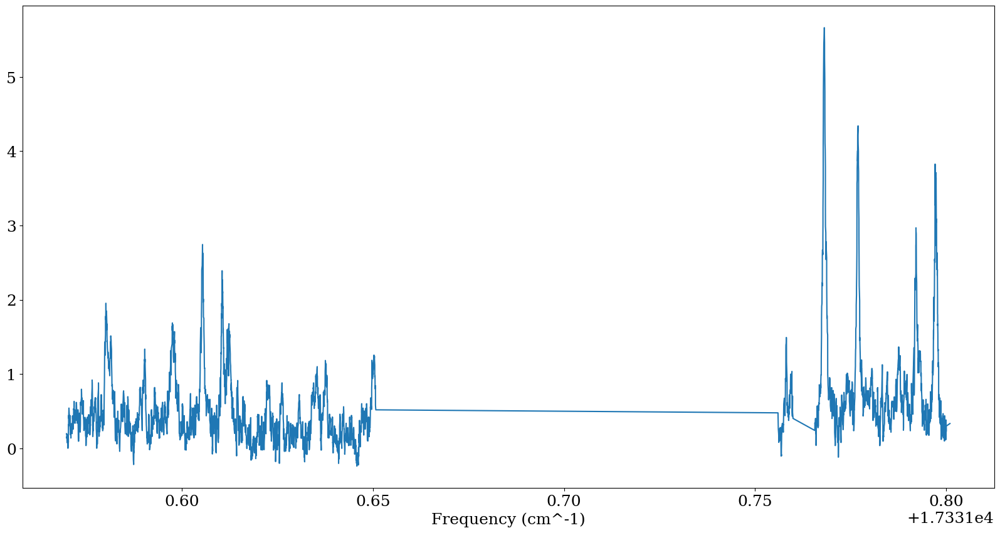

In [40]:
import pandas as pd

df = pd.read_csv("all_scans_sorted.csv")

window = 5

g = df[df["pumping"] == "F1=2"].sort_values("freq").copy()
frequencies = g["freq"].to_numpy(float)
data = g["signal"].to_numpy(float)
smooth_data = moving_average(data, window)
plt.figure(figsize=(20,10))
plt.xlabel('Frequency (cm^-1)')
plt.plot(frequencies, smooth_data)
plt.show()

In [30]:
#remove_index = [i for i , element in enumerate(frequencies) if element > 17006.2 and element < 17006.5]
#frequencies = [element for i , element in enumerate(frequencies) if i in remove_index]
#smooth_data = [element for i , element in enumerate(data) if i in remove_index]
#plt.plot(frequencies)

In [12]:
#%matplotlib widget
%matplotlib inline

Frequency low to high


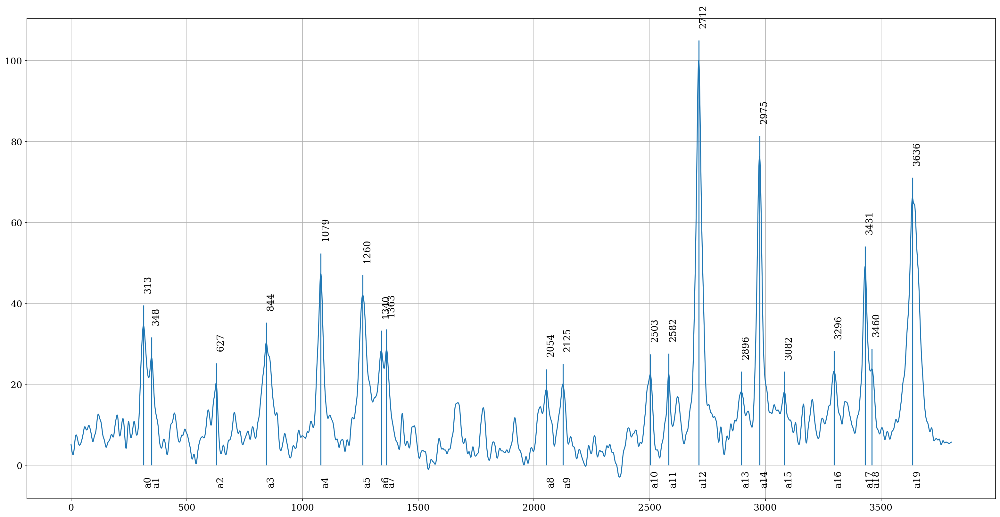

Number of peaks 20


In [41]:

p, p1, width_bound_sigma = Find_Gaussian_initial_guess_lmfit(frequencies,data,0.001,Box=30,threshold=17,add_peak=None, width_bound_sigma = 20)

>10 peaks are too close within 20 sigma of the peak width (i.e. very congested) Do peak fitting manually for this region


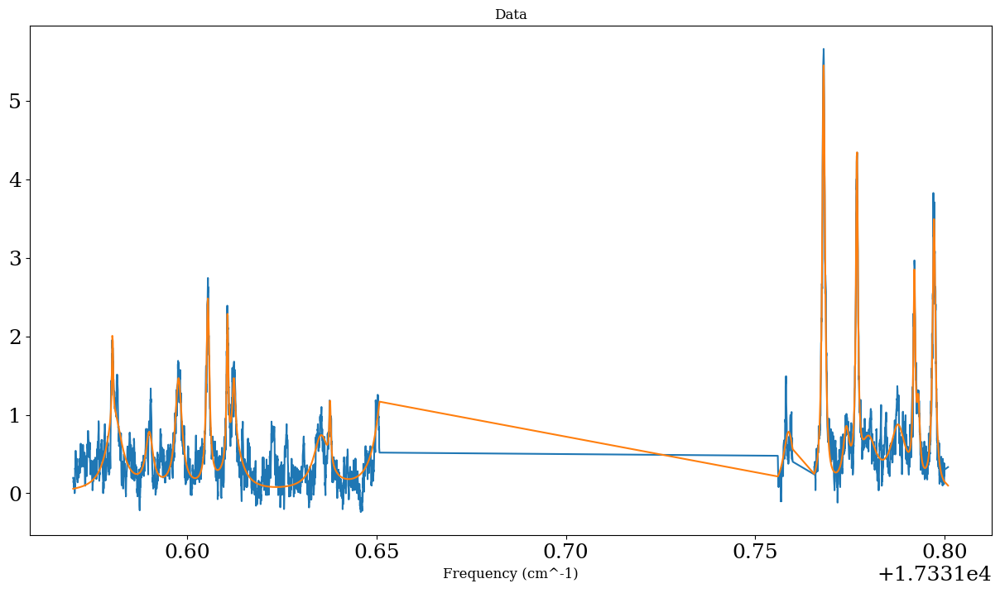

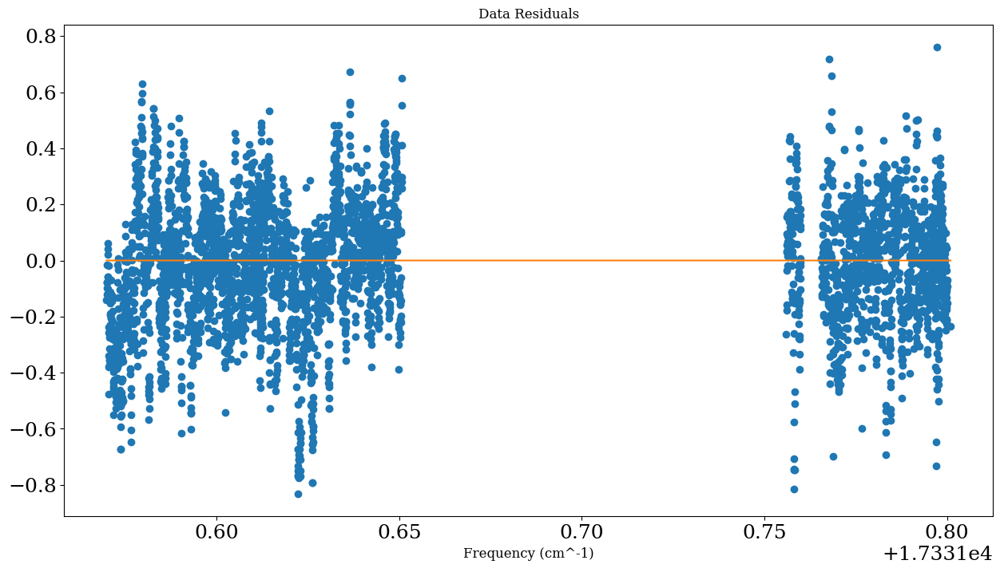

In [42]:
peaks = Gaussian_fit_lmfit_yuiki2(p,p1, width_bound_sigma,frequencies,smooth_data,background_subtract =  False, freq_lim =  None, plot=True, error_estimation=False, Lorentzian_mode = True, print_fit_properties = False)
plt.show()

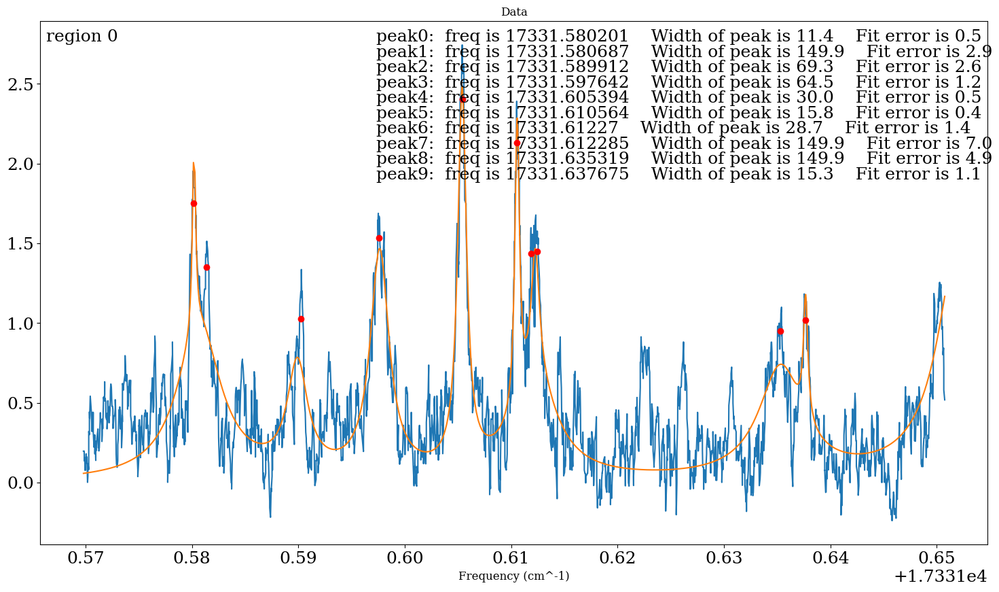

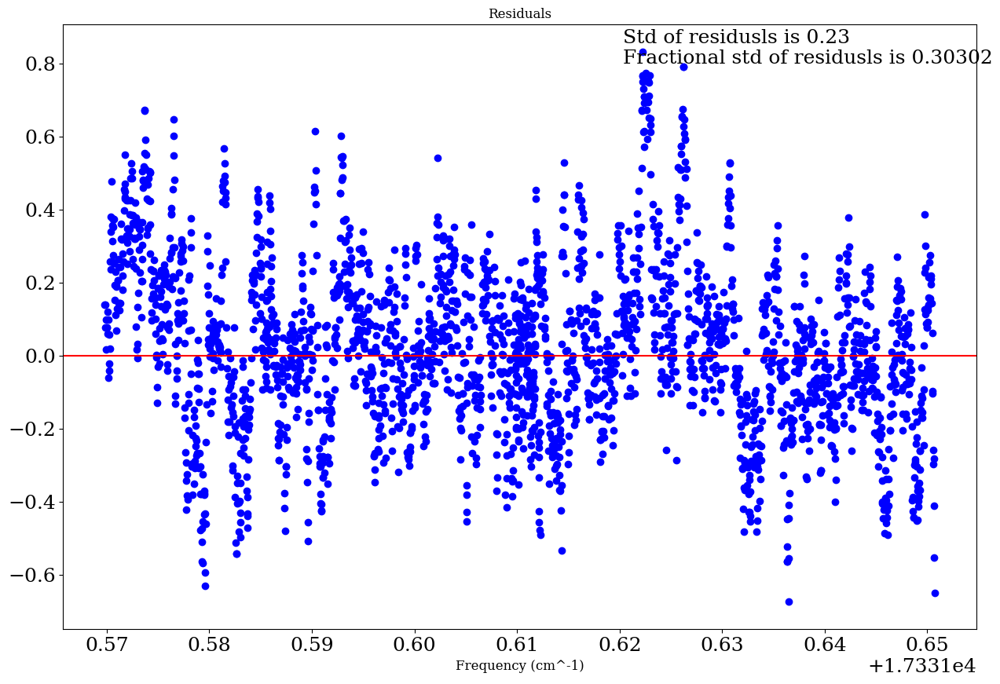

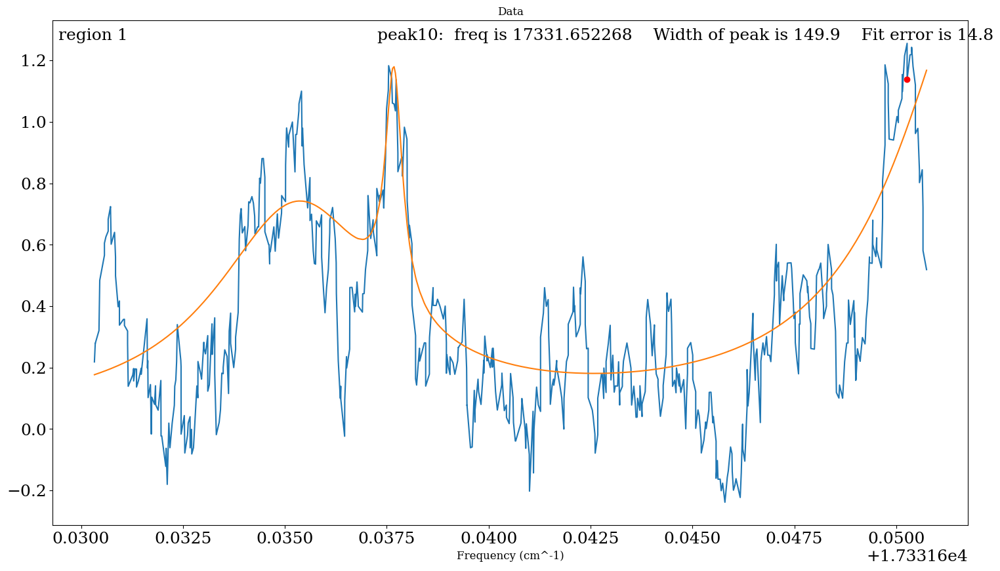

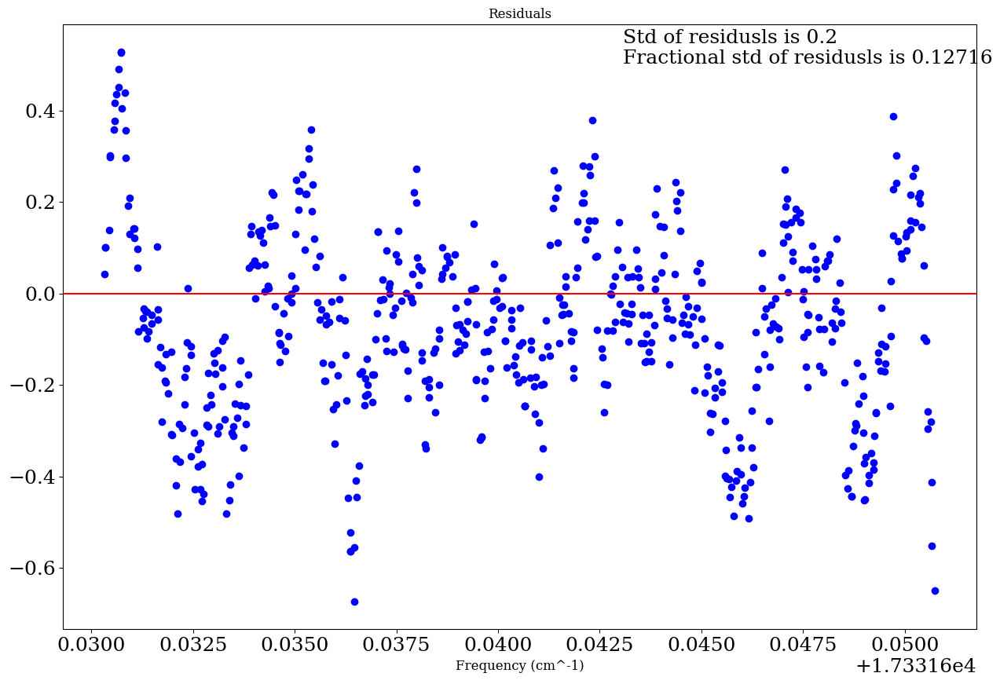

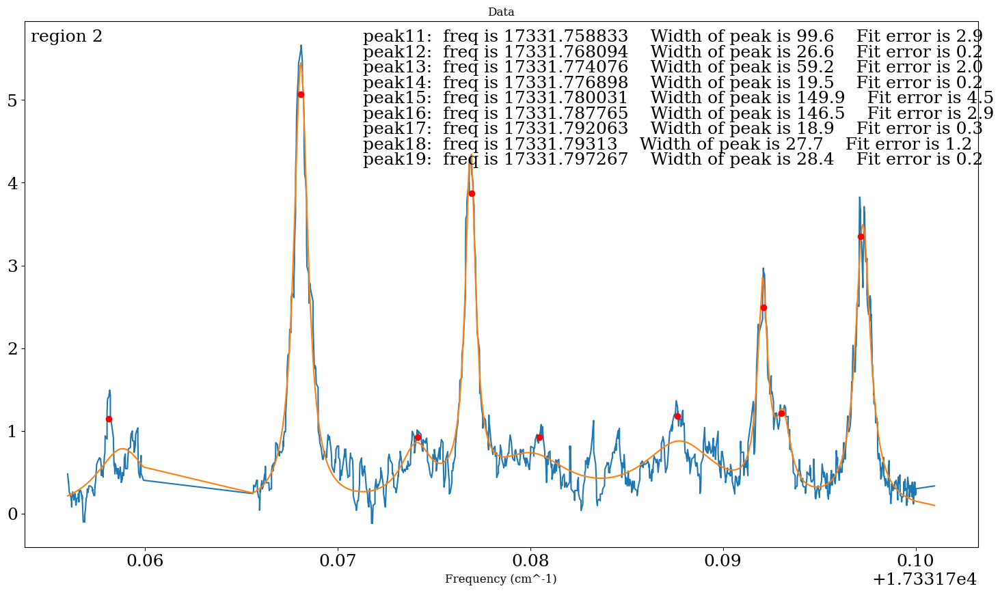

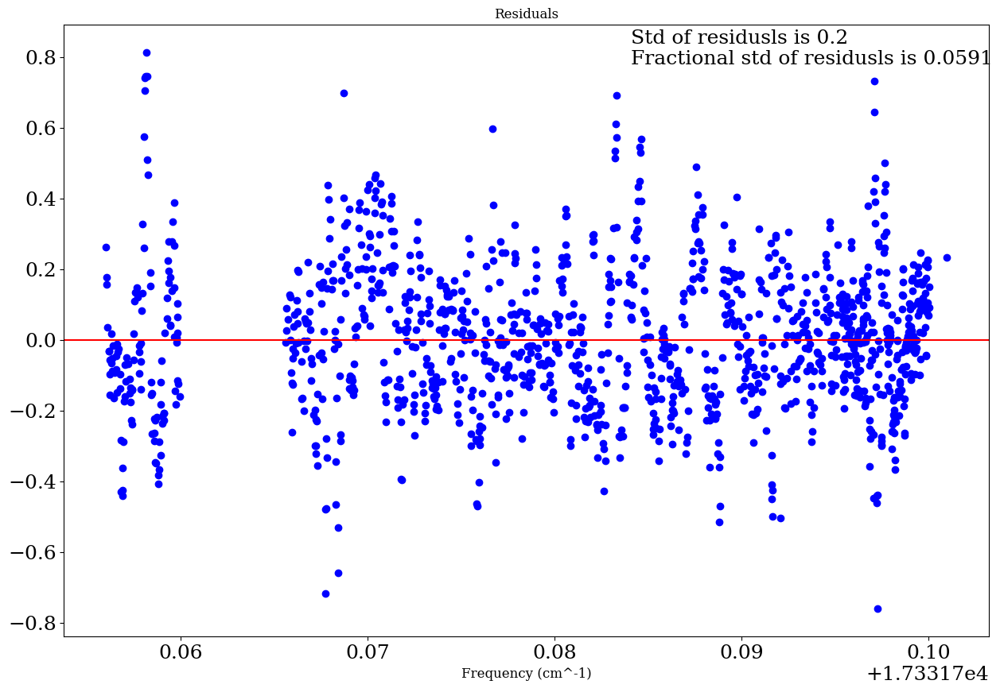

In [43]:
#pp = PdfPages('all_peak_fit_regions_first_round.pdf')

yboh = 0
for c in range(len(peaks[3])):
    lower_bound = peaks[3][c][0]
    upper_bound = peaks[3][c][1]
    number_of_peaks = peaks[3][c][2]
    remove_index = [i for i , element in enumerate(frequencies) if element > lower_bound and element < upper_bound]
    frequencies_small = [element for i , element in enumerate(frequencies) if i in remove_index]
    smooth_data_small = [element for i , element in enumerate(smooth_data) if i in remove_index]
    fit_data_small = mult_gaussian(frequencies_small,peaks[0],peaks[1],peaks[2])
    
    x = plt.figure(c*10 +1,figsize=(18,10))
    plt.plot(frequencies_small,smooth_data_small)
    plt.plot(frequencies_small,fit_data_small)
    plt.figtext(.13, .85, 'region ' + str(c) )

    for d in range(number_of_peaks):
        plt.plot(peaks[4][0][yboh],peaks[4][1][yboh], 'ro')
        plt.figtext(.4, .85 - 0.0225*d, 'peak' + str(yboh) + ':  freq is ' +  str(round(peaks[0][yboh],6)) + '    Width of peak is ' + str(round(peaks[1][yboh]*29979.2458,1)) + '    Fit error is ' + str(round(peaks[6][yboh]*29979.2458,1)))

        yboh += 1
        
    plt.title('Data',fontsize=12)
    plt.xlabel('Frequency (cm^-1)',fontsize=12)
    
    resid = smooth_data_small - fit_data_small
    
    y = plt.figure(c*10 +2,figsize=(15,10))
    plt.plot(frequencies_small, resid, 'bo')
    plt.figtext(.60, .83, 'Std of residusls is ' + str(round(resid.std(),2)) + '\nFractional std of residusls is ' + str(round(resid.std()/peaks[2][yboh-1],5)))
    plt.title('Residuals',fontsize=12)
    plt.axhline(y=0, color='r', linestyle='-')
    plt.xlabel('Frequency (cm^-1)',fontsize=12)
    plt.show()
    
    #x.savefig(pp, format='pdf')
    #y.savefig(pp, format='pdf')
    
#pp.close()    


In [38]:
peaks[0]

array([17331.58019668, 17331.58069022, 17331.589913  , 17331.59764283,
       17331.60539403, 17331.61056276, 17331.61226911, 17331.61228432,
       17331.63531658, 17331.63767563, 17331.652268  , 17331.75883341,
       17331.76809351, 17331.77407408, 17331.77689706, 17331.78003312,
       17331.78777036, 17331.79206315, 17331.79313115, 17331.79726784])

In [7]:
Assigned_lines_173 = [

#20221029
#1
{'freq': 17008.51848219,
  'ground state': {'N': 3, 'G': 3, 'F': 6, 'Parity': -1},
  'excited state': {'J': 4.5, 'F': 7, 'P': 0.5, 'Parity': 1}},


#53
{'freq': 17008.3141225,
  'ground state': {'N': 3, 'G': 2, 'F': 2, 'Parity': -1},
  'excited state': {'J': 4.5, 'F': 3, 'P': 0.5, 'Parity': 1}},
{'freq': 17008.31793572,
  'ground state': {'N': 3, 'G': 2, 'F': 3, 'Parity': -1},
  'excited state': {'J': 4.5, 'F': 4, 'P': 0.5, 'Parity': 1}},
{'freq': 17008.31793572,
  'ground state': {'N': 3, 'G': 2, 'F': 4, 'Parity': -1},
  'excited state': {'J': 4.5, 'F': 5, 'P': 0.5, 'Parity': 1}},


#79
{'freq': 17007.47130627,
  'ground state': {'N': 2, 'G': 3, 'F': 3, 'Parity': 1},
  'excited state': {'J': 3.5, 'F': 4, 'P': 0.5, 'Parity': -1}},
{'freq': 17007.47130627,
  'ground state': {'N': 2, 'G': 3, 'F': 5, 'Parity': 1},
  'excited state': {'J': 3.5, 'F': 5, 'P': 0.5, 'Parity': -1}},
{'freq': 17007.4800146,
  'ground state': {'N': 2, 'G': 3, 'F': 4, 'Parity': 1},
  'excited state': {'J': 3.5, 'F': 5, 'P': 0.5, 'Parity': -1}},
{'freq': 17007.48829558,
  'ground state': {'N': 2, 'G': 3, 'F': 5, 'Parity': 1},
  'excited state': {'J': 3.5, 'F': 6, 'P': 0.5, 'Parity': -1}},

#10
{'freq': 17006.44516427,
  'ground state': {'N': 1, 'G': 3, 'F': 3, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 3, 'P': 0.5, 'Parity': 1}},
{'freq': 17006.44871314,
  'ground state': {'N': 1, 'G': 3, 'F': 3, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 4, 'P': 0.5, 'Parity': 1}},
{'freq': 17006.4618596,
  'ground state': {'N': 1, 'G': 3, 'F': 4, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 4, 'P': 0.5, 'Parity': 1}},
{'freq': 17006.4618596,
  'ground state': {'N': 1, 'G': 3, 'F': 2, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 3, 'P': 0.5, 'Parity': 1}},



#11
{'freq': 17006.47860035,
  'ground state': {'N': 1, 'G': 3, 'F': 4, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 5, 'P': 0.5, 'Parity': 1}},

    
#12    
{'freq': 17006.25890123,
  'ground state': {'N': 1, 'G': 2, 'F': 2, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 3, 'P': 0.5, 'Parity': 1}},
{'freq': 17006.26181015,
  'ground state': {'N': 1, 'G': 2, 'F': 2, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 2, 'P': 0.5, 'Parity': 1}},
{'freq': 17006.26837488,
  'ground state': {'N': 1, 'G': 2, 'F': 3, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 3, 'P': 0.5, 'Parity': 1}},
{'freq': 17006.2718767,
  'ground state': {'N': 1, 'G': 2, 'F': 3, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 4, 'P': 0.5, 'Parity': 1}},
{'freq': 17006.27838767,
  'ground state': {'N': 1, 'G': 2, 'F': 1, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 2, 'P': 0.5, 'Parity': 1}},




#13
{'freq': 17005.49298033,
  'ground state': {'N': 2, 'G': 3, 'F': 5, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 5, 'P': 0.5, 'Parity': 1}},
{'freq': 17005.50175803,
  'ground state': {'N': 2, 'G': 3, 'F': 4, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 5, 'P': 0.5, 'Parity': 1}},


#16
{'freq': 17005.14542588,
  'ground state': {'N': 1, 'G': 3, 'F': 4, 'Parity': 1},
  'excited state': {'J': 2.5, 'F': 5, 'P': 0.5, 'Parity': -1}},



#20221030
#4
{'freq': 17006.01018119,
  'ground state': {'N': 3, 'G': 3, 'F': 4, 'Parity': 1},
  'excited state': {'J': 3.5, 'F': 5, 'P': 0.5, 'Parity': -1}},
{'freq': 17006.01498535,
  'ground state': {'N': 3, 'G': 3, 'F': 6, 'Parity': 1},
  'excited state': {'J': 3.5, 'F': 6, 'P': 0.5, 'Parity': -1}},

#5
{'freq': 17006.02774716,
  'ground state': {'N': 3, 'G': 3, 'F': 5, 'Parity': 1},
  'excited state': {'J': 3.5, 'F': 6, 'P': 0.5, 'Parity': -1}},

#6
{'freq': 17003.98609608,
  'ground state': {'N': 1, 'G': 3, 'F': 3, 'Parity': -1},
  'excited state': {'J': 0.5, 'F': 2, 'P': 0.5, 'Parity': 1}},
{'freq': 17003.9909577,
  'ground state': {'N': 1, 'G': 3, 'F': 3, 'Parity': -1},
  'excited state': {'J': 0.5, 'F': 3, 'P': 0.5, 'Parity': 1}},

#7
{'freq': 17004.00750077,
  'ground state': {'N': 1, 'G': 3, 'F': 2, 'Parity': -1},
  'excited state': {'J': 0.5, 'F': 3, 'P': 0.5, 'Parity': 1}},

#8
{'freq': 17003.79924914,
  'ground state': {'N': 1, 'G': 2, 'F': 2, 'Parity': -1},
  'excited state': {'J': 0.5, 'F': 2, 'P': 0.5, 'Parity': 1}},
{'freq': 17003.80447326,
  'ground state': {'N': 1, 'G': 2, 'F': 2, 'Parity': -1},
  'excited state': {'J': 0.5, 'F': 3, 'P': 0.5, 'Parity': 1}},
{'freq': 17003.80904211,
  'ground state': {'N': 1, 'G': 2, 'F': 3, 'Parity': -1},
  'excited state': {'J': 0.5, 'F': 2, 'P': 0.5, 'Parity': 1}},
{'freq': 17003.8141542,
  'ground state': {'N': 1, 'G': 2, 'F': 3, 'Parity': -1},
  'excited state': {'J': 0.5, 'F': 3, 'P': 0.5, 'Parity': 1}},

#9
#{'freq': 17002.57684406,
#  'ground state': {'N': 2, 'G': 3, 'F': 3, 'Parity': 1},
#  'excited state': {'J': 0.5, 'F': 3, 'P': 0.5, 'Parity': -1}},
#{'freq': 17002.58664514,
#  'ground state': {'N': 2, 'G': 3, 'F': 1, 'Parity': 1},
#  'excited state': {'J': 0.5, 'F': 2, 'P': 0.5, 'Parity': -1}},

#10
{'freq': 17002.59330309,
  'ground state': {'N': 2, 'G': 3, 'F': 2, 'Parity': 1},
  'excited state': {'J': 0.5, 'F': 2, 'P': 0.5, 'Parity': -1}},

#13
{'freq': 17002.38084004,
  'ground state': {'N': 2, 'G': 2, 'F': 4, 'Parity': 1},
  'excited state': {'J': 0.5, 'F': 3, 'P': 0.5, 'Parity': -1}},



{'freq': 17004.77567815,
  'ground state': {'N': 1, 'G': 2, 'F': 2, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 2, 'P': 0.5, 'Parity': -1}},
{'freq': 17004.78234009,
  'ground state': {'N': 1, 'G': 2, 'F': 2, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 1, 'P': 0.5, 'Parity': -1}},
{'freq': 17004.78309481,
  'ground state': {'N': 1, 'G': 2, 'F': 3, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 3, 'P': 0.5, 'Parity': -1}},
{'freq': 17004.78410737,
  'ground state': {'N': 1, 'G': 2, 'F': 3, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 2, 'P': 0.5, 'Parity': -1}},
{'freq': 17004.79050212,
  'ground state': {'N': 1, 'G': 2, 'F': 1, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 2, 'P': 0.5, 'Parity': -1}},
{'freq': 17004.79929079,
  'ground state': {'N': 1, 'G': 2, 'F': 3, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 4, 'P': 0.5, 'Parity': -1}},

{'freq': 17004.97358647,
  'ground state': {'N': 1, 'G': 3, 'F': 4, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 3, 'P': 0.5, 'Parity': -1}},
{'freq': 17004.97614301,
  'ground state': {'N': 1, 'G': 3, 'F': 2, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 3, 'P': 0.5, 'Parity': -1}},
{'freq': 17004.98423013,
  'ground state': {'N': 1, 'G': 3, 'F': 2, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 1, 'P': 0.5, 'Parity': -1}},
{'freq':  17004.98977513,
  'ground state': {'N': 1, 'G': 3, 'F': 4, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 4, 'P': 0.5, 'Parity': -1}},

{'freq':  17005.28453982,
  'ground state': {'N': 2, 'G': 2, 'F': 4, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 4, 'P': 0.5, 'Parity': 1}},
{'freq':  17005.29725497,
  'ground state': {'N': 2, 'G': 2, 'F': 2, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 1, 'P': 0.5, 'Parity': 1}},
{'freq':  17005.30131384,
  'ground state': {'N': 2, 'G': 2, 'F': 4, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 5, 'P': 0.5, 'Parity': 1}},

{'freq':  17005.46826195,
  'ground state': {'N': 2, 'G': 3, 'F': 1, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 1, 'P': 0.5, 'Parity': 1}},
{'freq':  17005.46889019,
  'ground state': {'N': 2, 'G': 3, 'F': 2, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 3, 'P': 0.5, 'Parity': 1}},
{'freq':  17005.48139103,
  'ground state': {'N': 2, 'G': 3, 'F': 3, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 4, 'P': 0.5, 'Parity': 1}},

{'freq':  17005.49302535,
  'ground state': {'N': 2, 'G': 3, 'F': 5, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 5, 'P': 0.5, 'Parity': 1}},
{'freq':  17005.50178155,
  'ground state': {'N': 2, 'G': 3, 'F': 4, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 5, 'P': 0.5, 'Parity': 1}},

{'freq':  17006.47858023,
  'ground state': {'N': 1, 'G': 3, 'F': 4, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 5, 'P': 0.5, 'Parity': 1}},


#20220729
#5
{'freq': 17004.97719029,
  'ground state': {'N': 1, 'G': 3, 'F': 3, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 4, 'P': 0.5, 'Parity': -1}},
{'freq': 17004.97719029,
  'ground state': {'N': 1, 'G': 3, 'F': 2, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 2, 'P': 0.5, 'Parity': -1}},

#89
{'freq': 17005.29231413,
  'ground state': {'N': 2, 'G': 2, 'F': 3, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 3, 'P': 0.5, 'Parity': 1}},
{'freq': 17005.29231413,
  'ground state': {'N': 2, 'G': 2, 'F': 2, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 2, 'P': 0.5, 'Parity': 1}},
{'freq': 17005.2951045,
  'ground state': {'N': 2, 'G': 2, 'F': 3, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 2, 'P': 0.5, 'Parity': 1}},


#1112
{'freq': 17005.46342705,
  'ground state': {'N': 2, 'G': 3, 'F': 1, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 2, 'P': 0.5, 'Parity': 1}},
{'freq': 17005.47186717,
  'ground state': {'N': 2, 'G': 3, 'F': 1, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 0, 'P': 0.5, 'Parity': 1}},
{'freq': 17005.47186717,
  'ground state': {'N': 2, 'G': 3, 'F': 2, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 2, 'P': 0.5, 'Parity': 1}},

#20220731
#2
{'freq': 17005.48487757,
  'ground state': {'N': 2, 'G': 3, 'F': 4, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 4, 'P': 0.5, 'Parity': 1}},

]

In [8]:
error_array = np.array([

#20221029
1.5, 
1.5, 2, 2, 
2, 2, 1.5, 1, 
1, 1.5, 2, 2,
1,
2, 2, 2, 2, 1.5,
1, 1,
1,

#20221030
1.75, 2,
2,
1, 1,
1,
2, 1, 1, 1,
#2, 2,
1.75,
2,

#20220730-0731
1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,

#20220730
2, 2,
1.5, 1.5, 1,
1, 1.5, 1.5,

#20220731
1
])

In [9]:
Assigned_lines_173_2 = [

#20221029
#1
{'freq': 17008.51848219,
  'ground state': {'N': 3, 'G': 3, 'F': 6, 'Parity': -1},
  'excited state': {'J': 4.5, 'F': 7, 'P': 0.5, 'Parity': 1}},


#53
{'freq': 17008.3141225,
  'ground state': {'N': 3, 'G': 2, 'F': 2, 'Parity': -1},
  'excited state': {'J': 4.5, 'F': 3, 'P': 0.5, 'Parity': 1}},
{'freq': 17008.31793572,
  'ground state': {'N': 3, 'G': 2, 'F': 3, 'Parity': -1},
  'excited state': {'J': 4.5, 'F': 4, 'P': 0.5, 'Parity': 1}},
{'freq': 17008.31793572,
  'ground state': {'N': 3, 'G': 2, 'F': 4, 'Parity': -1},
  'excited state': {'J': 4.5, 'F': 5, 'P': 0.5, 'Parity': 1}},


#79
{'freq': 17007.47130627,
  'ground state': {'N': 2, 'G': 3, 'F': 3, 'Parity': 1},
  'excited state': {'J': 3.5, 'F': 4, 'P': 0.5, 'Parity': -1}},
{'freq': 17007.47130627,
  'ground state': {'N': 2, 'G': 3, 'F': 5, 'Parity': 1},
  'excited state': {'J': 3.5, 'F': 5, 'P': 0.5, 'Parity': -1}},
{'freq': 17007.4800146,
  'ground state': {'N': 2, 'G': 3, 'F': 4, 'Parity': 1},
  'excited state': {'J': 3.5, 'F': 5, 'P': 0.5, 'Parity': -1}},
{'freq': 17007.48829558,
  'ground state': {'N': 2, 'G': 3, 'F': 5, 'Parity': 1},
  'excited state': {'J': 3.5, 'F': 6, 'P': 0.5, 'Parity': -1}},

#10
{'freq': 17006.44516427,
  'ground state': {'N': 1, 'G': 3, 'F': 3, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 3, 'P': 0.5, 'Parity': 1}},
{'freq': 17006.44871314,
  'ground state': {'N': 1, 'G': 3, 'F': 3, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 4, 'P': 0.5, 'Parity': 1}},
{'freq': 17006.4618596,
  'ground state': {'N': 1, 'G': 3, 'F': 4, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 4, 'P': 0.5, 'Parity': 1}},
{'freq': 17006.4618596,
  'ground state': {'N': 1, 'G': 3, 'F': 2, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 3, 'P': 0.5, 'Parity': 1}},



#11
{'freq': 17006.47860035,
  'ground state': {'N': 1, 'G': 3, 'F': 4, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 5, 'P': 0.5, 'Parity': 1}},

    
#12    
{'freq': 17006.25890123,
  'ground state': {'N': 1, 'G': 2, 'F': 2, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 3, 'P': 0.5, 'Parity': 1}},
{'freq': 17006.26181015,
  'ground state': {'N': 1, 'G': 2, 'F': 2, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 2, 'P': 0.5, 'Parity': 1}},
{'freq': 17006.26837488,
  'ground state': {'N': 1, 'G': 2, 'F': 3, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 3, 'P': 0.5, 'Parity': 1}},
{'freq': 17006.2718767,
  'ground state': {'N': 1, 'G': 2, 'F': 3, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 4, 'P': 0.5, 'Parity': 1}},
#{'freq': 17006.27838767,
#  'ground state': {'N': 1, 'G': 2, 'F': 1, 'Parity': -1},
#  'excited state': {'J': 2.5, 'F': 2, 'P': 0.5, 'Parity': 1}},




#13
{'freq': 17005.49298033,
  'ground state': {'N': 2, 'G': 3, 'F': 5, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 5, 'P': 0.5, 'Parity': 1}},
{'freq': 17005.50175803,
  'ground state': {'N': 2, 'G': 3, 'F': 4, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 5, 'P': 0.5, 'Parity': 1}},


#16
{'freq': 17005.14542588,
  'ground state': {'N': 1, 'G': 3, 'F': 4, 'Parity': 1},
  'excited state': {'J': 2.5, 'F': 5, 'P': 0.5, 'Parity': -1}},



#20221030
#4
{'freq': 17006.01018119,
  'ground state': {'N': 3, 'G': 3, 'F': 4, 'Parity': 1},
  'excited state': {'J': 3.5, 'F': 5, 'P': 0.5, 'Parity': -1}},
{'freq': 17006.01498535,
  'ground state': {'N': 3, 'G': 3, 'F': 6, 'Parity': 1},
  'excited state': {'J': 3.5, 'F': 6, 'P': 0.5, 'Parity': -1}},

#5
{'freq': 17006.02774716,
  'ground state': {'N': 3, 'G': 3, 'F': 5, 'Parity': 1},
  'excited state': {'J': 3.5, 'F': 6, 'P': 0.5, 'Parity': -1}},

#6
{'freq': 17003.98609608,
  'ground state': {'N': 1, 'G': 3, 'F': 3, 'Parity': -1},
  'excited state': {'J': 0.5, 'F': 2, 'P': 0.5, 'Parity': 1}},
{'freq': 17003.9909577,
  'ground state': {'N': 1, 'G': 3, 'F': 3, 'Parity': -1},
  'excited state': {'J': 0.5, 'F': 3, 'P': 0.5, 'Parity': 1}},

#7
{'freq': 17004.00750077,
  'ground state': {'N': 1, 'G': 3, 'F': 2, 'Parity': -1},
  'excited state': {'J': 0.5, 'F': 3, 'P': 0.5, 'Parity': 1}},

#8
{'freq': 17003.79924914,
  'ground state': {'N': 1, 'G': 2, 'F': 2, 'Parity': -1},
  'excited state': {'J': 0.5, 'F': 2, 'P': 0.5, 'Parity': 1}},
{'freq': 17003.80447326,
  'ground state': {'N': 1, 'G': 2, 'F': 2, 'Parity': -1},
  'excited state': {'J': 0.5, 'F': 3, 'P': 0.5, 'Parity': 1}},
{'freq': 17003.80904211,
  'ground state': {'N': 1, 'G': 2, 'F': 3, 'Parity': -1},
  'excited state': {'J': 0.5, 'F': 2, 'P': 0.5, 'Parity': 1}},
{'freq': 17003.8141542,
  'ground state': {'N': 1, 'G': 2, 'F': 3, 'Parity': -1},
  'excited state': {'J': 0.5, 'F': 3, 'P': 0.5, 'Parity': 1}},

#9
#{'freq': 17002.57684406,
#  'ground state': {'N': 2, 'G': 3, 'F': 3, 'Parity': 1},
#  'excited state': {'J': 0.5, 'F': 3, 'P': 0.5, 'Parity': -1}},
#{'freq': 17002.58664514,
#  'ground state': {'N': 2, 'G': 3, 'F': 1, 'Parity': 1},
#  'excited state': {'J': 0.5, 'F': 2, 'P': 0.5, 'Parity': -1}},

#10
#{'freq': 17002.59330309,
#  'ground state': {'N': 2, 'G': 3, 'F': 2, 'Parity': 1},
#  'excited state': {'J': 0.5, 'F': 2, 'P': 0.5, 'Parity': -1}},

#13
#{'freq': 17002.38084004,
#  'ground state': {'N': 2, 'G': 2, 'F': 4, 'Parity': 1},
#  'excited state': {'J': 0.5, 'F': 3, 'P': 0.5, 'Parity': -1}},



{'freq': 17004.77567815,
  'ground state': {'N': 1, 'G': 2, 'F': 2, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 2, 'P': 0.5, 'Parity': -1}},
{'freq': 17004.78234009,
  'ground state': {'N': 1, 'G': 2, 'F': 2, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 1, 'P': 0.5, 'Parity': -1}},
{'freq': 17004.78309481,
  'ground state': {'N': 1, 'G': 2, 'F': 3, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 3, 'P': 0.5, 'Parity': -1}},
{'freq': 17004.78410737,
  'ground state': {'N': 1, 'G': 2, 'F': 3, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 2, 'P': 0.5, 'Parity': -1}},
{'freq': 17004.79050212,
  'ground state': {'N': 1, 'G': 2, 'F': 1, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 2, 'P': 0.5, 'Parity': -1}},
{'freq': 17004.79929079,
  'ground state': {'N': 1, 'G': 2, 'F': 3, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 4, 'P': 0.5, 'Parity': -1}},

{'freq': 17004.97358647,
  'ground state': {'N': 1, 'G': 3, 'F': 4, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 3, 'P': 0.5, 'Parity': -1}},
{'freq': 17004.97614301,
  'ground state': {'N': 1, 'G': 3, 'F': 2, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 3, 'P': 0.5, 'Parity': -1}},
{'freq': 17004.98423013,
  'ground state': {'N': 1, 'G': 3, 'F': 2, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 1, 'P': 0.5, 'Parity': -1}},
{'freq':  17004.98977513,
  'ground state': {'N': 1, 'G': 3, 'F': 4, 'Parity': 1},
  'excited state': {'J': 1.5, 'F': 4, 'P': 0.5, 'Parity': -1}},

{'freq':  17005.28453832,
  'ground state': {'N': 2, 'G': 2, 'F': 4, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 4, 'P': 0.5, 'Parity': 1}},
{'freq':  17005.29725491,
  'ground state': {'N': 2, 'G': 2, 'F': 2, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 1, 'P': 0.5, 'Parity': 1}},
{'freq':  17005.30131422,
  'ground state': {'N': 2, 'G': 2, 'F': 4, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 5, 'P': 0.5, 'Parity': 1}},

{'freq':  17005.46826195,
  'ground state': {'N': 2, 'G': 3, 'F': 1, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 1, 'P': 0.5, 'Parity': 1}},
{'freq':  17005.46889019,
  'ground state': {'N': 2, 'G': 3, 'F': 2, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 3, 'P': 0.5, 'Parity': 1}},
{'freq':  17005.48139103,
  'ground state': {'N': 2, 'G': 3, 'F': 3, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 4, 'P': 0.5, 'Parity': 1}},

{'freq':  17005.49302535,
  'ground state': {'N': 2, 'G': 3, 'F': 5, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 5, 'P': 0.5, 'Parity': 1}},
{'freq':  17005.50178155,
  'ground state': {'N': 2, 'G': 3, 'F': 4, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 5, 'P': 0.5, 'Parity': 1}},

{'freq':  17006.47858023,
  'ground state': {'N': 1, 'G': 3, 'F': 4, 'Parity': -1},
  'excited state': {'J': 2.5, 'F': 5, 'P': 0.5, 'Parity': 1}},

                      
]


error_array_2 = np.array([
#20221029
1.5, 
1.5, 2, 2, 
2, 2, 1.5, 1, 
1, 1.5, 2, 2,
1,
#2, 2, 2, 2, 5,
2, 2, 2, 2,
1, 1,
1,
#20221030
1.75, 2,
2,
1, 1,
1,
2, 1, 1, 1,
#2, 2,
#1.75,
#2,
1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
])

In [10]:
len(Assigned_lines_173)

61

fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..


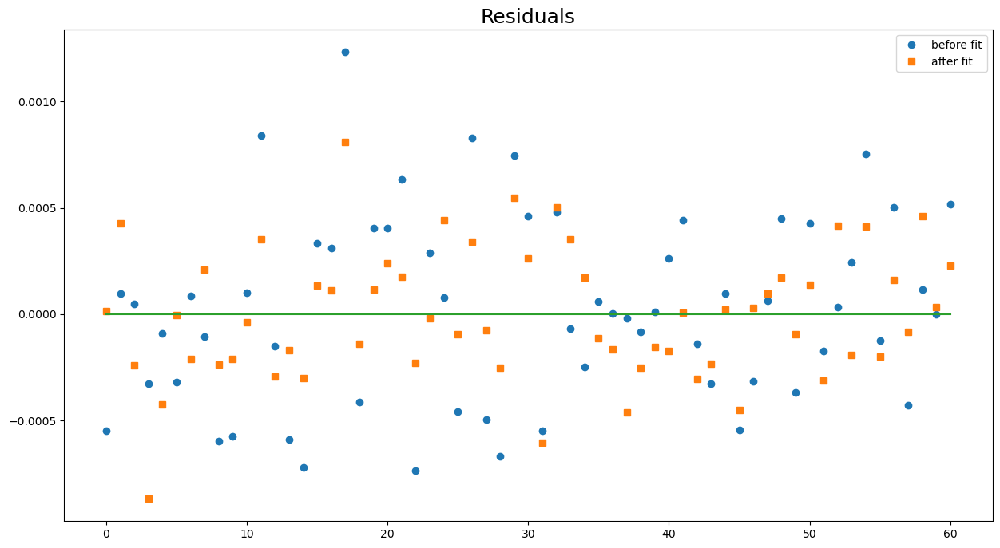

In [29]:
import numpy as np
import sympy as sy
from numpy import linalg as npLA
from scipy import linalg as sciLA
from functools import partial
import matplotlib.pyplot as plt
from copy import deepcopy
import lmfit
from scipy.special import j0
from scipy.special import j1
from scipy.special import jv
from scipy.special import dawsn



import sys
spec_pred_path=r'F:\Hutzler Lab Dropbox\HutzlerLabShared\Personal\Yuiki Takahashi\Code\Molecular_Structure\Spectrum-Prediction'
sys.path.append(spec_pred_path)
import YbOH_quantum_numbers as qn
import YbOH_matrix_elements_odd as me
import Hamiltonian_Builders as HB
from Hamiltonian_Library_class import Hamiltonian_Library
from Molecular_Spectrum_Prediction_Classes import Molecular_State
from Molecular_Spectrum_Prediction_Classes import Molecular_Transition

c_from_inversecm_to_MHz = 29979.2458

Lambda_g=0
N_range_g=[1,4]
v2_g=1
I_g=5/2
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,4]
v2_e=0
I_e=5/2
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    
    'Torg': [ 319.909322 ,'float'],
    'Be':  [ 0.24464015 ,'float'],
   'Gamma_SR': [-0.00291035,'float'],
    'qG': [4.1754e-04,'float'],
    'pG2qG': [4.3419e-04,'float'],
    'bF': [  -0.06274157,'float'],
    'c': [-0.00308005,'float'],
    'e2Qq0': [-3149/c_from_inversecm_to_MHz,'float'],
#    'epsilonaa': [4.7094e-04,'float'],

}


params_e = {  #In cm^-1
    'Torg': [17998.60268,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253185,'fix'],
    'D': [2.405*(10**(-7)),'fix'],
    'p2q': [-0.438457,'fix'],
    'p2qD': [0*3.8*(10**(-6)),'fix'],
    'a': [-0.00422,'fix'],
    'd': [ -0.00873,'fix'],
    'e2Qq0': [ -0.0642,'fix'],
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
p_test['bF_g'].min = -0.6
p_test['bF_g'].max = 0.6
p_test['c_g'].min = -0.027
p_test['c_g'].max = 0.027
p_test['e2Qq0_g'].min = -1
p_test['e2Qq0_g'].max = 1
p_test['pG2qG_g'].min = -0.05
p_test['pG2qG_g'].max = 0.05
#p_test['epsilonaa_g'].min = -0.05
#p_test['epsilonaa_g'].max = 0.05

p_test

test_result=fit_spectrum(p_test,Assigned_lines_173,ground_state_vals,excited_state_vals,Temp, isotope = 173,  uncertainty_array = error_array, TDM_type = 'aBJ No M Yuiki' )


In [30]:
0.11097468*c_from_inversecm_to_MHz

3326.9372092963445

In [31]:
3149/c_from_inversecm_to_MHz

0.10503933357789808

In [11]:
import numpy as np
import sympy as sy
from numpy import linalg as npLA
from scipy import linalg as sciLA
from functools import partial
import matplotlib.pyplot as plt
from copy import deepcopy
import lmfit
from scipy.special import j0
from scipy.special import j1
from scipy.special import jv
from scipy.special import dawsn

import sys
spec_pred_path=r'F:\Hutzler Lab Dropbox\HutzlerLabShared\Personal\Yuiki Takahashi\Code\Molecular_Structure\Spectrum-Prediction'
sys.path.append(spec_pred_path)
import YbOH_quantum_numbers as qn
import YbOH_matrix_elements_odd as me
import Hamiltonian_Builders as HB
from Hamiltonian_Library_class import Hamiltonian_Library
from Molecular_Spectrum_Prediction_Classes import Molecular_State
from Molecular_Spectrum_Prediction_Classes import Molecular_Transition

c_from_inversecm_to_MHz = 29979.2458


def Table_for_paper(Assigned_lines_for_paper,Pred):
    
    fit_total_residuals = []
    


    for N_number in range(5):
        
        for G_number in [2,3]:
            
            for parity_number in [1,-1]:
                
                for F_number in range(6):

                    for i in range(len(Assigned_lines_for_paper)):

                        f = Assigned_lines_for_paper[i]['freq']
                        Ng = Assigned_lines_for_paper[i]['ground state']['N']
                        Gg = Assigned_lines_for_paper[i]['ground state']['G']
                        Fg = Assigned_lines_for_paper[i]['ground state']['F']
                        Je = Assigned_lines_for_paper[i]['excited state']['J']
                        Fe = Assigned_lines_for_paper[i]['excited state']['F']
                        P_e_data = Assigned_lines_for_paper[i]['excited state']['P']
                        pg = Assigned_lines_for_paper[i]['ground state']['Parity']
                        if pg == 1:
                            parity_g = '+'
                            parity_e = '-'
                            pe = -1
                        if pg == -1:
                            parity_g = '-'
                            parity_e = '+'
                            pe = 1

                        '''
                        if Jg == Je:
                            pqr = 'Q'
                        elif Jg - 1 == Je:
                            pqr = 'P'
                        elif Jg + 1 == Je:
                            pqr = 'R'
                        '''


                        if (Gg == G_number) and  (Ng == N_number + 1) and (Fg == F_number) and (pg == parity_number):
                            for j in range(len(Pred)):
                                N_g_pred=Pred[j]['ground state']['N']
                                G_g_pred=Pred[j]['ground state']['G']
                                F_g_pred=Pred[j]['ground state']['F']
                                P_g_pred=Pred[j]['ground state']['P']
                                Parity_g_pred=Pred[j]['ground state']['Parity']
                                J_e_pred=Pred[j]['excited state']['J']
                                F_e_pred=Pred[j]['excited state']['F']
                                P_e_pred=Pred[j]['excited state']['P']
                                Parity_e_pred=Pred[j]['excited state']['Parity']

                                if Ng==N_g_pred and Gg==G_g_pred and Fg==F_g_pred and pg==Parity_g_pred and Je==J_e_pred and Fe==F_e_pred and pe==Parity_e_pred and P_e_data==P_e_pred:
                                    f_pred = Pred[j]['freq']



                            res = (f-f_pred)*29979.2458

                            fit_total_residuals.append(res)
                            #print('$' + pqr + '$', '  &  ', str(Ng) + ', ' + str(Jg)  + ', ' + parity_g , '  &  ', str(Je)  + ', ' + parity_e , '  &  ', round(f, 5),  '  &  ', round( res , 2) )


                            print( str(Ng) + ', ' + str(Gg) + ', ' + str(Fg)  + ', ' + parity_g , '  &  ', str(Je) + ', ' + str(Fe) + ', ' + parity_e , '  &  ', round(f, 5),  '  &  ', round( res , 2)  )


    print('# of assigned lines: ' + str(len(Assigned_lines_for_paper)) )
    print('fit residual is: ' + str(np.std(fit_total_residuals)) )

In [12]:
c_from_inversecm_to_MHz*0.00401070

120.23776113006

In [13]:

params_APi_000_173 = {  #In cm^-1
    'Torg': 17998.60268,
    'ASO': 1350,
    'Be': 0.253185,
    'D': 2.405*(10**(-7)),
    'p+2q': -0.438457,
    '(p+2q)D': 0*3.8*(10**(-6)),
    'a': -0.00422,
    'd' : -0.00873,
    'e^2Q_q0' : -0.0642,
}

H_keys_APi_000_173 =['Spin Orbit','Rotation','Lambda Doubling','Centrifugal Distortion','Lambda Doubling CD','HF a term','HF d term','Quadrupole term']

#H_keys_1768_Pi_woLD =['Spin Orbit','Rotation','Renner Teller','Spin Rotation']#,'Lambda Doubling']#,'l Doubling']


A_Pi_000_173=Molecular_State.initialize_state(1,[1,4],params_APi_000_173,H_keys_APi_000_173,v2=0,I_values=[5/2],Hunds_case='case a',isotope = 173)



        
params_XSig_010_173 = {  #In cm^-1

    'Torg': 319.909298,
    'Be':   0.24464056,
    'Gamma_SR': -0.00278598,
    'q_G':  4.0601e-04,
    'bF': -0.06272910,
    'c': -0.00401070 ,
    'e^2Q_q0' : -0.1051728,    
    'p_G+2q_G': 4.9536e-04,
    

}

H_keys_XSig_010_173 =['Rotation','Spin Rotation','l Doubling qG','Fermi Contact','HF Dipole Dipole','Quadrupole term','l Doubling pG plus 2qG']

#H_keys_1768_Pi_woLD =['Spin Orbit','Rotation','Renner Teller','Spin Rotation']#,'Lambda Doubling']#,'l Doubling']

X_Sig_010_173=Molecular_State.initialize_state(0,[1,4],params_XSig_010_173,H_keys_XSig_010_173,v2=1,I_values=[5/2],Hunds_case='case b',isotope = 173)


XSig010_to_APi000_173 = Molecular_Transition(X_Sig_010_173,A_Pi_000_173, 5, TDM_type = 'aBJ No M Chi')

In [14]:
Table_for_paper(Assigned_lines_173, XSig010_to_APi000_173.Transitions)

1, 2, 1, +   &   1.5, 2, -   &   17004.7905   &   1.63
1, 2, 2, +   &   1.5, 2, -   &   17004.77568   &   -6.7
1, 2, 2, +   &   1.5, 1, -   &   17004.78234   &   -12.09
1, 2, 3, +   &   1.5, 3, -   &   17004.78309   &   0.96
1, 2, 3, +   &   1.5, 2, -   &   17004.78411   &   -0.69
1, 2, 3, +   &   1.5, 4, -   &   17004.79929   &   -3.25
1, 2, 1, -   &   2.5, 2, +   &   17006.27839   &   40.72
1, 2, 2, -   &   2.5, 3, +   &   17006.2589   &   -21.37
1, 2, 2, -   &   2.5, 2, +   &   17006.26181   &   -25.32
1, 2, 2, -   &   0.5, 2, +   &   17003.79925   &   -18.53
1, 2, 2, -   &   0.5, 3, +   &   17003.80447   &   -23.79
1, 2, 3, -   &   2.5, 3, +   &   17006.26837   &   9.29
1, 2, 3, -   &   2.5, 4, +   &   17006.27188   &   8.62
1, 2, 3, -   &   0.5, 2, +   &   17003.80904   &   21.71
1, 2, 3, -   &   0.5, 3, +   &   17003.81415   &   13.09
1, 3, 2, +   &   1.5, 3, -   &   17004.97614   &   0.58
1, 3, 2, +   &   1.5, 1, -   &   17004.98423   &   5.91
1, 3, 2, +   &   1.5, 2, -   &   17

In [27]:
XSig010_to_APi000_173.Transitions

[{'freq': 16999.52874235447,
  'ground state': {'N': 5, 'G': 3, 'J': 4.5, 'P': 0.5, 'F': 6.0, 'Parity': -1},
  'excited state': {'J': 2.5, 'P': 0.5, 'F': 5.0, 'Parity': 1},
  'Intensity': 0.020985526744303776},
 {'freq': 16999.547982081378,
  'ground state': {'N': 5, 'G': 3, 'J': 4.5, 'P': 0.5, 'F': 5.0, 'Parity': -1},
  'excited state': {'J': 2.5, 'P': 0.5, 'F': 4.0, 'Parity': 1},
  'Intensity': 0.011127123144039398},
 {'freq': 16999.693064360894,
  'ground state': {'N': 5, 'G': 3, 'J': 4.5, 'P': 0.5, 'F': 7.0, 'Parity': -1},
  'excited state': {'J': 3.5, 'P': 0.5, 'F': 6.0, 'Parity': 1},
  'Intensity': 6.197134263984872},
 {'freq': 16999.746527812957,
  'ground state': {'N': 5, 'G': 3, 'J': 4.5, 'P': 0.5, 'F': 6.0, 'Parity': -1},
  'excited state': {'J': 3.5, 'P': 0.5, 'F': 5.0, 'Parity': 1},
  'Intensity': 4.9228788974422795},
 {'freq': 16999.74910275365,
  'ground state': {'N': 5, 'G': 3, 'J': 4.5, 'P': 0.5, 'F': 6.0, 'Parity': -1},
  'excited state': {'J': 3.5, 'P': 0.5, 'F': 6.0,

fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..


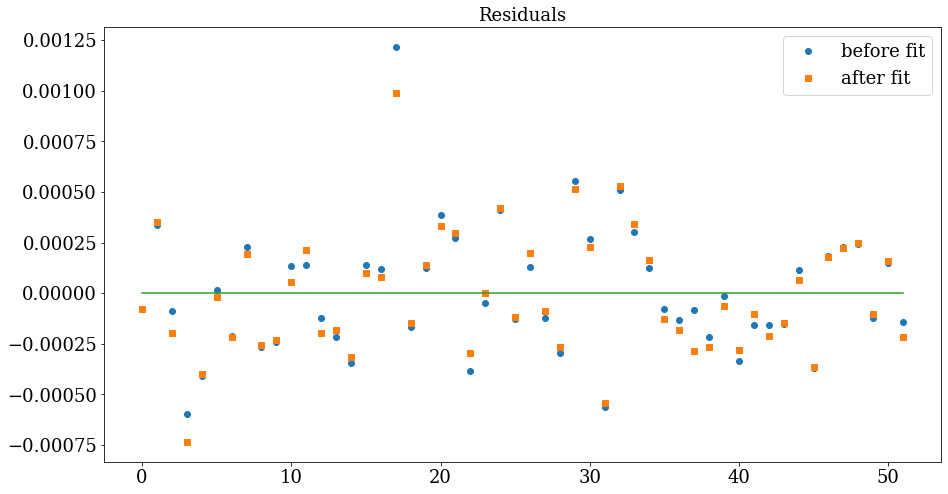

In [307]:
import numpy as np
import sympy as sy
from numpy import linalg as npLA
from scipy import linalg as sciLA
from functools import partial
import matplotlib.pyplot as plt
from copy import deepcopy
import lmfit
from scipy.special import j0
from scipy.special import j1
from scipy.special import jv
from scipy.special import dawsn

import sys
spec_pred_path=r'F:\Hutzler Lab Dropbox\HutzlerLabShared\Personal\Yuiki Takahashi\Code\Molecular_Structure\Spectrum-Prediction'
sys.path.append(spec_pred_path)
import YbOH_quantum_numbers as qn
import YbOH_matrix_elements_odd as me
import Hamiltonian_Builders as HB
from Hamiltonian_Library_class import Hamiltonian_Library
from Molecular_Spectrum_Prediction_Classes import Molecular_State
from Molecular_Spectrum_Prediction_Classes import Molecular_Transition

c_from_inversecm_to_MHz = 29979.2458

Lambda_g=0
N_range_g=[1,4]
v2_g=1
I_g=5/2
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,4]
v2_e=0
I_e=5/2
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    
    'Torg': [ 319.909340 ,'float'],
    'Be':  [ 0.24464260 ,'float'],
   'Gamma_SR': [-0.00296327,'float'],
    'qG': [4.2539e-04,'float'],
    'pG2qG': [5.7318e-04,'float'],
    'bF': [ -0.06276237,'float'],
    'c': [-0.00349393,'float'],
    'e2Qq0': [-0.10957096,'float'],
    'epsilonaa': [7.9314e-04,'float'],

}

 


params_e = {  #In cm^-1
    'Torg': [17998.60268,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253185,'fix'],
    'D': [2.405*(10**(-7)),'fix'],
    'p2q': [-0.438457,'fix'],
    'p2qD': [0*3.8*(10**(-6)),'fix'],
    'a': [-0.00422,'fix'],
    'd': [ -0.00873,'fix'],
    'e2Qq0': [ -0.0642,'fix'],
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
p_test['bF_g'].min = -0.6
p_test['bF_g'].max = 0.6
p_test['c_g'].min = -0.027
p_test['c_g'].max = 0.027
p_test['e2Qq0_g'].min = -1
p_test['e2Qq0_g'].max = 1
p_test['pG2qG_g'].min = -0.05
p_test['pG2qG_g'].max = 0.05
p_test['epsilonaa_g'].min = -0.05
p_test['epsilonaa_g'].max = 0.05

p_test

test_result=fit_spectrum(p_test,Assigned_lines_173,ground_state_vals,excited_state_vals,Temp, isotope = 173,  uncertainty_array = error_array, TDM_type = 'aBJ No M Yuiki' )


fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
[[Variables]]
    Torg_g:       319.909341 +/- 5.8034e-05 (0.00%) (init = 319.9093)
    Be_g:         0.24463966 +/- 1.7231e-05 (0.01%) (init = 0.2446

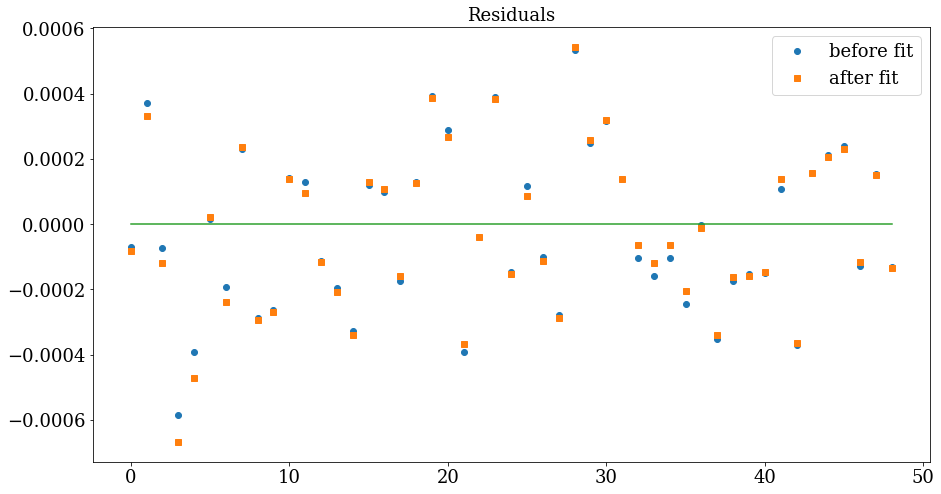

In [296]:
import numpy as np
import sympy as sy
from numpy import linalg as npLA
from scipy import linalg as sciLA
from functools import partial
import matplotlib.pyplot as plt
from copy import deepcopy
import lmfit
from scipy.special import j0
from scipy.special import j1
from scipy.special import jv
from scipy.special import dawsn

import sys
spec_pred_path=r'F:\Hutzler Lab Dropbox\HutzlerLabShared\Personal\Yuiki Takahashi\Code\Molecular_Structure\Spectrum-Prediction'
sys.path.append(spec_pred_path)
import YbOH_quantum_numbers as qn
import YbOH_matrix_elements_odd as me
import Hamiltonian_Builders as HB
from Hamiltonian_Library_class import Hamiltonian_Library
from Molecular_Spectrum_Prediction_Classes import Molecular_State
from Molecular_Spectrum_Prediction_Classes import Molecular_Transition

c_from_inversecm_to_MHz = 29979.2458

Lambda_g=0
N_range_g=[1,4]
v2_g=1
I_g=5/2
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,4]
v2_e=0
I_e=5/2
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    
    'Torg': [ 319.909330 ,'float'],
    'Be':  [ 0.24464519 ,'float'],
   'Gamma_SR': [-0.00297328,'float'],
    'qG': [4.2292e-04,'float'],
    'pG2qG': [5.6459e-04,'float'],
    'bF': [ -0.06276263,'float'],
    'c': [-0.00340131,'float'],
    'e2Qq0': [-0.10971517,'float'],
    'epsilonaa': [8.5054e-04,'float'],

}


params_e = {  #In cm^-1
    'Torg': [17998.60268,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253185,'fix'],
    'D': [2.405*(10**(-7)),'fix'],
    'p2q': [-0.438457,'fix'],
    'p2qD': [0*3.8*(10**(-6)),'fix'],
    'a': [-0.00422,'fix'],
    'd': [ -0.00873,'fix'],
    'e2Qq0': [ -0.0642,'fix'],
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
p_test['bF_g'].min = -0.6
p_test['bF_g'].max = 0.6
p_test['c_g'].min = -0.027
p_test['c_g'].max = 0.027
p_test['e2Qq0_g'].min = -1
p_test['e2Qq0_g'].max = 1
p_test['pG2qG_g'].min = -0.05
p_test['pG2qG_g'].max = 0.05
p_test['epsilonaa_g'].min = -0.05
p_test['epsilonaa_g'].max = 0.05

p_test

test_result=fit_spectrum(p_test,Assigned_lines_173_2,ground_state_vals,excited_state_vals,Temp, isotope = 173,  uncertainty_array = error_array_2, TDM_type = 'aBJ No M Yuiki' )


fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
[[Variables]]
    Torg_g:

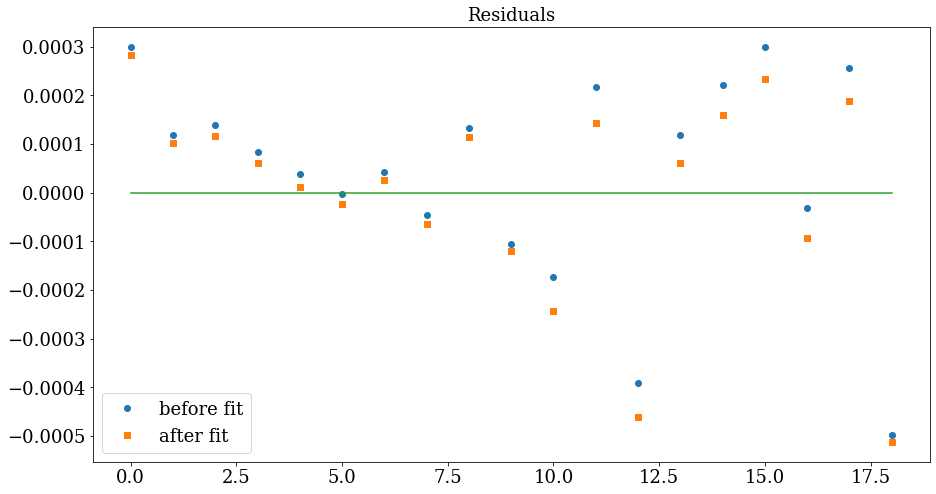

In [119]:
import numpy as np
import sympy as sy
from numpy import linalg as npLA
from scipy import linalg as sciLA
from functools import partial
import matplotlib.pyplot as plt
from copy import deepcopy
import lmfit
from scipy.special import j0
from scipy.special import j1
from scipy.special import jv
from scipy.special import dawsn

import sys
spec_pred_path=r'F:\Hutzler Lab Dropbox\HutzlerLabShared\Personal\Yuiki Takahashi\Code\Molecular_Structure\Spectrum-Prediction'
sys.path.append(spec_pred_path)
import YbOH_quantum_numbers as qn
import YbOH_matrix_elements_odd as me
import Hamiltonian_Builders as HB
from Hamiltonian_Library_class import Hamiltonian_Library
from Molecular_Spectrum_Prediction_Classes import Molecular_State
from Molecular_Spectrum_Prediction_Classes import Molecular_Transition

c_from_inversecm_to_MHz = 29979.2458

Lambda_g=0
N_range_g=[1,4]
v2_g=1
I_g=5/2
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,4]
v2_e=0
I_e=5/2
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    'Torg': [319.909446 ,'float'],
    'Be':  [ 0.24459394 ,'float'],
   'Gamma_SR': [-0.00308259,'float'],
    'qG': [4.8988e-04,'fix'],
    'bF': [-0.06275931,'float'],
    'c': [-0.00363841,'float'],
    'e2Qq0': [-0.10848369,'float'],

}



params_e = {  #In cm^-1
    'Torg': [17998.60268,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253185,'fix'],
    'D': [2.405*(10**(-7)),'fix'],
    'p2q': [-0.438457,'fix'],
    'p2qD': [0*3.8*(10**(-6)),'fix'],
    'a': [-0.00422,'fix'],
    'd': [ -0.00873,'fix'],
    'e2Qq0': [ -0.0642,'fix'],
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
p_test['bF_g'].min = -0.6
p_test['bF_g'].max = 0.6
p_test['c_g'].min = -0.027
p_test['c_g'].max = 0.027
p_test['e2Qq0_g'].min = -1
p_test['e2Qq0_g'].max = 1


p_test

test_result=fit_spectrum(p_test,Assigned_lines_173,ground_state_vals,excited_state_vals,Temp, isotope = 173)


fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
[[Variables]]
    Torg_g:      319.9094 (fixed)
    Be_g:        0.2445812 (fixed)
    Gamma_SR_g: -0.00308241 (fixed)
    qG_g:        4.7784e-04 +/- 2.3580e-05 (4.93%) (init = 0.00048988)
    bF_g:       -0.06275673 (fixed)
    c_g:        -0.00364055 (fixed)
    e2Qq0_g:    -0.1085493 (fixed)
    Torg_e:      17998.6 (fixed)
    ASO_e:       1350 (fixed)
    Be_e:        0.253185 (fixed)
    D_e:         2.405e-07 (fix

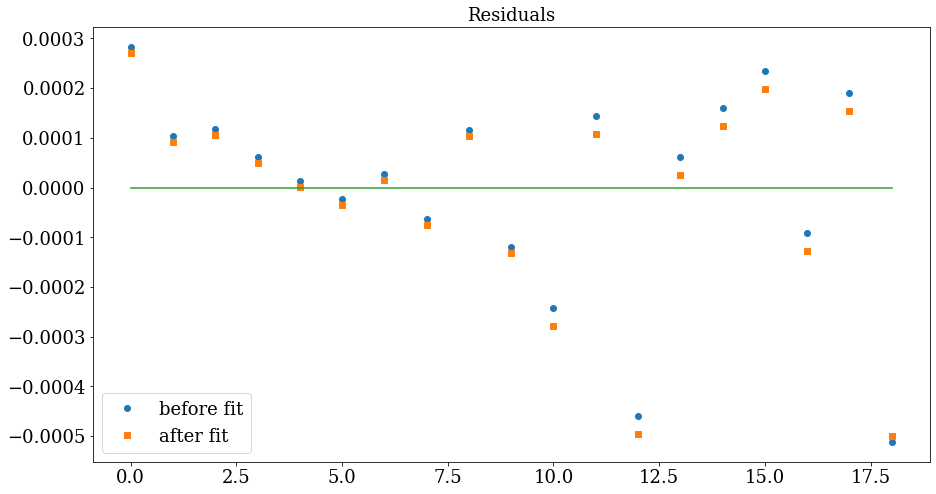

In [120]:
import numpy as np
import sympy as sy
from numpy import linalg as npLA
from scipy import linalg as sciLA
from functools import partial
import matplotlib.pyplot as plt
from copy import deepcopy
import lmfit
from scipy.special import j0
from scipy.special import j1
from scipy.special import jv
from scipy.special import dawsn

import sys
spec_pred_path=r'F:\Hutzler Lab Dropbox\HutzlerLabShared\Personal\Yuiki Takahashi\Code\Molecular_Structure\Spectrum-Prediction'
sys.path.append(spec_pred_path)
import YbOH_quantum_numbers as qn
import YbOH_matrix_elements_odd as me
import Hamiltonian_Builders as HB
from Hamiltonian_Library_class import Hamiltonian_Library
from Molecular_Spectrum_Prediction_Classes import Molecular_State
from Molecular_Spectrum_Prediction_Classes import Molecular_Transition

c_from_inversecm_to_MHz = 29979.2458

Lambda_g=0
N_range_g=[1,4]
v2_g=1
I_g=5/2
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,4]
v2_e=0
I_e=5/2
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    'Torg': [319.909443 ,'fix'],
    'Be':  [ 0.24458120 ,'fix'],
   'Gamma_SR': [-0.00308241,'fix'],
    'qG': [0.00048988,'float'],
    'bF': [ -0.06275673,'fix'],
    'c': [-0.00364055,'fix'],
    'e2Qq0': [-0.10854929,'fix'],

}



params_e = {  #In cm^-1
    'Torg': [17998.60268,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253185,'fix'],
    'D': [2.405*(10**(-7)),'fix'],
    'p2q': [-0.438457,'fix'],
    'p2qD': [0*3.8*(10**(-6)),'fix'],
    'a': [-0.00422,'fix'],
    'd': [ -0.00873,'fix'],
    'e2Qq0': [ -0.0642,'fix'],
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
p_test['bF_g'].min = -0.6
p_test['bF_g'].max = 0.6
p_test['c_g'].min = -0.027
p_test['c_g'].max = 0.027
p_test['e2Qq0_g'].min = -1
p_test['e2Qq0_g'].max = 1


p_test

test_result=fit_spectrum(p_test,Assigned_lines_173,ground_state_vals,excited_state_vals,Temp, isotope = 173)


fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
[[Variables]]
    Torg_g:      319.9094 (fixed)
    Be_g:        0.2445812 (fixed)
    Gamma_SR_g: -0.00308241 (fixed)
    qG_g:        4.7784e-04 +/- 2.3282e-05 (4.87%) (init = 0.00047784)
    bF_g:       -0.06275673 (fixed)
    c_g:        -0.00364055 (fixed)
    e2Qq0_g:    -0.1085493 (fixed)
    Torg_e:      17998.6 (fixed)
    ASO_e:       1350 (fixed)
    Be_e:        0.253185 (fixed)
    D_e:         2.405e-07 (fixed)
    p2q_e:      -0.438457 (fixed)
    p2qD_e:      0 (fixed)
    a_e:        -0.00422 (fixed)
    d_e:        -0.00873 (fixed)
    e2Qq0_e:    -0.

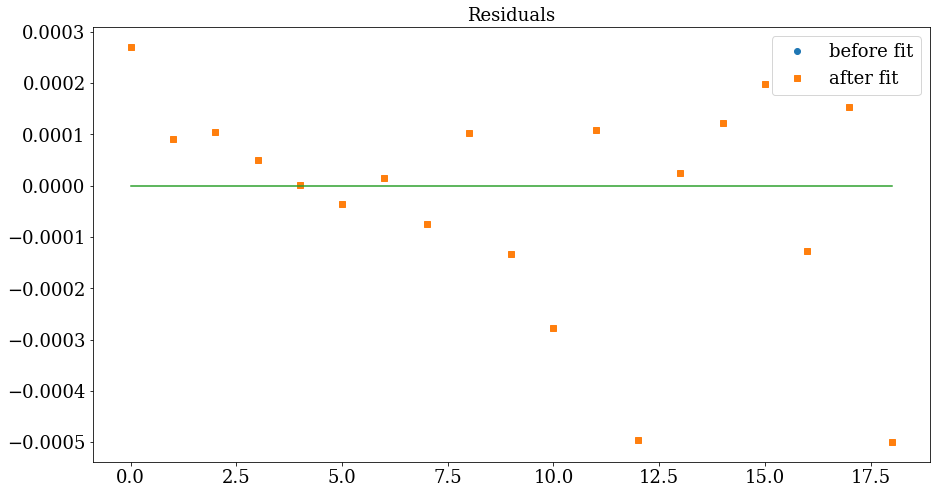

In [126]:
import numpy as np
import sympy as sy
from numpy import linalg as npLA
from scipy import linalg as sciLA
from functools import partial
import matplotlib.pyplot as plt
from copy import deepcopy
import lmfit
from scipy.special import j0
from scipy.special import j1
from scipy.special import jv
from scipy.special import dawsn

import sys
spec_pred_path=r'F:\Hutzler Lab Dropbox\HutzlerLabShared\Personal\Yuiki Takahashi\Code\Molecular_Structure\Spectrum-Prediction'
sys.path.append(spec_pred_path)
import YbOH_quantum_numbers as qn
import YbOH_matrix_elements_odd as me
import Hamiltonian_Builders as HB
from Hamiltonian_Library_class import Hamiltonian_Library
from Molecular_Spectrum_Prediction_Classes import Molecular_State
from Molecular_Spectrum_Prediction_Classes import Molecular_Transition

c_from_inversecm_to_MHz = 29979.2458

Lambda_g=0
N_range_g=[1,4]
v2_g=1
I_g=5/2
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,4]
v2_e=0
I_e=5/2
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    'Torg': [319.909443 ,'fix'],
    'Be':  [ 0.24458120 ,'fix'],
   'Gamma_SR': [-0.00308241,'fix'],
    'qG': [4.7784e-04,'float'],
    'bF': [ -0.06275673,'fix'],
    'c': [-0.00364055,'fix'],
    'e2Qq0': [-0.10854929,'fix'],

}



params_e = {  #In cm^-1
    'Torg': [17998.60268,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253185,'fix'],
    'D': [2.405*(10**(-7)),'fix'],
    'p2q': [-0.438457,'fix'],
    'p2qD': [0*3.8*(10**(-6)),'fix'],
    'a': [-0.00422,'fix'],
    'd': [ -0.00873,'fix'],
    'e2Qq0': [ -0.0642,'fix'],
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
p_test['bF_g'].min = -0.6
p_test['bF_g'].max = 0.6
p_test['c_g'].min = -0.027
p_test['c_g'].max = 0.027
p_test['e2Qq0_g'].min = -1
p_test['e2Qq0_g'].max = 1


p_test

test_result=fit_spectrum(p_test,Assigned_lines_173,ground_state_vals,excited_state_vals,Temp, isotope = 173)


fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
[[Variables]]
    Torg_g:      319.909298 +/- 8.4803e-05 (0.00%) (init = 319.9094)
    Be_g:        0.24464056 +/- 1.8113e-05 (0.01%) (init = 0.2445812)
    Gamma_SR_g: -0.002

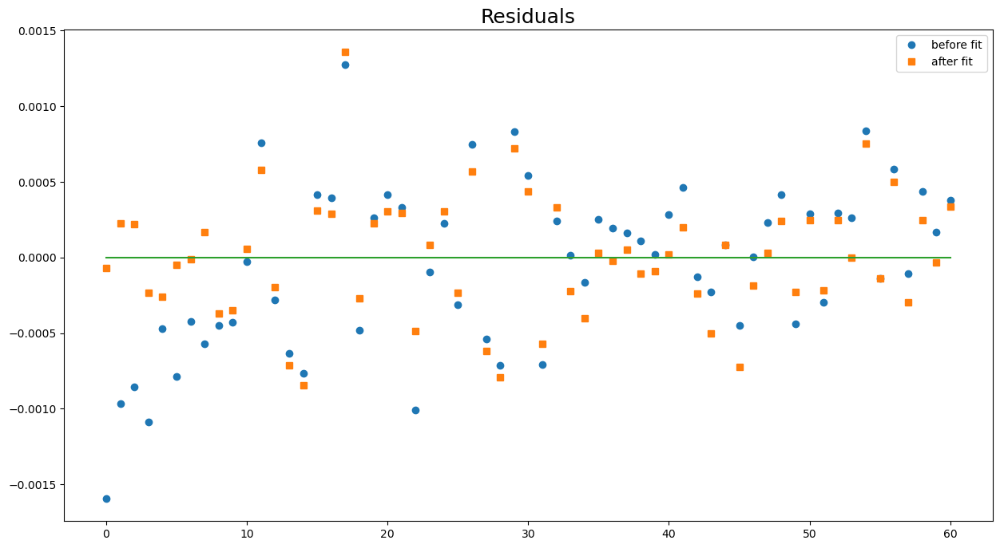

In [34]:
import numpy as np
import sympy as sy
from numpy import linalg as npLA
from scipy import linalg as sciLA
from functools import partial
import matplotlib.pyplot as plt
from copy import deepcopy
import lmfit
from scipy.special import j0
from scipy.special import j1
from scipy.special import jv
from scipy.special import dawsn

import sys
spec_pred_path=r'F:\Hutzler Lab Dropbox\HutzlerLabShared\Personal\Yuiki Takahashi\Code\Molecular_Structure\Spectrum-Prediction'
sys.path.append(spec_pred_path)
import YbOH_quantum_numbers as qn
import YbOH_matrix_elements_odd as me
import Hamiltonian_Builders as HB
from Hamiltonian_Library_class import Hamiltonian_Library
from Molecular_Spectrum_Prediction_Classes import Molecular_State
from Molecular_Spectrum_Prediction_Classes import Molecular_Transition

c_from_inversecm_to_MHz = 29979.2458

Lambda_g=0
N_range_g=[1,4]
v2_g=1
I_g=5/2
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,4]
v2_e=0
I_e=5/2
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    'Torg': [319.909443 ,'float'],
    'Be':  [ 0.24458120 ,'float'],
   'Gamma_SR': [-0.00308241,'float'],
    'qG': [4.7784e-04,'float'],
    'pG2qG': [4e-04,'float'],
    'bF': [ -0.06275673,'float'],
    'c': [-0.00364055,'float'],
    'e2Qq0': [-3153/c_from_inversecm_to_MHz,'fix'],

}



params_e = {  #In cm^-1
    'Torg': [17998.60268,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253185,'fix'],
    'D': [2.405*(10**(-7)),'fix'],
    'p2q': [-0.438457,'fix'],
    'p2qD': [0*3.8*(10**(-6)),'fix'],
    'a': [-0.00422,'fix'],
    'd': [ -0.00873,'fix'],
    'e2Qq0': [ -0.0642,'fix'],
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
p_test['bF_g'].min = -0.6
p_test['bF_g'].max = 0.6
p_test['c_g'].min = -0.027
p_test['c_g'].max = 0.027
p_test['e2Qq0_g'].min = -1
p_test['e2Qq0_g'].max = 1


p_test

test_result=fit_spectrum(p_test,Assigned_lines_173,ground_state_vals,excited_state_vals,Temp, isotope = 173)


fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
[[Variables]]
    Torg_g:      319.909427 +/- 1.0048e-04 (0.00%) (init = 319.9094)
    Be_g:        0.24462742 +/- 2.9329e-05 (0.01%) (init = 0.2445812)
    Gamma_SR_g: -0.00284086 +/- 1.1626e-04 (4.09%) (init = -0.00308241)
    qG_g:        0.00041816 (fixed)
    pG2qG_g:     0.00041111 (fixed)
    bF_g:       -0.06277208 +/- 3.6175e-05 (0.06%) (i

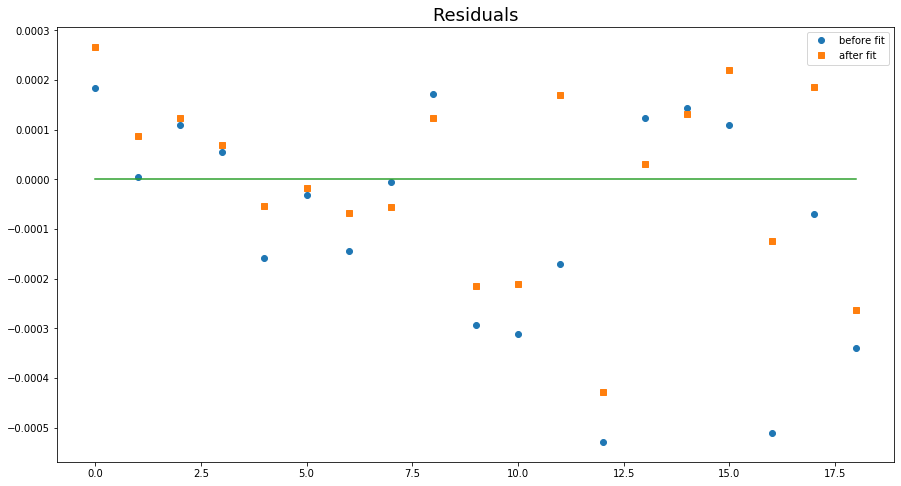

In [10]:
import numpy as np
import sympy as sy
from numpy import linalg as npLA
from scipy import linalg as sciLA
from functools import partial
import matplotlib.pyplot as plt
from copy import deepcopy
import lmfit
from scipy.special import j0
from scipy.special import j1
from scipy.special import jv
from scipy.special import dawsn

import sys
spec_pred_path=r'F:\Hutzler Lab Dropbox\HutzlerLabShared\Personal\Yuiki Takahashi\Code\Molecular_Structure\Spectrum-Prediction'
sys.path.append(spec_pred_path)
import YbOH_quantum_numbers as qn
import YbOH_matrix_elements_odd as me
import Hamiltonian_Builders as HB
from Hamiltonian_Library_class import Hamiltonian_Library
from Molecular_Spectrum_Prediction_Classes import Molecular_State
from Molecular_Spectrum_Prediction_Classes import Molecular_Transition

c_from_inversecm_to_MHz = 29979.2458

Lambda_g=0
N_range_g=[1,4]
v2_g=1
I_g=5/2
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,4]
v2_e=0
I_e=5/2
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    'Torg': [319.909443 ,'float'],
    'Be':  [ 0.24458120 ,'float'],
   'Gamma_SR': [-0.00308241,'float'],
    'qG': [4.1816e-04,'fix'],
    'pG2qG': [4.1111e-04,'fix'],
    'bF': [ -0.06275673,'float'],
    'c': [-0.00364055,'float'],
    'e2Qq0': [-0.10854929,'float'],

}



params_e = {  #In cm^-1
    'Torg': [17998.60268,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253185,'fix'],
    'D': [2.405*(10**(-7)),'fix'],
    'p2q': [-0.438457,'fix'],
    'p2qD': [0*3.8*(10**(-6)),'fix'],
    'a': [-0.00422,'fix'],
    'd': [ -0.00873,'fix'],
    'e2Qq0': [ -0.0642,'fix'],
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
p_test['bF_g'].min = -0.6
p_test['bF_g'].max = 0.6
p_test['c_g'].min = -0.027
p_test['c_g'].max = 0.027
p_test['e2Qq0_g'].min = -1
p_test['e2Qq0_g'].max = 1


p_test

test_result=fit_spectrum(p_test,Assigned_lines_173,ground_state_vals,excited_state_vals,Temp, isotope = 173)


fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
[[Variables]]
    Torg_g:

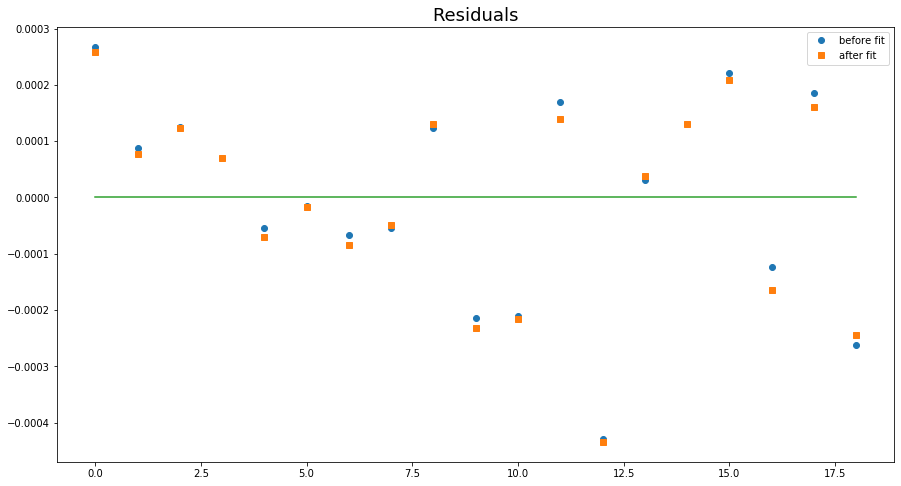

In [11]:
import numpy as np
import sympy as sy
from numpy import linalg as npLA
from scipy import linalg as sciLA
from functools import partial
import matplotlib.pyplot as plt
from copy import deepcopy
import lmfit
from scipy.special import j0
from scipy.special import j1
from scipy.special import jv
from scipy.special import dawsn

import sys
spec_pred_path=r'F:\Hutzler Lab Dropbox\HutzlerLabShared\Personal\Yuiki Takahashi\Code\Molecular_Structure\Spectrum-Prediction'
sys.path.append(spec_pred_path)
import YbOH_quantum_numbers as qn
import YbOH_matrix_elements_odd as me
import Hamiltonian_Builders as HB
from Hamiltonian_Library_class import Hamiltonian_Library
from Molecular_Spectrum_Prediction_Classes import Molecular_State
from Molecular_Spectrum_Prediction_Classes import Molecular_Transition

c_from_inversecm_to_MHz = 29979.2458

Lambda_g=0
N_range_g=[1,4]
v2_g=1
I_g=5/2
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,4]
v2_e=0
I_e=5/2
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    'Torg': [ 319.9094273 ,'fix'],
    'Be':  [ 0.2446274 ,'fix'],
   'Gamma_SR': [-0.00284086,'fix'],
    'qG': [4.1816e-04,'float'],
    'pG2qG': [4.1111e-04,'float'],
    'bF': [ -0.06277208,'fix'],
    'c': [-0.00356099,'fix'],
    'e2Qq0': [-0.10855940,'fix'],

}



params_e = {  #In cm^-1
    'Torg': [17998.60268,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253185,'fix'],
    'D': [2.405*(10**(-7)),'fix'],
    'p2q': [-0.438457,'fix'],
    'p2qD': [0*3.8*(10**(-6)),'fix'],
    'a': [-0.00422,'fix'],
    'd': [ -0.00873,'fix'],
    'e2Qq0': [ -0.0642,'fix'],
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
p_test['bF_g'].min = -0.6
p_test['bF_g'].max = 0.6
p_test['c_g'].min = -0.027
p_test['c_g'].max = 0.027
p_test['e2Qq0_g'].min = -1
p_test['e2Qq0_g'].max = 1


p_test

test_result=fit_spectrum(p_test,Assigned_lines_173,ground_state_vals,excited_state_vals,Temp, isotope = 173)


fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..
fitting is progressing..


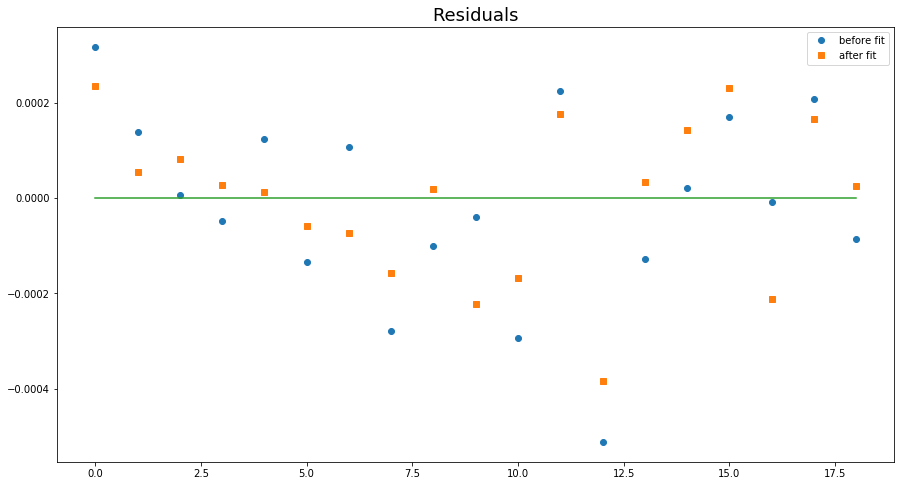

In [13]:
import numpy as np
import sympy as sy
from numpy import linalg as npLA
from scipy import linalg as sciLA
from functools import partial
import matplotlib.pyplot as plt
from copy import deepcopy
import lmfit
from scipy.special import j0
from scipy.special import j1
from scipy.special import jv
from scipy.special import dawsn

import sys
spec_pred_path=r'F:\Hutzler Lab Dropbox\HutzlerLabShared\Personal\Yuiki Takahashi\Code\Molecular_Structure\Spectrum-Prediction'
sys.path.append(spec_pred_path)
import YbOH_quantum_numbers as qn
import YbOH_matrix_elements_odd as me
import Hamiltonian_Builders as HB
from Hamiltonian_Library_class import Hamiltonian_Library
from Molecular_Spectrum_Prediction_Classes import Molecular_State
from Molecular_Spectrum_Prediction_Classes import Molecular_Transition

c_from_inversecm_to_MHz = 29979.2458

Lambda_g=0
N_range_g=[1,4]
v2_g=1
I_g=5/2
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,4]
v2_e=0
I_e=5/2
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    'Torg': [ 319.9094273 ,'float'],
    'Be':  [ 0.2446274 ,'float'],
   'Gamma_SR': [-0.00284086,'float'],
    'qG': [4.1816e-04,'float'],
    'pG2qG': [4.1111e-04,'float'],
    'bF': [ -0.06277208,'float'],
    'c': [-0.00356099,'float'],
    'e2Qq0': [-0.10855940,'float'],
    'epsilonaa': [0.0006849,'float'],

}



params_e = {  #In cm^-1
    'Torg': [17998.60268,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253185,'fix'],
    'D': [2.405*(10**(-7)),'fix'],
    'p2q': [-0.438457,'fix'],
    'p2qD': [0*3.8*(10**(-6)),'fix'],
    'a': [-0.00422,'fix'],
    'd': [ -0.00873,'fix'],
    'e2Qq0': [ -0.0642,'fix'],
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
p_test['bF_g'].min = -0.6
p_test['bF_g'].max = 0.6
p_test['c_g'].min = -0.027
p_test['c_g'].max = 0.027
p_test['e2Qq0_g'].min = -1
p_test['e2Qq0_g'].max = 1


p_test

test_result=fit_spectrum(p_test,Assigned_lines_173,ground_state_vals,excited_state_vals,Temp, isotope = 173)


C:\Users\Yuiki Takahashi\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Yuiki Takahashi\Anaconda3\lib\site-packages\ipykernel_launcher.py:173: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


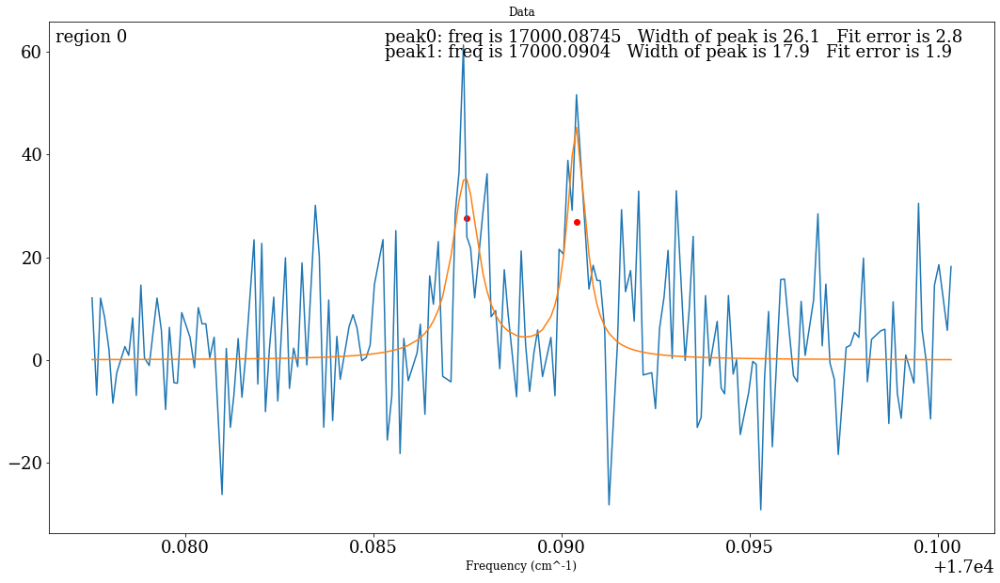

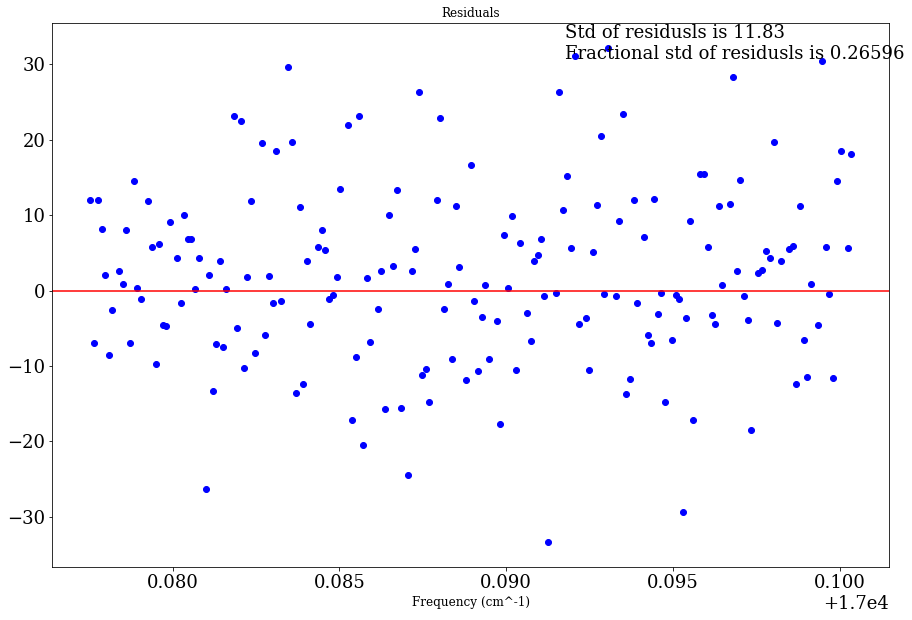

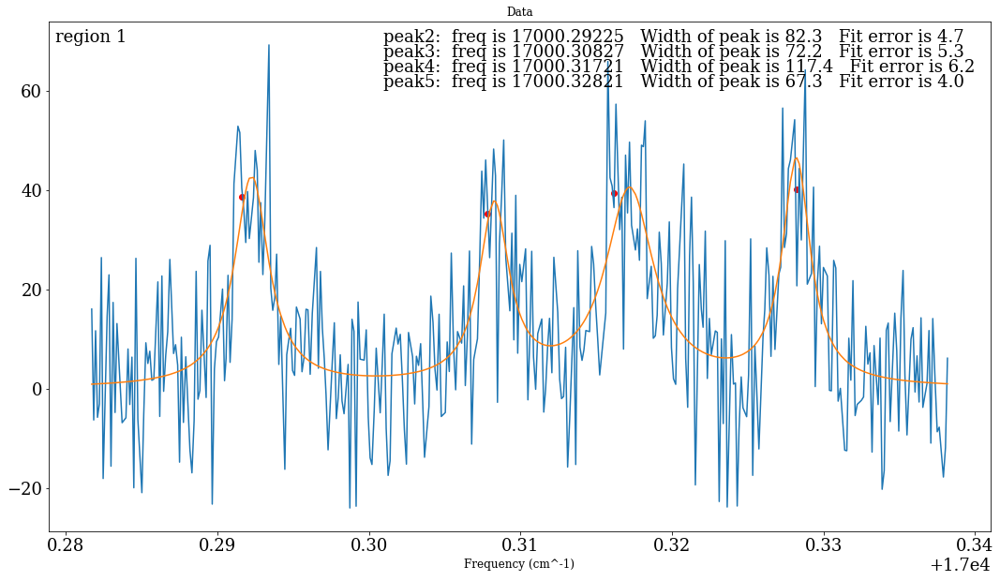

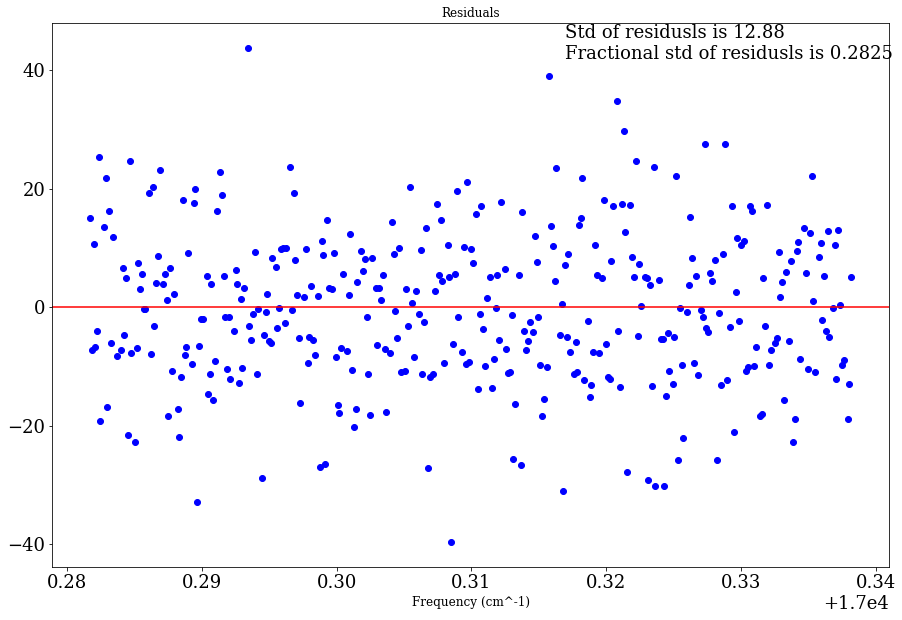

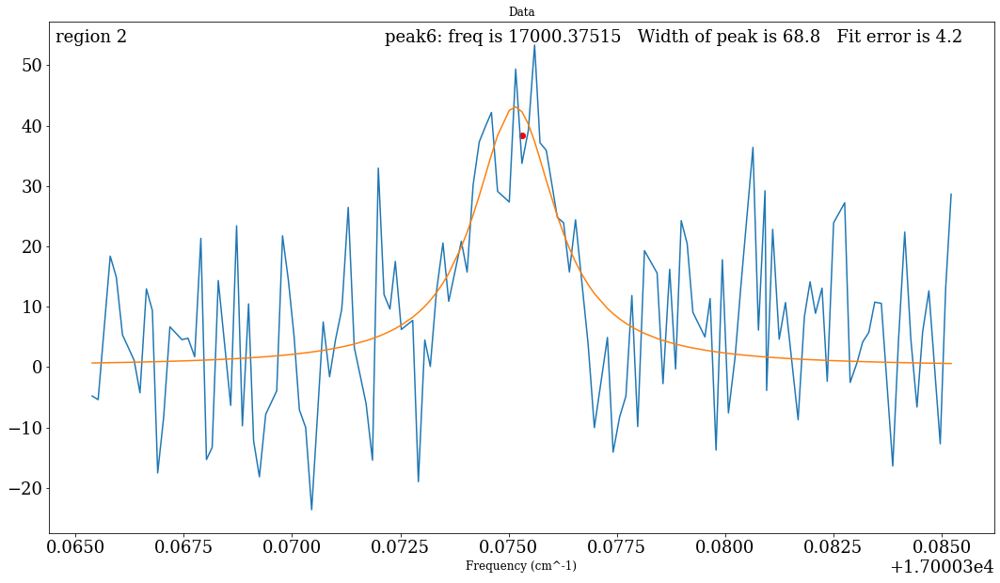

...

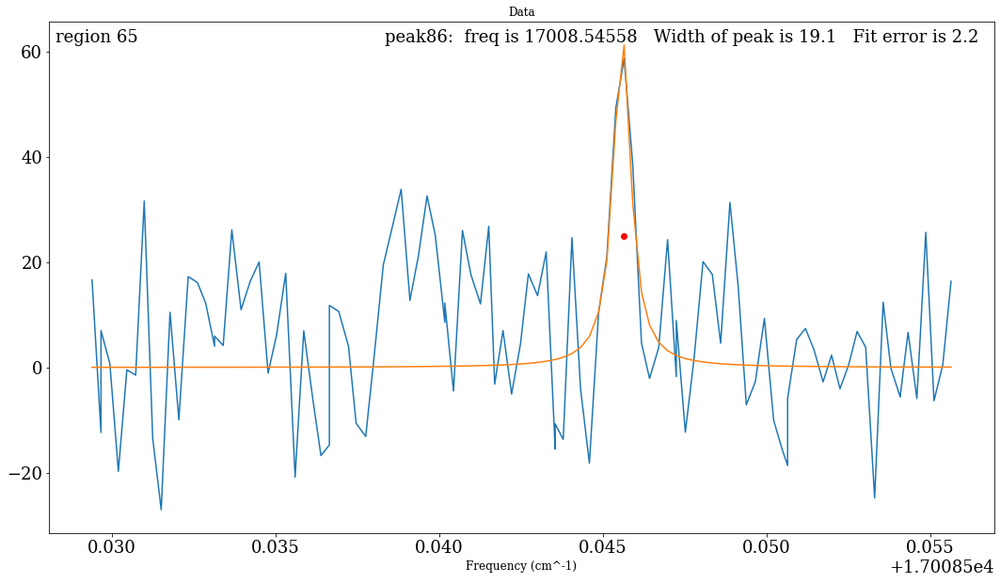

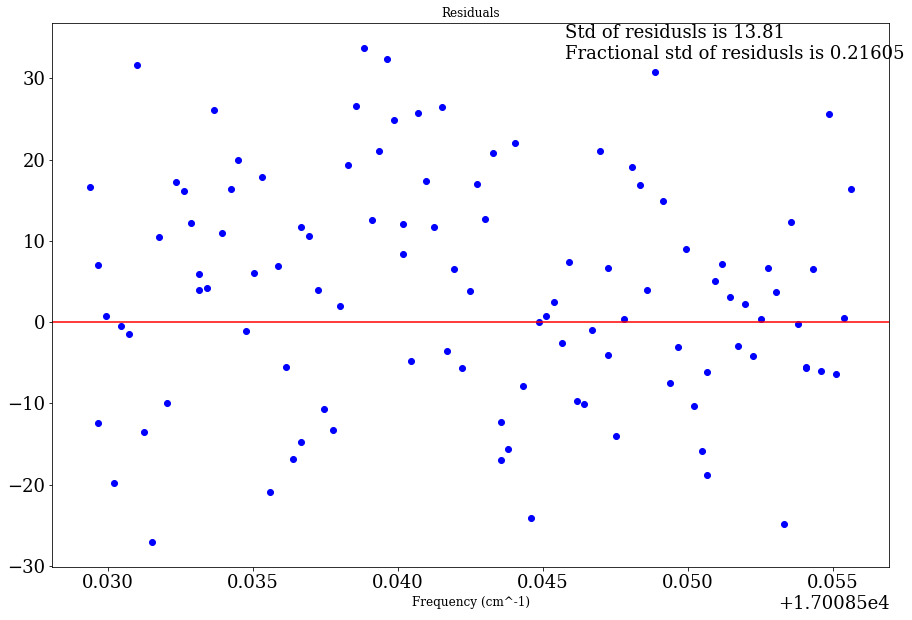

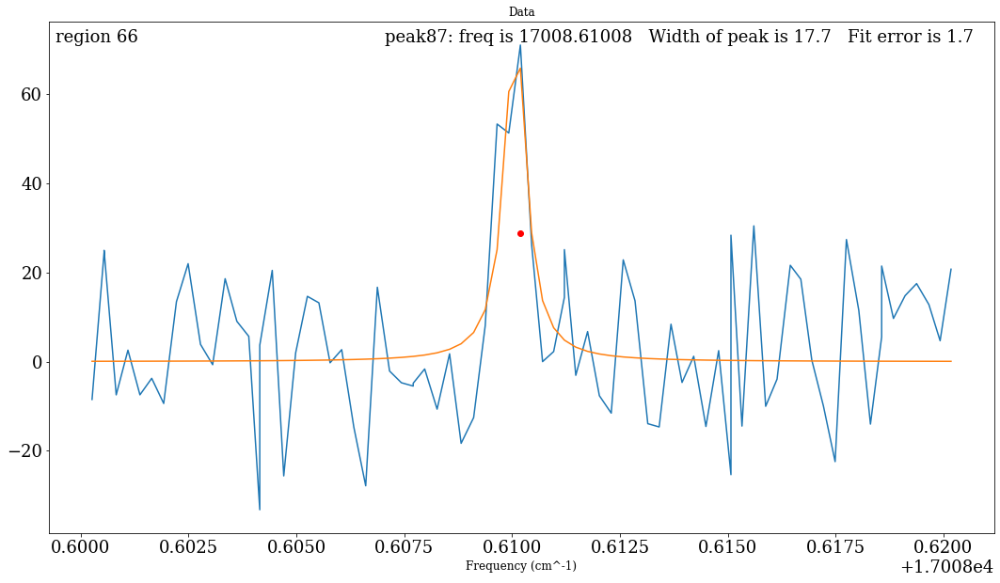

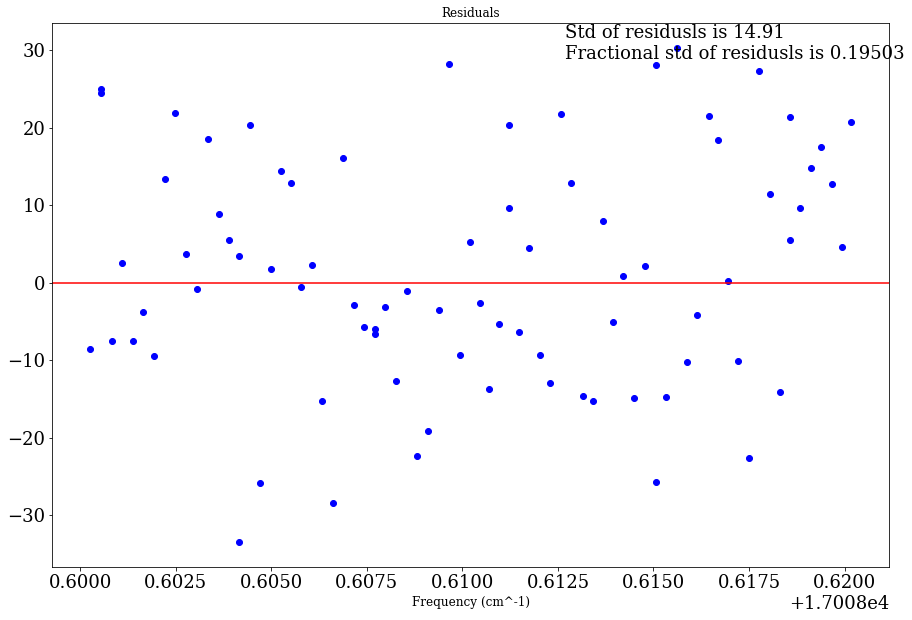

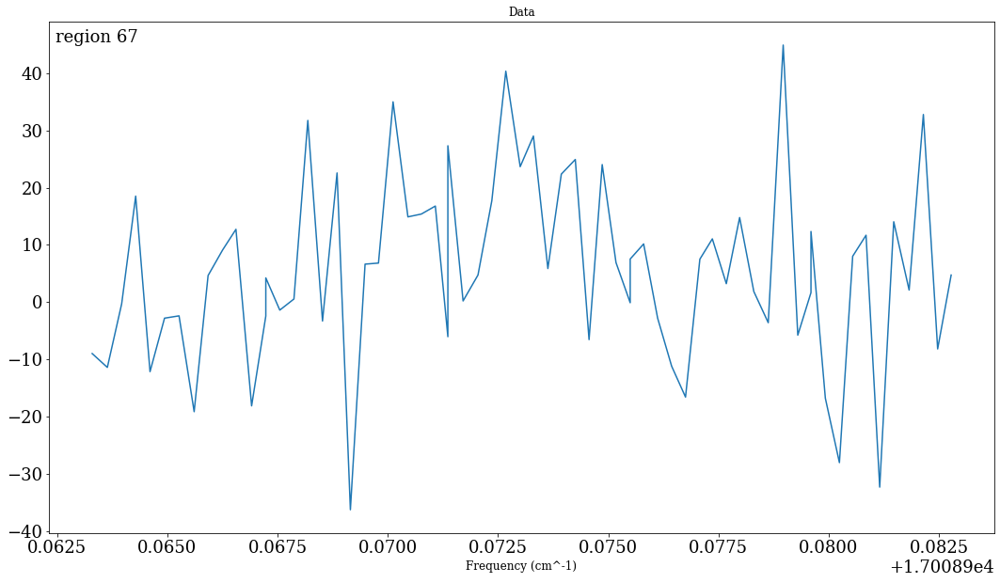

In [19]:
#pp = PdfPages('all_peak_fit_regions_second_round.pdf')

manually_remove_peaks = [5,6,22,27,34,38,39,40,48,49,52,54,57,60,64,70,74,75,78,80,81,85,86,91,94,95,96,99,100,101,104,110,111,114,116,117,118,119,122,125]
manually_add_peaks = [[23, [17003.904,0.0005,250], [17003.907,0.0005,75]] ]
#manually_add_peaks = []

fit_centers_after_manual = []
fit_widths_after_manual = []
fit_heights_after_manual = []
fit_errors_after_manual = []


yboh173 = 0
yboh = 0
for c in range(len(peaks[3])):
    number_of_useful_peaks = 0
    lower_bound = peaks[3][c][0]
    upper_bound = peaks[3][c][1]
    number_of_peaks = peaks[3][c][2]
    remove_index = [i for i , element in enumerate(frequencies) if element > lower_bound and element < upper_bound]
    frequencies_small = [element for i , element in enumerate(frequencies) if i in remove_index]
    smooth_data_small = [element for i , element in enumerate(smooth_data) if i in remove_index]

    x = plt.figure(c*10 +1,figsize=(18,10))
    
    check_if_manual_procedure_is_needed_for_this_region = False
    
    yboh5 = yboh
    for d in range(number_of_peaks):
        if yboh5  in manually_remove_peaks:                
            check_if_manual_procedure_is_needed_for_this_region = True
        
        yboh5 += 1
            
    if len(manually_add_peaks) > 0:

        for f in range(len(manually_add_peaks)):
            if c == manually_add_peaks[f][0]:
                check_if_manual_procedure_is_needed_for_this_region = True
    
    if check_if_manual_procedure_is_needed_for_this_region is False:
        fit_data_small = mult_gaussian(frequencies_small,peaks[0],peaks[1],peaks[2])
        
        number_of_useful_peaks = number_of_peaks
        
        yboh4 = yboh
        for d in range(number_of_peaks):
            plt.plot(peaks[4][0][yboh4],peaks[4][1][yboh4], 'ro')
            #plt.figtext(.59, .85 - 0.0175*d, 'peak' + str(d+1) + ': Width of peak is ' + str(round(peaks[1][yboh],6)*29979.2458) + '                 Fit error is ' + str(round(peaks[6][yboh],6)*29979.2458))
            plt.figtext(.4, .85 - 0.0225*d, 'peak' + str(yboh173) + ': freq is ' + str(round(peaks[0][yboh4],5)) + '   Width of peak is ' + str(round(peaks[1][yboh4]*29979.2458, 1)) + '   Fit error is ' + str(round(peaks[6][yboh4]*29979.2458, 1)))
            
            fit_centers_after_manual.append(peaks[0][yboh4])
            fit_widths_after_manual.append(peaks[1][yboh4])
            fit_heights_after_manual.append(peaks[2][yboh4])
            fit_errors_after_manual.append(peaks[6][yboh4])
            
            yboh173 += 1
            yboh4 += 1
        
    else:
        
        useful_peaks_in_this_region = []

        edm =0
        
        yboh3 = yboh
        
        for d in range(number_of_peaks):

            if yboh3 not in manually_remove_peaks:
                plt.plot(peaks[4][0][yboh3],peaks[4][1][yboh3], 'ro')

                useful_peaks_in_this_region.append(yboh3) 

                edm += 1

            yboh3 += 1



        if len(manually_add_peaks) > 0:

            for f in range(len(manually_add_peaks)):
                if c == manually_add_peaks[f][0]:
                    number_of_useful_peaks += len(manually_add_peaks[f])-1


        number_of_useful_peaks +=   len(useful_peaks_in_this_region)
        
        p = np.zeros((number_of_useful_peaks,3,3))
        p1 = []

        gg = 0
        for e in useful_peaks_in_this_region:
            w0 = frequencies_small[0]
            widths = peaks[1][e]
            p[gg,0,0] = peaks[0][e]-w0
            p[gg,0,1] = peaks[0][e]-w0-2*widths
            p[gg,0,2] = peaks[0][e]-w0+2*widths

            p[gg,1,0] = widths
            p[gg,1,1] = 0.25*widths
            p[gg,1,2] = 5*widths

            p[gg,2,0] = abs(peaks[2][e])
            p[gg,2,1] = 0.25*abs(peaks[2][e])
            p[gg,2,2] = 6*abs(peaks[2][e])

            p1.append([peaks[0][e]-w0-width_bound_sigma*widths, peaks[0][e]-w0+width_bound_sigma*widths])
            
            
            gg += 1

        if len(manually_add_peaks) > 0:
            for f in range(len(manually_add_peaks)):
                if c == manually_add_peaks[f][0]:
                    for hh in range(len(manually_add_peaks[f])-1):
                        widths = manually_add_peaks[f][hh+1][1]
                        p[gg,0,0] = manually_add_peaks[f][hh+1][0]-w0
                        p[gg,0,1] = manually_add_peaks[f][hh+1][0]-w0-2*widths
                        p[gg,0,2] = manually_add_peaks[f][hh+1][0]-w0+2*widths

                        p[gg,1,0] = widths
                        p[gg,1,1] = 0.25*widths
                        p[gg,1,2] = 5*widths

                        p[gg,2,0] = abs(manually_add_peaks[f][hh+1][2])
                        p[gg,2,1] = 0.25*abs(manually_add_peaks[f][hh+1][2])
                        p[gg,2,2] = 6*abs(manually_add_peaks[f][hh+1][2])

                        p1.append([manually_add_peaks[f][hh+1][0]-w0-width_bound_sigma*widths,manually_add_peaks[f][hh+1][0] -w0+width_bound_sigma*widths])


                        plt.plot(manually_add_peaks[f][hh+1][0],manually_add_peaks[f][hh+1][2], 'c*', markersize=20)
                        
                        gg += 1
    
        
        peaks_manually_added = Gaussian_fit_lmfit_yuiki2(p,p1, width_bound_sigma,frequencies_small,smooth_data_small,background_subtract =False, freq_lim =  None, plot=False, error_estimation=False, Lorentzian_mode = True, print_fit_properties = False)

        if number_of_useful_peaks > 0:
            fit_data_small = mult_gaussian(frequencies_small, peaks_manually_added[0], peaks_manually_added[1], peaks_manually_added[2])


            yboh2 = 0
            for d in range(number_of_useful_peaks):
                plt.figtext(.4, .85 - 0.0225*d, 'peak' + str(yboh173) + ':  freq is ' + str(round(peaks_manually_added[0][yboh2],5))  + '   Width of peak is ' + str(round(peaks_manually_added[1][yboh2]*29979.2458,1))  + '   Fit error is ' + str(round(peaks_manually_added[6][yboh2]*29979.2458,1)))

                fit_centers_after_manual.append(peaks_manually_added[0][yboh2])
                fit_widths_after_manual.append(peaks_manually_added[1][yboh2])
                fit_heights_after_manual.append(peaks_manually_added[2][yboh2])
                fit_errors_after_manual.append(peaks_manually_added[6][yboh2])
                
                yboh173 += 1
                yboh2 += 1
                            

    plt.plot(frequencies_small,smooth_data_small)
    if number_of_useful_peaks > 0:
        plt.plot(frequencies_small,fit_data_small)
    plt.figtext(.13, .85, 'region ' + str(c) )
    
    for d in range(number_of_peaks):
        yboh += 1

        
    plt.title('Data',fontsize=12)
    plt.xlabel('Frequency (cm^-1)',fontsize=12)
    
    if number_of_useful_peaks > 0:
        resid = smooth_data_small - fit_data_small

        y = plt.figure(c*10 +2,figsize=(15,10))
        plt.plot(frequencies_small, resid, 'bo')
        plt.figtext(.60, .83, 'Std of residusls is ' + str(round(resid.std(),2)) + '\nFractional std of residusls is ' + str(round(resid.std()/peaks[2][yboh-1],5)))
        plt.title('Residuals',fontsize=12)
        plt.axhline(y=0, color='r', linestyle='-')
        plt.xlabel('Frequency (cm^-1)',fontsize=12)
    
    #x.savefig(pp, format='pdf')
    #y.savefig(pp, format='pdf')
#pp.close()    


Text(0.5, 0, 'Peak width (MHz)')

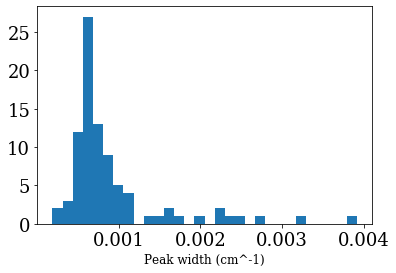

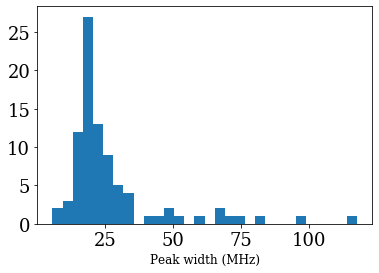

In [20]:
#pp = PdfPages('fitted_peak_widths_unnormalized.pdf')

x = plt.figure(1)
plt.hist(fit_widths_after_manual,30)
plt.xlabel('Peak width (cm^-1)',fontsize=12)

y = plt.figure(2)
plt.hist(np.array(fit_widths_after_manual)*29979.2458,30)
plt.xlabel('Peak width (MHz)',fontsize=12)

#x.savefig(pp, format='pdf')
#y.savefig(pp, format='pdf')
    
#pp.close()    

In [23]:
identified_peaks_separated = fit_centers_after_manual
identified_peaks_separated_error = fit_errors_after_manual

In [ ]:
save_json_data(identified_peaks_separated,'X010-A000_identified_peaks',ujson=True)
save_json_data(identified_peaks_separated_error,'X010-A000_identified_peaks_error',ujson=True)

In [26]:
identified_peaks_separated = get_json_data('X010-A000_identified_peaks' ,numpy=True,ujson=True)
identified_peaks_separated_error = get_json_data('X010-A000_identified_peaks_error',numpy=True,ujson=False)

In [28]:
fit_centers_after_manual = identified_peaks_separated 
fit_errors_after_manual = identified_peaks_separated_error

In [198]:
#save_json_data(peaks_20220222,'2022_0222_all_peaks',ujson=True)

Data saved to 2022_0222_all_peaks.json


Combo-Difference

In [11]:
import numpy as np
import sympy as sy
from numpy import linalg as npLA
from scipy import linalg as sciLA
from functools import partial
import matplotlib.pyplot as plt
from copy import deepcopy

import sys
#spec_pred_path=r'C:\Users\Yuiki Takahashi\Dropbox (Hutzler Lab)\HutzlerLabShared\Personal\NickPilgram\Code\Molecular Structure\Spectrum-Prediction'
spec_pred_path=r'C:\Users\Yuiki Takahashi\Dropbox (Hutzler Lab)\HutzlerLabShared\Personal\Yuiki Takahashi\Code\Molecular_Structure\Spectrum-Prediction'
sys.path.append(spec_pred_path)
import YbOH_quantum_numbers as qn
import YbOH_matrix_elements as me
import Hamiltonian_Builders as HB
from Hamiltonian_Library_class import Hamiltonian_Library
from Molecular_Spectrum_Prediction_Classes import Molecular_State
from Molecular_Spectrum_Prediction_Classes import Molecular_Transition

def Find_Combo_Diff(Data,data_er,States,State_err,abs_freq_err,Delta_F_or_J='J',print_output=True,hit_criteria=0.001, print_table = False, print_table_all = False):
    
    print('The criteria for hit is', hit_criteria, 'cm-1\n')
    
    all_hit_lines = []
    
    data_err=np.zeros(len(data_er))
    for ii in range(len(data_er)):
        data_err[ii]=np.sqrt((data_er[ii]**2.)+(abs_freq_err**2.))
    
    
    data_diff={
        'Diff':[],
        'Lines 1':[],
        'Lines 2':[],
        'Error': []
    }
    for i in range(len(Data)):
        for j in range(i+1,len(Data)):
            data_diff['Diff'].append(abs(Data[i]-Data[j]))
            data_diff['Lines 1'].append(Data[i])
            data_diff['Lines 2'].append(Data[j])
            data_diff['Error'].append(np.sqrt((data_err[i]**2.)+(data_err[j]**2.)+(State_err**2.)+(State_err**2.)))
            
    Hits={
        'Hit Num':0,
        'Lines': [],
        'State 1':[],
        'State 2':[],
        'Diff':[],
    }
    
    for k in range(len(States)):
        for kk in range(k+1,len(States)):
            if abs(States[k][Delta_F_or_J]-States[kk][Delta_F_or_J])<=2 and States[k]['Parity']==States[kk]['Parity']:
                States_Diff=abs(States[k]['E']-States[kk]['E'])
                for kkk in range(len(data_diff['Diff'])):
                    if abs(data_diff['Diff'][kkk]-States_Diff)<=hit_criteria: #abs(data_diff['Error'][kkk]):
                        Hits['Hit Num']=Hits['Hit Num']+1
                        Hits['Lines'].append({'Line 1': data_diff['Lines 1'][kkk],'Line 2':data_diff['Lines 2'][kkk]})
                        Hits['State 1'].append(States[k])
                        Hits['State 2'].append(States[kk])
                        Hits['Diff'].append(data_diff['Diff'][kkk]-States_Diff)
                        all_hit_lines.append(data_diff['Lines 1'][kkk])
                        all_hit_lines.append(data_diff['Lines 2'][kkk])

    
    all_hit_unique_lines = np.unique(all_hit_lines)
                        
    if print_table is not False:
        for iiii in range(len(Hits['Lines'])):
            if Hits['Lines'][iiii]['Line 1'] == print_table or Hits['Lines'][iiii]['Line 2']  == print_table:
                print(Hits['Lines'][iiii]['Line 1'])
                print(Hits['Lines'][iiii]['Line 2'])
                print(Hits['State 1'][iiii])
                print(Hits['State 2'][iiii])
                print(Hits['Diff'][iiii]*29979.2458, 'MHz')
                print('\n') 
                
    if print_table_all:
        for e in range(len(all_hit_unique_lines)):
            line_looking_at = all_hit_unique_lines[e]
            print('The combo-diff for line ', line_looking_at, '\n')
            for iiii in range(len(Hits['Lines'])):
                if Hits['Lines'][iiii]['Line 1'] == line_looking_at or Hits['Lines'][iiii]['Line 2']  == line_looking_at:
                    print(Hits['Lines'][iiii]['Line 1'])
                    print(Hits['Lines'][iiii]['Line 2'])
                    print(Hits['State 1'][iiii])
                    print(Hits['State 2'][iiii])
                    print(Hits['Diff'][iiii]*29979.2458, 'MHz')
                    print('\n') 
                
                    
    if print_output==True:
        print('Number of Combo Diff Hits', Hits['Hit Num'])
        print('\n')
        for iii in range(len(Hits['Lines'])):
            print(iii)
            print(Hits['Lines'][iii]['Line 1'])
            print(Hits['Lines'][iii]['Line 2'])
            print(Hits['State 1'][iii])
            print(Hits['State 2'][iii])
            print(Hits['Diff'][iii]*29979.2458, 'MHz')
            print('\n')

                        
                        
    return Hits

In [30]:
X010_lines = identified_peaks_separated
X010_line_errs = identified_peaks_separated_error
freq_cal_err=0.0002 #cm^-1

In [50]:
params_APi_000 = {  #In cm^-1
    'Torg': 17998.5875,
    'ASO': 1350,
    'Be':  0.253052,
    'D': 2.319*(10**(-7)),
    'p+2q': -0.43807,#
    '(p+2q)D': 3.8*(10**(-6)),
    'bF': 0,
    'c' : 0,
}

H_keys_APi_000 =['Spin Orbit','Rotation','Lambda Doubling','Centrifugal Distortion']

#H_keys_1768_Pi_woLD =['Spin Orbit','Rotation','Renner Teller','Spin Rotation']#,'Lambda Doubling']#,'l Doubling']


A_Pi_000=Molecular_State.initialize_state(1,[1,8],params_APi_000,H_keys_APi_000,v2=0,I_values=[0])

A_Pi_000_err=1.7*(10**(-4.))


In [51]:
X010_A000_Combo_Diffs=Find_Combo_Diff(X010_lines,X010_line_errs,A_Pi_000.state_eval_designation,A_Pi_000_err,freq_cal_err,Delta_F_or_J='J',print_table_all = True, print_table = False, print_output=False,  hit_criteria = 0.001)

The criteria for hit is 0.001 cm-1

The combo-diff for line  17000.090398560722 

17000.090398560722
17000.32821233967
{'E': 17326.52167257637, 'J': 2.5, 'P': 0.5, 'F': 2.5, 'Parity': 1}
{'E': 17326.759417886067, 'J': 3.5, 'P': 0.5, 'F': 3.5, 'Parity': 1}
2.052656570374431 MHz


The combo-diff for line  17000.2922538192 

17000.2922538192
17004.91374651503
{'E': 17326.759417886067, 'J': 3.5, 'P': 0.5, 'F': 3.5, 'Parity': 1}
{'E': 17331.381194374397, 'J': 5.5, 'P': 0.5, 'F': 5.5, 'Parity': 1}
-8.507885069372389 MHz


17000.2922538192
17000.73328389561
{'E': 17334.00961114007, 'J': 5.5, 'P': 0.5, 'F': 5.5, 'Parity': -1}
{'E': 17334.450960400885, 'J': 6.5, 'P': 0.5, 'F': 6.5, 'Parity': -1}
-9.568907713873843 MHz


The combo-diff for line  17000.308267445853 

17000.308267445853
17000.749379082263
{'E': 17334.00961114007, 'J': 5.5, 'P': 0.5, 'F': 5.5, 'Parity': -1}
{'E': 17334.450960400885, 'J': 6.5, 'P': 0.5, 'F': 6.5, 'Parity': -1}
-7.12380043628005 MHz


The combo-diff for line  17000.3

27.91887165881005 MHz


17003.905288565547
17004.07429330646
{'E': 17325.03763119519, 'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': -1}
{'E': 17325.207462946044, 'J': 2.5, 'P': 0.5, 'F': 2.5, 'Parity': -1}
-24.793134234412186 MHz


The combo-diff for line  17003.906970538075 

17003.906970538075
17004.009147437195
{'E': 17324.0595867681, 'J': 0.5, 'P': 0.5, 'F': 0.5, 'Parity': 1}
{'E': 17324.16149128761, 'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': 1}
8.165735269170817 MHz


17003.906970538075
17006.36950333901
{'E': 17324.0595867681, 'J': 0.5, 'P': 0.5, 'F': 0.5, 'Parity': 1}
{'E': 17326.52167257637, 'J': 2.5, 'P': 0.5, 'F': 2.5, 'Parity': 1}
13.40050295579817 MHz


17003.906970538075
17006.50414643732
{'E': 17324.16149128761, 'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': 1}
{'E': 17326.759417886067, 'J': 3.5, 'P': 0.5, 'F': 3.5, 'Parity': 1}
-22.505396183246784 MHz


The combo-diff for line  17003.92083413967 

17001.561393285378
17003.92083413967
{'E': 17324.16149128761, 'J': 1.5, 'P': 0.5, 'F': 1.5

{'E': 17331.381194374397, 'J': 5.5, 'P': 0.5, 'F': 5.5, 'Parity': 1}
12.682329865229649 MHz


17006.455604847033
17006.829792391243
{'E': 17331.007684840653, 'J': 4.5, 'P': 0.5, 'F': 4.5, 'Parity': 1}
{'E': 17331.381194374397, 'J': 5.5, 'P': 0.5, 'F': 5.5, 'Parity': 1}
20.32624243915812 MHz


17003.03274298838
17006.829792391243
{'E': 18685.48269527772, 'J': 6.5, 'P': 1.5, 'F': 6.5, 'Parity': -1}
{'E': 18689.278810590848, 'J': 7.5, 'P': 1.5, 'F': 7.5, 'Parity': -1}
28.003305737045956 MHz


17003.03274298838
17006.829792391243
{'E': 18685.482700452383, 'J': 6.5, 'P': 1.5, 'F': 6.5, 'Parity': 1}
{'E': 18689.27880282928, 'J': 7.5, 'P': 1.5, 'F': 7.5, 'Parity': 1}
28.39112417490246 MHz


The combo-diff for line  17007.282793770333 

17005.004360166826
17007.282793770333
{'E': 18677.130890338136, 'J': 3.5, 'P': 1.5, 'F': 3.5, 'Parity': 1}
{'E': 18679.40870741555, 'J': 4.5, 'P': 1.5, 'F': 4.5, 'Parity': 1}
18.482987281957364 MHz


17005.004360166826
17007.282793770333
{'E': 18677.1308912623,

In [52]:
X010_A000_Combo_Diffs=Find_Combo_Diff(X010_lines,X010_line_errs,A_Pi_000.state_eval_designation,A_Pi_000_err,freq_cal_err,Delta_F_or_J='J',print_table_all = False, print_table = False, print_output=True, hit_criteria = 0.001)

The criteria for hit is 0.001 cm-1

Number of Combo Diff Hits 80


0
17001.82123929486
17003.237164182618
{'E': 17323.6215167681, 'J': 0.5, 'P': 0.5, 'F': 0.5, 'Parity': -1}
{'E': 17325.03763119519, 'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': -1}
-5.682246237658601 MHz


1
17002.48827449972
17003.905288565547
{'E': 17323.6215167681, 'J': 0.5, 'P': 0.5, 'F': 0.5, 'Parity': -1}
{'E': 17325.03763119519, 'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': -1}
26.97049082420139 MHz


2
17002.48827449972
17003.903930532226
{'E': 17323.6215167681, 'J': 0.5, 'P': 0.5, 'F': 0.5, 'Parity': -1}
{'E': 17325.03763119519, 'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': -1}
-13.74232392845921 MHz


3
17003.46834462022
17004.884559882204
{'E': 17323.6215167681, 'J': 0.5, 'P': 0.5, 'F': 0.5, 'Parity': -1}
{'E': 17325.03763119519, 'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': -1}
3.022954005953242 MHz


4
17004.49913245522
17005.91496237113
{'E': 17323.6215167681, 'J': 0.5, 'P': 0.5, 'F': 0.5, 'Parity': -1}
{'E': 17325.03763119519, 

Predict spectrum from guessed molecular parameteres

In [31]:
def Find_close_peaks_to_prediction(Measured_lines,Predicted_transitions,hit_criteria=0.001, print_output=True):
    
    print('The criteria for hit is', hit_criteria, 'cm-1\n')
    
    
    Hits={
    'Hit Num':0,
    'Lines': [],
    'ground state':[],
    'excited state':[],
    'Diff':[],
    }
    
    
    for k in range(len(Measured_lines)):
        
        for kk in range(len(Predicted_transitions.frequencies)):
            
            if abs(Measured_lines[k] - Predicted_transitions.frequencies[kk]) <= hit_criteria:            

                Hits['Hit Num']=Hits['Hit Num']+1
                Hits['Lines'].append({'Measured line': Measured_lines[k],'Predicted line': Predicted_transitions.frequencies[kk]})
                Hits['ground state'].append(Predicted_transitions.Transitions[kk]['ground state'])
                Hits['excited state'].append(Predicted_transitions.Transitions[kk]['excited state'])
                Hits['Diff'].append(Measured_lines[k] - Predicted_transitions.frequencies[kk])

                
    if print_output==True:
        print('Number of Hits', Hits['Hit Num'])
        print('\n')
        for iii in range(len(Hits['Lines'])):
            print(Hits['Lines'][iii]['Measured line'])
            print(Hits['Lines'][iii]['Predicted line'])
            print(Hits['ground state'][iii])
            print(Hits['excited state'][iii])
            print(Hits['Diff'][iii]*29979.2458, 'MHz')
            print('\n')

    return Hits

Guessed paramters for prediction

In [54]:

params_APi_000 = {  #In cm^-1
    'Torg': 17998.5875,
    'ASO': 1350,
    'Be': 0.253052,
    'D': 2.319*(10**(-7)),
    'p+2q': -0.43807,#
    '(p+2q)D': 3.8*(10**(-6)),
    'bF': 0,
    'c' : 0,
}

H_keys_APi_000 =['Spin Orbit','Rotation','Lambda Doubling','Centrifugal Distortion','Lambda Doubling CD']

#H_keys_1768_Pi_woLD =['Spin Orbit','Rotation','Renner Teller','Spin Rotation']#,'Lambda Doubling']#,'l Doubling']


A_Pi_000=Molecular_State.initialize_state(1,[1,5],params_APi_000,H_keys_APi_000,v2=0,I_values=[0],Hunds_case='case a')

params_XSig_010 = {  #In cm^-1
    'Torg': 319.908907,
    'Be':   0.24442604,
    'Gamma_SR': -0.00312193,
    'q_G': 4.9209e-04,
#    'gamma g epsilon aa':6.4039e-04,
}

H_keys_XSig_010 =['Rotation','Spin Rotation','l Doubling qG']

#H_keys_1768_Pi_woLD =['Spin Orbit','Rotation','Renner Teller','Spin Rotation']#,'Lambda Doubling']#,'l Doubling']


X_Sig_010=Molecular_State.initialize_state(0,[1,4],params_XSig_010,H_keys_XSig_010,v2=1,I_values=[0],Hunds_case='case b')


XSig010_to_APi000 = Molecular_Transition(X_Sig_010,A_Pi_000, 4)

from case (a) to case (b) transition


C:\Users\Yuiki Takahashi\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys


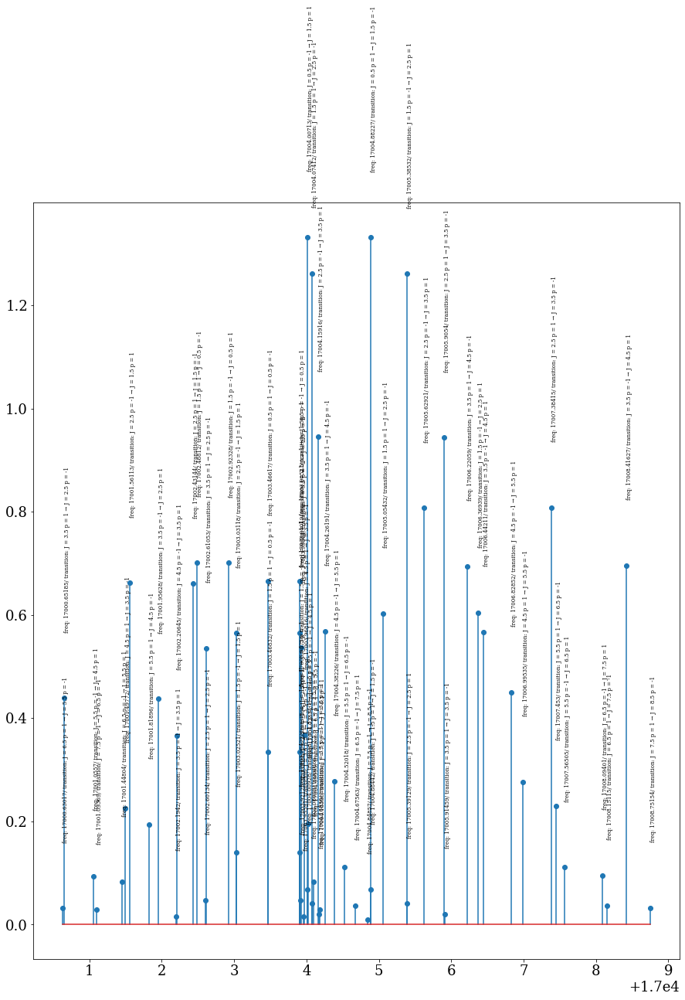

In [27]:
plt.figure(figsize=(15,18))
remove_index = [i for i , element in enumerate(XSig010_to_APi000.frequencies) if element > 17000 and element < 17009]
XSig010_to_APi000.frequencies = [element for i , element in enumerate(XSig010_to_APi000.frequencies) if i in remove_index]
XSig010_to_APi000.Intensities = [element for i , element in enumerate(XSig010_to_APi000.Intensities) if i in remove_index]
XSig010_to_APi000.Transitions = [element for i , element in enumerate(XSig010_to_APi000.Transitions) if i in remove_index]

plt.stem(XSig010_to_APi000.frequencies,XSig010_to_APi000.Intensities)

for i in range(len(XSig010_to_APi000.frequencies)):
    plt.text(XSig010_to_APi000.frequencies[i] , 
                    XSig010_to_APi000.Intensities[i] + 0.13, 'freq: ' + str(round(XSig010_to_APi000.frequencies[i],5))
                    +'/ transition: J = '+ str(XSig010_to_APi000.Transitions[i]['ground state']['J']) 
                    + ' p = ' + str(XSig010_to_APi000.Transitions[i]['ground state']['Parity']) + ' → J = ' 
                    + str(XSig010_to_APi000.Transitions[i]['excited state']['J']) + ' p = ' 
                    + str(XSig010_to_APi000.Transitions[i]['excited state']['Parity']), fontsize=7, rotation=90)


In [28]:
XSig010_to_APi000.frequencies[48]

17005.914544935065

In [99]:
XSig010_to_APi000.Transitions

[{'freq': 16998.03167767799,
  'ground state': {'N': 7, 'J': 6.5, 'P': 0.5, 'F': 6.5, 'Parity': -1},
  'excited state': {'J': 5.5, 'P': 0.5, 'F': 5.5, 'Parity': 1}},
 {'freq': 16998.887584662796,
  'ground state': {'N': 6, 'J': 5.5, 'P': 0.5, 'F': 5.5, 'Parity': 1},
  'excited state': {'J': 4.5, 'P': 0.5, 'F': 4.5, 'Parity': -1}},
 {'freq': 16999.761159885053,
  'ground state': {'N': 5, 'J': 4.5, 'P': 0.5, 'F': 4.5, 'Parity': -1},
  'excited state': {'J': 3.5, 'P': 0.5, 'F': 3.5, 'Parity': 1}},
 {'freq': 17000.63035316382,
  'ground state': {'N': 7, 'J': 6.5, 'P': 0.5, 'F': 6.5, 'Parity': 1},
  'excited state': {'J': 5.5, 'P': 0.5, 'F': 5.5, 'Parity': -1}},
 {'freq': 17000.652427677647,
  'ground state': {'N': 4, 'J': 3.5, 'P': 0.5, 'F': 3.5, 'Parity': 1},
  'excited state': {'J': 2.5, 'P': 0.5, 'F': 2.5, 'Parity': -1}},
 {'freq': 17001.055767429883,
  'ground state': {'N': 6, 'J': 5.5, 'P': 0.5, 'F': 5.5, 'Parity': -1},
  'excited state': {'J': 4.5, 'P': 0.5, 'F': 4.5, 'Parity': 1}},


In [55]:
Hits = Find_close_peaks_to_prediction(identified_peaks_separated,XSig010_to_APi000,hit_criteria=0.00085, print_output=True)

The criteria for hit is 0.00085 cm-1

Number of Hits 29


17001.561393285378
17001.56114057421
{'N': 3, 'J': 2.5, 'P': 0.5, 'F': 2.5, 'Parity': -1}
{'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': 1}
7.576090230469849 MHz


17002.207592865925
17002.20754942759
{'N': 4, 'J': 4.5, 'P': 1.5, 'F': 4.5, 'Parity': -1}
{'J': 3.5, 'P': 0.5, 'F': 3.5, 'Parity': 1}
1.302248565086288 MHz


17002.43122616474
17002.431345014887
{'N': 3, 'J': 2.5, 'P': 0.5, 'F': 2.5, 'Parity': 1}
{'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': -1}
-3.563037808740861 MHz


17002.48827449972
17002.488053461646
{'N': 2, 'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': 1}
{'J': 0.5, 'P': 0.5, 'F': 0.5, 'Parity': -1}
6.626554736766125 MHz


17002.601175906137
17002.60124325504
{'N': 3, 'J': 2.5, 'P': 0.5, 'F': 2.5, 'Parity': 1}
{'J': 2.5, 'P': 0.5, 'F': 2.5, 'Parity': -1}
-2.0190693728438447 MHz


17002.611395286767
17002.611262077156
{'N': 3, 'J': 3.5, 'P': 1.5, 'F': 3.5, 'Parity': 1}
{'J': 2.5, 'P': 0.5, 'F': 2.5, 'Parity': -1}
3.993523664928

In [263]:
plt.figure(173,figsize=(900,20))
plt.plot(frequencies,smooth_data)
plt.plot(frequencies,mult_gaussian(frequencies,fit_centers_after_manual,fit_widths_after_manual,fit_heights_after_manual))


remove_index = [i for i , element in enumerate(XSig010_to_APi000.frequencies) if element > 17000 and element < 17009]
XSig010_to_APi000.frequencies = [element for i , element in enumerate(XSig010_to_APi000.frequencies) if i in remove_index]
Intensities = [400 * element for i , element in enumerate(XSig010_to_APi000.Intensities) if i in remove_index]
XSig010_to_APi000.Transitions = [element for i , element in enumerate(XSig010_to_APi000.Transitions) if i in remove_index]

plt.stem(XSig010_to_APi000.frequencies,Intensities,'c')

for i in range(len(XSig010_to_APi000.frequencies)):
    Ng = XSig010_to_APi000.Transitions[i]['ground state']['N']
    Jg = XSig010_to_APi000.Transitions[i]['ground state']['J']
    Je = XSig010_to_APi000.Transitions[i]['excited state']['J']
    pg = XSig010_to_APi000.Transitions[i]['ground state']['Parity']
    if pg == 1:
        parity_g = '+'
    if pg == -1:
        parity_g = '-'
    if Jg == Je:
        pqr = 'Q'
    elif Jg - 1 == Je:
        pqr = 'P'
    elif Jg + 1 == Je:
        pqr = 'R'
    
    plt.text(XSig010_to_APi000.frequencies[i]  , 
                    Intensities[i] + 10, '↓ ' + pqr + ' ('+ str(Ng)+ ', ' + str(Jg) + ', ' + parity_g + ')', fontsize=20, rotation=0)

plt.text(17000.05, 1150, 'ΔJ (Ng, Jg, parityg)', fontsize=20, rotation=0)

#plt.stem(XSig010_to_APi000.frequencies,XSig010_to_APi000.Intensities*800,'c')
plt.xlim(17000,17009)
plt.xlabel('Frequency (cm^-1)')
plt.ylabel('UnNormalized Fluorescence (arb)')
plt.title('X(010) - A(000) Spectra')
plt.xticks(np.linspace(17000,17009,181))
plt.tight_layout()
plt.savefig('all_fitted_spectra_with_prediction_4K_with_27_lines.svg')

C:\Users\Yuiki Takahashi\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  # This is added back by InteractiveShellApp.init_path()


In [255]:
plt.figure(173,figsize=(900,20))
plt.plot(frequencies,smooth_data)
plt.plot(frequencies,mult_gaussian(frequencies,fit_centers_after_manual,fit_widths_after_manual,fit_heights_after_manual))


remove_index = [i for i , element in enumerate(XSig010_to_APi000.frequencies) if element > 17003.9 and element < 17004.5]
XSig010_to_APi000.frequencies = [element for i , element in enumerate(XSig010_to_APi000.frequencies) if i in remove_index]
Intensities = [660 * element for i , element in enumerate(XSig010_to_APi000.Intensities) if i in remove_index]
XSig010_to_APi000.Transitions = [element for i , element in enumerate(XSig010_to_APi000.Transitions) if i in remove_index]

plt.stem(XSig010_to_APi000.frequencies,Intensities,'c')

for i in range(len(XSig010_to_APi000.frequencies)):
    Ng = XSig010_to_APi000.Transitions[i]['ground state']['N']
    Jg = XSig010_to_APi000.Transitions[i]['ground state']['J']
    Je = XSig010_to_APi000.Transitions[i]['excited state']['J']
    pg = XSig010_to_APi000.Transitions[i]['ground state']['Parity']
    if pg == 1:
        parity_g = '+'
    if pg == -1:
        parity_g = '-'
    if Jg == Je:
        pqr = 'Q'
    elif Jg - 1 == Je:
        pqr = 'P'
    elif Jg + 1 == Je:
        pqr = 'R'
    
    plt.text(XSig010_to_APi000.frequencies[i]   , 
                    Intensities[i] + 10, '↓ ' + pqr + ' ('+ str(Ng)+ ', ' + str(Jg) + ', ' + parity_g + ')', fontsize=20, rotation=0)

plt.text(17003.905 , 1600, 'ΔJ (Ng, Jg, parityg)', fontsize=20, rotation=0)

#plt.stem(XSig010_to_APi000.frequencies,XSig010_to_APi000.Intensities*800,'c')
plt.xlim(17003.9,17004.5)
plt.xlabel('Frequency (cm^-1)')
plt.ylabel('UnNormalized Fluorescence (arb)')
plt.title('X(010) - A(000) Spectra')
plt.xticks(np.linspace(17003.9,17004.5,121))
plt.savefig('all_fitted_spectra_with_prediction_4K_bandhead_with_27_lines.svg')

C:\Users\Yuiki Takahashi\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  # This is added back by InteractiveShellApp.init_path()


In [56]:
def Assigne_lines_from_results_of_close_to_prediction(Hits):
        
    Assignments = [None]*len(Hits['ground state'])
    
    for k in range(len(Hits['ground state'])):
         Assignments[k] = {'freq':Hits['Lines'][k]['Measured line'], 'ground state':{'N':Hits['ground state'][k]['N'],'J':Hits['ground state'][k]['J'],'P':Hits['ground state'][k]['P'],'Parity':Hits['ground state'][k]['Parity']},'excited state':{'J':Hits['excited state'][k]['J'],'P':Hits['excited state'][k]['P'],'Parity':Hits['excited state'][k]['Parity']}}

    return Assignments

In [57]:
Assignments = Assigne_lines_from_results_of_close_to_prediction(Hits)

In [58]:
Assignments

[{'freq': 17001.561393285378,
  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17002.207592865925,
  'ground state': {'N': 4, 'J': 4.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17002.43122616474,
  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.48827449972,
  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.601175906137,
  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.611395286767,
  'ground state': {'N': 3, 'J': 3.5, 'P': 1.5, 'Parity': 1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.923246359198,
  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 0.5

In [106]:
Assignments.append({'freq': 17002.207592865925, 'ground state': {'N': 4, 'J': 4.5, 'P': 0.5, 'Parity': -1} ,'excited state': {'J': 3.5, 'P': 0.5, 'Parity': 1} })
Assignments.append({'freq': 17002.611395286767, 'ground state': {'N': 3, 'J': 3.5, 'P': 0.5, 'Parity': 1} ,'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1} })
Assignments.append({'freq': 17003.903930532226, 'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': 1} ,'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1} })
Assignments.append({'freq': 17003.92083413967, 'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': -1} ,'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1} })
Assignments.append({'freq': 17004.007647939918, 'ground state': {'N': 1, 'J': 0.5, 'P': 0.5, 'Parity': -1} ,'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1} })
Assignments.append({'freq': 17006.221471788347, 'ground state': {'N': 3, 'J': 3.5, 'P': 0.5, 'Parity': 1} ,'excited state': {'J': 4.5, 'P': 0.5, 'Parity': -1} })
Assignments.append({'freq': 17006.829792391243, 'ground state': {'N': 4, 'J': 4.5, 'P': 0.5, 'Parity': -1} ,'excited state': {'J': 5.5, 'P': 0.5, 'Parity': 1} })

{'freq': 17006.442094771188,
 'ground state': {'N': 4, 'J': 3.5, 'P': 0.5, 'Parity': -1},
 'excited state': {'J': 4.5, 'P': 0.5, 'Parity': 1}}

In [220]:
Assignments

[{'freq': 17001.561393285378,
  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17001.82123929486,
  'ground state': {'N': 5, 'J': 5.5, 'P': 1.5, 'Parity': 1},
  'excited state': {'J': 4.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.207592865925,
  'ground state': {'N': 4, 'J': 4.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17002.43122616474,
  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.48827449972,
  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.601175906137,
  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.611395286767,
  'ground state': {'N': 3, 'J': 3.5, 'P': 1.5, 'Parity': 1},
  'excited state': {'J': 2.5, 

Fitting assigned lines with prediction to obtain better molecular constants

In [223]:
def Sort_Assigned_lines_by_quantum_number(Assignments, States):
    
    for k in range(10):
        for j in range(10):
            for pa in range(2):
                transitions_out_of_this_state = []
                for i in range(len(Assignments)):
                    Ng = Assignments[i]['ground state']['N']
                    pg = Assignments[i]['ground state']['Parity']
                    Jg = Assignments[i]['ground state']['J']
                    
                    if Ng == k:
                        if 2*pa - 1 == pg:
                            if j + 0.5 == Jg:
                                Je = Assignments[i]['excited state']['J']
                                freq = Assignments[i]['freq']
                                Ng_print = Ng
                                Jg_print = Jg
                                if pg == 1:
                                    parity_g = '+'
                                if pg == -1:
                                    parity_g = '-'
                                if Jg == Je:
                                    pqr = 'Q'
                                elif Jg - 1 == Je:
                                    pqr = 'P'
                                elif Jg + 1 == Je:
                                    pqr = 'R'
                                parity_g_print = parity_g
                                #print('state: '+ str(Ng)+ ', ' + str(Jg) + ', ' + parity_g + pqr)
                                transitions_out_of_this_state.append(pqr)
                                
                                for y in range(len(States)):
                                    if States[y]['J'] == Je and States[y]['P'] == 0.5 and States[y]['Parity'] == -pg:
                                        y_new = y

                if len(transitions_out_of_this_state) > 0:
                    print( 'N = '+ str(Ng_print)+ ', J = ' + str(Jg_print) + ', ' + parity_g_print + '   energy:' + str(np.round(States[y_new]['E'] - freq,4))  + '  transitions: ', transitions_out_of_this_state)



In [224]:
Sort_Assigned_lines_by_quantum_number(Assignments,A_Pi_000.state_eval_designation)

N = 1, J = 0.5, -   energy:320.1539  transitions:  ['Q', 'R']
N = 1, J = 0.5, +   energy:320.1552  transitions:  ['R']
N = 1, J = 1.5, -   energy:320.1521  transitions:  ['P', 'Q', 'R']
N = 1, J = 1.5, +   energy:320.1532  transitions:  ['P', 'Q', 'R']
N = 2, J = 1.5, -   energy:321.1363  transitions:  ['P', 'Q', 'R']
N = 2, J = 1.5, +   energy:321.1332  transitions:  ['P', 'Q', 'R']
N = 2, J = 2.5, -   energy:321.1297  transitions:  ['P', 'Q', 'R']
N = 3, J = 2.5, -   energy:322.6008  transitions:  ['P', 'Q']
N = 3, J = 2.5, +   energy:322.6063  transitions:  ['P', 'Q', 'R']
N = 3, J = 3.5, +   energy:322.5961  transitions:  ['P', 'Q', 'R']
N = 4, J = 3.5, -   energy:324.5654  transitions:  ['R']
N = 4, J = 4.5, -   energy:324.5518  transitions:  ['P', 'R']
N = 5, J = 5.5, +   energy:326.9963  transitions:  ['P']


from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
f

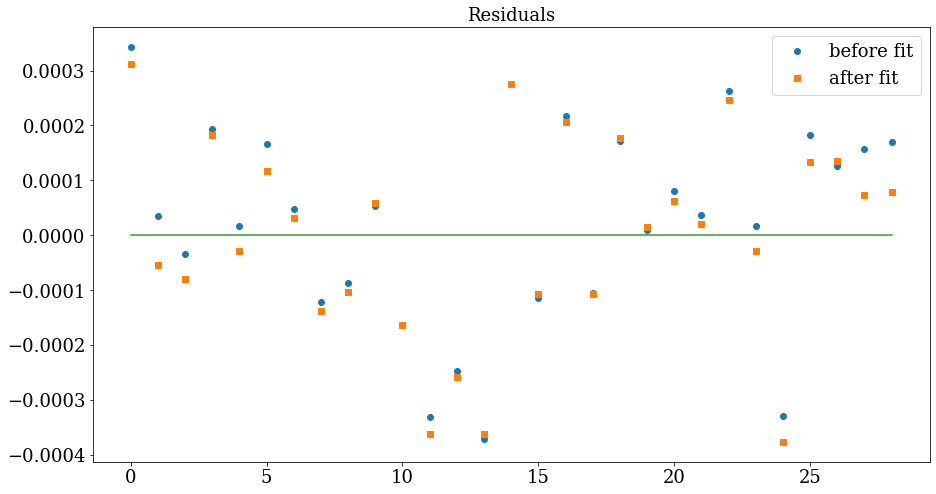

In [63]:
Lambda_g=0
N_range_g=[1,12]
v2_g=1
I_g=0
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,12]
v2_e=0
I_e=0
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    'Torg': [319.908939  ,'float'],
    'Be':  [ 0.24442841 ,'float'],
   'Gamma_SR': [-0.00319972,'float'],
    'qG': [4.9153e-04,'float'],
    'epsilonaa': [0.0006849,'float'],

}
# 'D': [1*(10**(-7)),'float'],
   # 'GammaD': [1*(10**(-7)),'float']
    
# 'bF': [0.00016,'float'],
#     'c': [0.000082,'float']


params_e = {  #In cm^-1
    'Torg': [17998.5875,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253052,'fix'],
    'D': [2.319*(10**(-7)),'fix'],
    'p2q': [-0.43807,'fix'],
    'p2qD': [3.8*(10**(-6)),'fix'],
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
p_test['epsilonaa_g'].min = -0.05
p_test['epsilonaa_g'].max = 0.05
#p_test['pG_g'].min = -0.005
#p_test['pG_g'].max = 0.005

p_test

test_result=fit_spectrum(p_test,Assigned_lines_for_paper,ground_state_vals,excited_state_vals,Temp)


from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
[[Variables]]
    Torg_g:      319.908940 +/- 7.3464e-05 (0.00%) (init = 319.9089)
    Be_g:        0.24442447 +

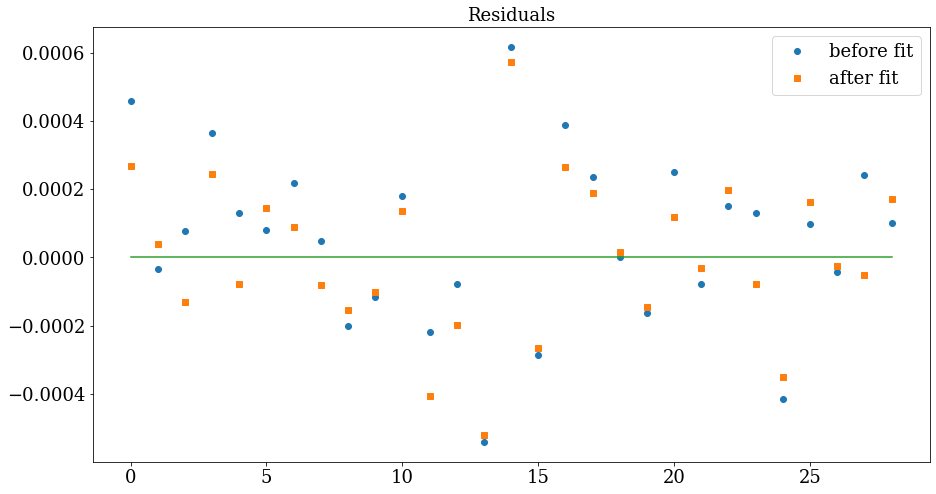

In [64]:
Lambda_g=0
N_range_g=[1,12]
v2_g=1
I_g=0
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,12]
v2_e=0
I_e=0
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    'Torg': [319.908939  ,'float'],
    'Be':  [ 0.24442841 ,'float'],
   'Gamma_SR': [-0.00319972,'float'],
    'qG': [4.9153e-04,'float'],

}
# 'D': [1*(10**(-7)),'float'],
   # 'GammaD': [1*(10**(-7)),'float']
    
# 'bF': [0.00016,'float'],
#     'c': [0.000082,'float']


params_e = {  #In cm^-1
    'Torg': [17998.5875,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253052,'fix'],
    'D': [2.319*(10**(-7)),'fix'],
    'p2q': [-0.43807,'fix'],
    'p2qD': [3.8*(10**(-6)),'fix'],
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
# p_test['epsilonaa_g'].min = -0.05
# p_test['epsilonaa_g'].max = 0.05
#p_test['pG_g'].min = -0.005
#p_test['pG_g'].max = 0.005

p_test

test_result=fit_spectrum(p_test,Assignments,ground_state_vals,excited_state_vals,Temp)


from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
from case (a) to case (b) transition
f

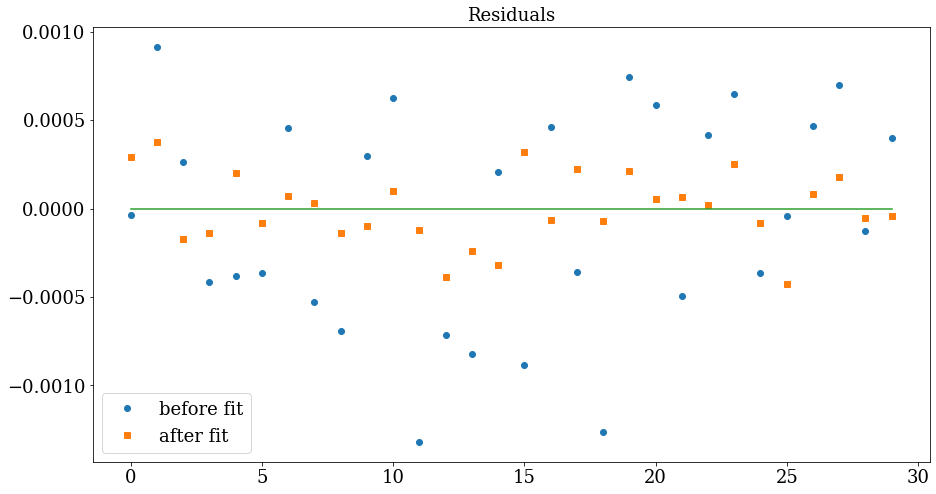

In [234]:
Lambda_g=0
N_range_g=[1,12]
v2_g=1
I_g=0
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,12]
v2_e=0
I_e=0
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    'Torg': [319.908939  ,'float'],
    'Be':  [ 0.24442841 ,'float'],
   'Gamma_SR': [-0.00319972,'float'],
    'qG': [4.9153e-04,'float'],
    #'epsilonaa': [ 0.003,'float']

}
# 'D': [1*(10**(-7)),'float'],
   # 'GammaD': [1*(10**(-7)),'float']
    
# 'bF': [0.00016,'float'],
#     'c': [0.000082,'float']


params_e = {  #In cm^-1
    'Torg': [17998.5875,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253052,'fix'],
    'D': [2.319*(10**(-7)),'fix'],
    'p2q': [-0.43807,'fix'],
    'p2qD': [3.8*(10**(-6)),'fix'],
    
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
p_test['epsilonaa_g'].min = -1
p_test['epsilonaa_g'].max = 1

p_test

test_result=fit_spectrum(p_test,Assignments,ground_state_vals,excited_state_vals,Temp)


Let's run the combo-difference for 17.68 now

In [226]:
lines_1768 = get_json_data('1768_all_line_positions',numpy=True,ujson=True)
err_1768 = get_json_data('1768_all_line_position_err',numpy=False,ujson=True)

In [229]:
X_Sig_010_err=1.7*(10**(-4.))

In [249]:
X010_A000_Combo_Diffs_1768_1=Find_Combo_Diff(lines_1768,err_1768,X_Sig_010.state_eval_designation,X_Sig_010_err,freq_cal_err,Delta_F_or_J='J',print_table_all = True, print_table = False, print_output=False,  hit_criteria = 0.001)

The criteria for hit is 0.001 cm-1

The combo-diff for line  17680.541376 

17682.011008250003
17680.541376
{'E': 321.1269578575552, 'N': 2, 'J': 2.5, 'P': 1.5, 'F': 2.5, 'Parity': 1}
{'E': 322.5962521603287, 'N': 3, 'J': 3.5, 'P': 1.5, 'F': 3.5, 'Parity': 1}
10.131403037503393 MHz


17682.011008250003
17680.541376
{'E': 321.1299103887358, 'N': 2, 'J': 2.5, 'P': 1.5, 'F': 2.5, 'Parity': -1}
{'E': 322.60036591126413, 'N': 3, 'J': 2.5, 'P': 0.5, 'F': 2.5, 'Parity': -1}
-24.681089421348464 MHz


17682.517104375
17680.541376
{'E': 322.59034708962474, 'N': 3, 'J': 3.5, 'P': 1.5, 'F': 3.5, 'Parity': -1}
{'E': 324.56533840037525, 'N': 4, 'J': 3.5, 'P': 0.5, 'F': 3.5, 'Parity': -1}
22.096630319970306 MHz


The combo-diff for line  17681.18207075 

17681.192147125003
17681.18207075
{'E': 322.59034708962474, 'N': 3, 'J': 3.5, 'P': 1.5, 'F': 3.5, 'Parity': -1}
{'E': 322.60036591126413, 'N': 3, 'J': 2.5, 'P': 0.5, 'F': 2.5, 'Parity': -1}
1.7254063897879515 MHz


17681.192147125003
17681.18207075
{

{'E': 321.1364177389995, 'N': 2, 'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': -1}
-2.116542715592125 MHz


The combo-diff for line  17682.517104375 

17682.52269875
17682.517104375
{'E': 321.1269578575552, 'N': 2, 'J': 2.5, 'P': 1.5, 'F': 2.5, 'Parity': 1}
{'E': 321.133465206454, 'N': 2, 'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': 1}
-27.37026899202587 MHz


17682.52269875
17682.517104375
{'E': 321.1299103887358, 'N': 2, 'J': 2.5, 'P': 1.5, 'F': 2.5, 'Parity': -1}
{'E': 321.1364177389995, 'N': 2, 'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': -1}
-27.370309911423174 MHz


17682.517104375
17680.541376
{'E': 322.59034708962474, 'N': 3, 'J': 3.5, 'P': 1.5, 'F': 3.5, 'Parity': -1}
{'E': 324.56533840037525, 'N': 4, 'J': 3.5, 'P': 0.5, 'F': 3.5, 'Parity': -1}
22.096630319970306 MHz


The combo-diff for line  17682.52269875 

17682.52269875
17682.517104375
{'E': 321.1269578575552, 'N': 2, 'J': 2.5, 'P': 1.5, 'F': 2.5, 'Parity': 1}
{'E': 321.133465206454, 'N': 2, 'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': 1}
-27

In [250]:
X010_A000_Combo_Diffs_1768_2=Find_Combo_Diff(lines_1768,err_1768,X_Sig_010.state_eval_designation,X_Sig_010_err,freq_cal_err,Delta_F_or_J='J',print_table_all = False, print_table = False, print_output=True,  hit_criteria = 0.001)

The criteria for hit is 0.001 cm-1

Number of Combo Diff Hits 70


0
17684.564099
17685.542296
{'E': 320.1520586110005, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 1.5, 'Parity': -1}
{'E': 321.1299103887358, 'N': 2, 'J': 2.5, 'P': 1.5, 'F': 2.5, 'Parity': -1}
10.349503138826613 MHz


1
17681.27865225
17685.69236375
{'E': 320.1520586110005, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 1.5, 'Parity': -1}
{'E': 324.56533840037525, 'N': 4, 'J': 3.5, 'P': 0.5, 'F': 3.5, 'Parity': -1}
12.942358985055487 MHz


2
17682.240383375
17681.265831124998
{'E': 320.153042783546, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 1.5, 'Parity': 1}
{'E': 321.1269578575552, 'N': 2, 'J': 2.5, 'P': 1.5, 'F': 2.5, 'Parity': 1}
19.102055693445614 MHz


3
17684.3454665
17685.319721875
{'E': 320.153042783546, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 1.5, 'Parity': 1}
{'E': 321.1269578575552, 'N': 2, 'J': 2.5, 'P': 1.5, 'F': 2.5, 'Parity': 1}
10.201967055562603 MHz


4
17685.666180250002
17686.647469
{'E': 320.153042783546, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 1.

Let's run the combo-difference for 17.64 now

In [242]:
lines_1764 = get_json_data('17637_all_line_positions',numpy=True,ujson=True)
err_1764 = get_json_data('17637_all_line_position_err',numpy=False,ujson=True)
lines_1764

array([17639.12174575, 17639.13185188, 17639.13875175, 17639.15250825,
       17639.1614995 , 17639.19871825, 17639.4282945 , 17639.43389337,
       17639.49173312, 17639.49669013, 17639.85086975, 17639.87807138,
       17639.91956412, 17640.16148825, 17640.171779  , 17640.40070237,
       17640.41822362, 17640.64382375, 17640.66507275, 17640.77789675,
       17640.78321963, 17640.88328437, 17640.91337162, 17638.95218362,
       17638.90356075, 17638.88921612, 17638.871292  , 17638.8592905 ,
       17638.735208  , 17638.71711262, 17638.69764513, 17638.62778263,
       17638.61248   , 17638.43095575, 17638.41201737, 17638.39028237,
       17638.27943925, 17638.2569045 , 17638.17443313, 17638.14837725,
       17637.48546787, 17637.04645488, 17636.681958  , 17641.16419787,
       17641.29655275, 17641.30474812, 17641.30985625, 17641.36210263,
       17641.85992687, 17641.87168925, 17641.95683962, 17641.967255  ,
       17642.07194987, 17642.46818163, 17642.48397   , 17642.52732275,
      

In [251]:
X010_A000_Combo_Diffs_1764_1=Find_Combo_Diff(lines_1764,err_1764,X_Sig_010.state_eval_designation,X_Sig_010_err,freq_cal_err,Delta_F_or_J='J',print_table_all = True, print_table = False, print_output=False,  hit_criteria = 0.001)

The criteria for hit is 0.001 cm-1

The combo-diff for line  17636.681957999997 

17639.131851875
17636.681957999997
{'E': 320.155386095, 'N': 1, 'J': 0.5, 'P': 0.5, 'F': 0.5, 'Parity': 1}
{'E': 322.60627098244476, 'N': 3, 'J': 2.5, 'P': 0.5, 'F': 2.5, 'Parity': 1}
-29.709805555502275 MHz


17638.627782625
17636.681957999997
{'E': 322.5962521603287, 'N': 3, 'J': 3.5, 'P': 1.5, 'F': 3.5, 'Parity': 1}
{'E': 324.5421482465703, 'N': 4, 'J': 4.5, 'P': 1.5, 'F': 4.5, 'Parity': 1}
-2.14235402963712 MHz


17639.15250825
17636.681957999997
{'E': 324.5421482465703, 'N': 4, 'J': 4.5, 'P': 1.5, 'F': 4.5, 'Parity': 1}
{'E': 327.0136980534297, 'N': 5, 'J': 4.5, 'P': 0.5, 'F': 4.5, 'Parity': 1}
-29.965960667345602 MHz


The combo-diff for line  17637.046454875002 

17639.491733125
17637.046454875002
{'E': 320.154401915, 'N': 1, 'J': 0.5, 'P': 0.5, 'F': 0.5, 'Parity': -1}
{'E': 322.60036591126413, 'N': 3, 'J': 2.5, 'P': 0.5, 'F': 2.5, 'Parity': -1}
-20.558155884042137 MHz


17639.496690125
17637.04645

{'E': 322.60036591126413, 'N': 3, 'J': 2.5, 'P': 0.5, 'F': 2.5, 'Parity': -1}
-20.558155884042137 MHz


The combo-diff for line  17639.496690125 

17639.496690125
17637.046454875002
{'E': 320.155386095, 'N': 1, 'J': 0.5, 'P': 0.5, 'F': 0.5, 'Parity': 1}
{'E': 322.60627098244476, 'N': 3, 'J': 2.5, 'P': 0.5, 'F': 2.5, 'Parity': 1}
-19.47564068226985 MHz


17639.496690125
17641.967255000003
{'E': 324.5421482465703, 'N': 4, 'J': 4.5, 'P': 1.5, 'F': 4.5, 'Parity': 1}
{'E': 327.0136980534297, 'N': 5, 'J': 4.5, 'P': 0.5, 'F': 4.5, 'Parity': 1}
-29.527514239952552 MHz


The combo-diff for line  17639.85086975 

17639.85086975
17638.871292
{'E': 320.153042783546, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 1.5, 'Parity': 1}
{'E': 321.133465206454, 'N': 2, 'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': 1}
-25.322656718943573 MHz


17639.85086975
17638.390282375
{'E': 321.1299103887358, 'N': 2, 'J': 2.5, 'P': 1.5, 'F': 2.5, 'Parity': -1}
{'E': 322.59034708962474, 'N': 3, 'J': 3.5, 'P': 1.5, 'F': 3.5, 'Parity': -1}

In [252]:
X010_A000_Combo_Diffs_1764_2=Find_Combo_Diff(lines_1764,err_1764,X_Sig_010.state_eval_designation,X_Sig_010_err,freq_cal_err,Delta_F_or_J='J',print_table_all = False, print_table = False, print_output=True,  hit_criteria = 0.001)

The criteria for hit is 0.001 cm-1

Number of Combo Diff Hits 70


0
17639.15250825
17638.174433125
{'E': 320.1520586110005, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 1.5, 'Parity': -1}
{'E': 321.1299103887358, 'N': 2, 'J': 2.5, 'P': 1.5, 'F': 2.5, 'Parity': -1}
6.695782547004989 MHz


1
17639.131851875
17638.14837725
{'E': 320.1520586110005, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 1.5, 'Parity': -1}
{'E': 321.1364177389995, 'N': 2, 'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': -1}
-26.516732768009327 MHz


2
17639.433893374997
17640.418223624998
{'E': 320.1520586110005, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 1.5, 'Parity': -1}
{'E': 321.1364177389995, 'N': 2, 'J': 1.5, 'P': 0.5, 'F': 1.5, 'Parity': -1}
-0.8657405944492006 MHz


3
17639.433893374997
17641.87168925
{'E': 320.1520586110005, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 1.5, 'Parity': -1}
{'E': 322.59034708962474, 'N': 3, 'J': 3.5, 'P': 1.5, 'F': 3.5, 'Parity': -1}
-14.767884993692377 MHz


4
17638.871292
17641.30985625
{'E': 320.1520586110005, 'N': 1, 'J': 1.5,

In [23]:

params_APi_000 = {  #In cm^-1
    'Torg': 17998.5875,
    'ASO': 1350,
    'Be': 0.253052,
    'D': 2.319*(10**(-7)),
    'p+2q': -0.43807,#
    '(p+2q)D': 3.8*(10**(-6)),
    'bF': 0,
    'c' : 0,
}

H_keys_APi_000 =['Spin Orbit','Rotation','Lambda Doubling','Centrifugal Distortion','Lambda Doubling CD']

#H_keys_1768_Pi_woLD =['Spin Orbit','Rotation','Renner Teller','Spin Rotation']#,'Lambda Doubling']#,'l Doubling']


A_Pi_000=Molecular_State.initialize_state(1,[1,6],params_APi_000,H_keys_APi_000,v2=0,I_values=[0],Hunds_case='case a')

params_XSig_010 = {  #In cm^-1
    'Torg': 319.908940,
    'Be':   0.24442447,
    'Gamma_SR': -0.00311450,
    'q_G': 4.8988e-04,
#    'gamma g epsilon aa':6.4039e-04,
}

H_keys_XSig_010 =['Rotation','Spin Rotation','l Doubling qG']

#H_keys_1768_Pi_woLD =['Spin Orbit','Rotation','Renner Teller','Spin Rotation']#,'Lambda Doubling']#,'l Doubling']


X_Sig_010=Molecular_State.initialize_state(0,[1,6],params_XSig_010,H_keys_XSig_010,v2=1,I_values=[0],Hunds_case='case b')


XSig010_to_APi000 = Molecular_Transition(X_Sig_010,A_Pi_000, 4)

In [42]:
def Table_for_paper(Assigned_lines_for_paper,Pred):
    
    fit_total_residuals = []
    
    for delta_J in ['P','Q','R']:
        n = 0
        
        for N_number in range(5):
        
            for i in range(len(Assigned_lines_for_paper)):



                f = Assigned_lines_for_paper[i]['freq']
                Ng = Assigned_lines_for_paper[i]['ground state']['N']
                Jg = Assigned_lines_for_paper[i]['ground state']['J']
                Je = Assigned_lines_for_paper[i]['excited state']['J']
                P_e_data = Assigned_lines_for_paper[i]['excited state']['P']
                P_g_data = Assigned_lines_for_paper[i]['ground state']['P']
                pg = Assigned_lines_for_paper[i]['ground state']['Parity']
                if pg == 1:
                    parity_g = '+'
                    parity_e = '-'
                    pe = -1
                if pg == -1:
                    parity_g = '-'
                    parity_e = '+'
                    pe = 1
                if Jg == Je:
                    pqr = 'Q'
                elif Jg - 1 == Je:
                    pqr = 'P'
                elif Jg + 1 == Je:
                    pqr = 'R'

                if delta_J == pqr and Ng == N_number + 1:
                    for j in range(len(Pred)):
                        N_g_pred=Pred[j]['ground state']['N']
                        J_g_pred=Pred[j]['ground state']['J']
                        P_g_pred=Pred[j]['ground state']['P']
                        Parity_g_pred=Pred[j]['ground state']['Parity']
                        J_e_pred=Pred[j]['excited state']['J']
                        P_e_pred=Pred[j]['excited state']['P']
                        Parity_e_pred=Pred[j]['excited state']['Parity']
                        

                        if Ng==N_g_pred and Jg==J_g_pred and pg==Parity_g_pred and Je==J_e_pred and pe==Parity_e_pred and P_e_data==P_e_pred:
                            f_pred = Pred[j]['freq']

                        #if [N_g_pred, J_g_pred, Parity_g_pred, J_e_pred, Parity_e_pred, P_e_pred] in [[1,0.5,1,0.5,-1,0.5],[2,2.5,1,1.5,-1,0.5],[2,2.5,1,2.5,-1,0.5],[2,2.5,1,3.5,-1,0.5],[3,3.5,-1,2.5,1,0.5],[3,3.5,-1,3.5,1,0.5],[3,3.5,-1,4.5,1,0.5],[3,2.5,-1,3.5,1,0.5]]:
                            #if Je - Jg == J_e_pred - J_g_pred and N_g_pred == Ng and Jg == J_g_pred:
                                #if Parity_g_pred == 1:
                                    #Parity_g_pred_missing = '+'
                                    #Parity_e_pred_missing = '-'
                                #if Parity_g_pred == -1:
                                    #Parity_g_pred_missing = '-'
                                    #Parity_e_pred_missing = '+'
                                #print(' ', '  &  ', str(N_g_pred) + ', ' + str(J_g_pred)  + ', ' + str(Parity_g_pred_missing) , '  &  ', str(J_e_pred)  + ', ' + str(Parity_e_pred_missing) , '  &  ',round(Pred[j]['freq'], 5),  '(calc.)   &  ', 'N/A')
                        #else:
                            #print(j,'could not find the prediction')
                            
                    res = (f-f_pred)*29979.2458

                    fit_total_residuals.append(res)
                    #print('$' + pqr + '$', '  &  ', str(Ng) + ', ' + str(Jg)  + ', ' + parity_g , '  &  ', str(Je)  + ', ' + parity_e , '  &  ', round(f, 5),  '  &  ', round( res , 2) )

                    if n == 0:
                        print('$' + pqr + '$', '  &  ', str(Ng) + ', ' + str(Jg)  + ', ' + parity_g , '  &  ', str(Je)  + ', ' + parity_e , '  &  ', round(f, 5),  '  &  ', round( res , 2) )
                    if n == 1:
                        print(' ', '  &  ', str(Ng) + ', ' + str(Jg)  + ', ' + parity_g , '  &  ', str(Je)  + ', ' + parity_e , '  &  ', round(f, 5),  '  &  ', round( res , 2)  )
                    n = 1


    print('# of assigned lines: ' + str(len(Assigned_lines_for_paper)) )
    print('fit residual is: ' + str(np.std(fit_total_residuals)) )

In [43]:
Assigned_lines_for_paper = [{'freq': 17001.561393285378,

  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': -1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},


 {'freq': 17002.207592865925,

  'ground state': {'N': 4, 'J': 4.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17002.43122616474,

  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': 1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17002.48827449972,

  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': 1},

  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17002.601175906137,

  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': 1},

  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17002.611395286767,

  'ground state': {'N': 3, 'J': 3.5, 'P': 1.5, 'Parity': 1},

  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17002.923246359198,

  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': -1},

  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17003.024998894154,

  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': -1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17003.031418436974,

  'ground state': {'N': 2, 'J': 2.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17003.46834462022,

  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': 1},

  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17003.905288565547,

  'ground state': {'N': 1, 'J': 0.5, 'P': 0.5, 'Parity': -1},

  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17003.92083413967,

  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': -1},

  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17003.903930532226,

  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': 1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17003.906970538075,

  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17004.007647939918,

  'ground state': {'N': 1, 'J': 0.5, 'P': 0.5, 'Parity': -1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17004.009147437195,

  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17004.07429330646,

  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': 1},

  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17004.882393796448,

  'ground state': {'N': 1, 'J': 0.5, 'P': 0.5, 'Parity': 1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17004.884559882204,

  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': 1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17005.054295704722,

  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': 1},

  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17005.38531467196,

  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': -1},

  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17005.391656423883,

  'ground state': {'N': 2, 'J': 2.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17005.62980122787,

  'ground state': {'N': 2, 'J': 2.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17005.90523733652,

  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': 1},

  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17005.91496237113,

  'ground state': {'N': 3, 'J': 3.5, 'P': 1.5, 'Parity': 1},

  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17006.221471788347,

  'ground state': {'N': 3, 'J': 3.5, 'P': 1.5, 'Parity': 1},

  'excited state': {'J': 4.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17006.36950333901,

  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17006.442094771188,

  'ground state': {'N': 4, 'J': 3.5, 'P': 0.5, 'Parity': -1},

  'excited state': {'J': 4.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17006.829792391243,

  'ground state': {'N': 4, 'J': 4.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 5.5, 'P': 0.5, 'Parity': 1}}]

In [44]:
Table_for_paper(Assigned_lines_for_paper,XSig010_to_APi000.Transitions)

$P$   &   1, 1.5, +   &   0.5, -   &   17003.46834   &   -3.0
    &   1, 1.5, -   &   0.5, +   &   17003.90697   &   -15.6
    &   2, 1.5, +   &   0.5, -   &   17002.48827   &   7.3
    &   2, 1.5, -   &   0.5, +   &   17002.92325   &   2.65
    &   2, 2.5, -   &   1.5, +   &   17003.03142   &   -4.59
    &   3, 2.5, -   &   1.5, +   &   17001.56139   &   8.04
    &   3, 2.5, +   &   1.5, -   &   17002.43123   &   -3.9
    &   3, 3.5, +   &   2.5, -   &   17002.6114   &   4.37
    &   4, 4.5, -   &   3.5, +   &   17002.20759   &   1.16
$Q$   &   1, 0.5, -   &   0.5, +   &   17003.90529   &   4.06
    &   1, 1.5, -   &   1.5, +   &   17004.00915   &   -7.94
    &   1, 1.5, +   &   1.5, -   &   17004.88456   &   0.53
    &   2, 1.5, -   &   1.5, +   &   17003.025   &   -2.42
    &   2, 1.5, +   &   1.5, -   &   17003.90393   &   -5.93
    &   2, 2.5, -   &   2.5, +   &   17005.39166   &   -0.89
    &   3, 2.5, +   &   2.5, -   &   17002.60118   &   -2.35
    &   3, 2.5, -   &   2.5, +   

In [12]:
Assigned_lines_for_paper = [{'freq': 17001.561393285378,
  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17002.207592865925,
  'ground state': {'N': 4, 'J': 4.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17002.43122616474,
  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.48827449972,
  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.601175906137,
  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.611395286767,
  'ground state': {'N': 3, 'J': 3.5, 'P': 1.5, 'Parity': 1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.923246359198,
  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17003.024998894154,
  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17003.031418436974,
  'ground state': {'N': 2, 'J': 2.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17003.46834462022,
  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': 1},
  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17003.905288565547,
  'ground state': {'N': 1, 'J': 0.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17003.92083413967,
  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17003.903930532226,
  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17003.906970538075,
  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17004.007647939918,
  'ground state': {'N': 1, 'J': 0.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17004.009147437195,
  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17004.07429330646,
  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17004.882393796448,
  'ground state': {'N': 1, 'J': 0.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17004.884559882204,
  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': 1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17005.054295704722,
  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': 1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17005.38531467196,
  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17005.391656423883,
  'ground state': {'N': 2, 'J': 2.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17005.62980122787,
  'ground state': {'N': 2, 'J': 2.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17005.90523733652,
  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17005.91496237113,
  'ground state': {'N': 3, 'J': 3.5, 'P': 1.5, 'Parity': 1},
  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17006.221471788347,
  'ground state': {'N': 3, 'J': 3.5, 'P': 1.5, 'Parity': 1},
  'excited state': {'J': 4.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17006.36950333901,
  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17006.442094771188,
  'ground state': {'N': 4, 'J': 3.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 4.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17006.829792391243,
  'ground state': {'N': 4, 'J': 4.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 5.5, 'P': 0.5, 'Parity': 1}}]

In [13]:
error_array = np.zeros(len(Assigned_lines_for_paper))

for i in range(len(Assigned_lines_for_paper)):
    index = np.searchsorted(identified_peaks_separated, Assigned_lines_for_paper[i]['freq'])
    
    error_array[i] = identified_peaks_separated_error[index]


NameError: name 'identified_peaks_separated' is not defined

In [14]:
error_array = np.array([1.82796393e-05, 9.77401127e-05, 3.78305000e-05, 1.05478957e-05,
       3.80101535e-05, 3.09601260e-05, 3.20685766e-05, 2.05944130e-05,
       1.28597590e-05, 5.26742774e-05, 9.20607835e-06, 5.36690881e-05,
       9.20607835e-06, 5.36690881e-05, 1.44997147e-05, 5.28819777e-05,
       3.56838395e-05, 1.31287484e-05, 8.69567723e-06, 1.06073770e-05,
       1.92924642e-05, 1.72943537e-05, 1.25006395e-05, 1.98695259e-05,
       2.26724014e-05, 3.07926392e-05, 7.13619255e-06, 6.33660038e-05,
       2.05334827e-05])

In [15]:
error_array

array([1.82796393e-05, 9.77401127e-05, 3.78305000e-05, 1.05478957e-05,
       3.80101535e-05, 3.09601260e-05, 3.20685766e-05, 2.05944130e-05,
       1.28597590e-05, 5.26742774e-05, 9.20607835e-06, 5.36690881e-05,
       9.20607835e-06, 5.36690881e-05, 1.44997147e-05, 5.28819777e-05,
       3.56838395e-05, 1.31287484e-05, 8.69567723e-06, 1.06073770e-05,
       1.92924642e-05, 1.72943537e-05, 1.25006395e-05, 1.98695259e-05,
       2.26724014e-05, 3.07926392e-05, 7.13619255e-06, 6.33660038e-05,
       2.05334827e-05])

[[Variables]]
    Torg_g:      319.908903 +/- 5.3772e-05 (0.00%) (init = 319.9089)
    Be_g:        0.24442526 +/- 1.2062e-05 (0.00%) (init = 0.2444284)
    Gamma_SR_g: -0.00309446 +/- 5.4105e-05 (1.75%) (init = -0.00319972)
    qG_g:        4.9349e-04 +/- 1.8148e-05 (3.68%) (init = 0.00049153)
    Torg_e:      17998.59 (fixed)
    ASO_e:       1350 (fixed)
    Be_e:        0.253052 (fixed)
    D_e:         2.319e-07 (fixed)
    p2q_e:      -0.43807 (fixed)
    p2qD_e:      3.8e-06 (fixed)
[[Correlations]] (unreported correlations are < 0.100)
    C(Torg_g, Be_g)     = -0.671
    C(Gamma_SR_g, qG_g) = -0.650
    C(Be_g, qG_g)       = -0.592
    C(Be_g, Gamma_SR_g) = 0.411
    C(Torg_g, qG_g)     = 0.222
None
fit residuals standard deviation 0.0002291122259663016


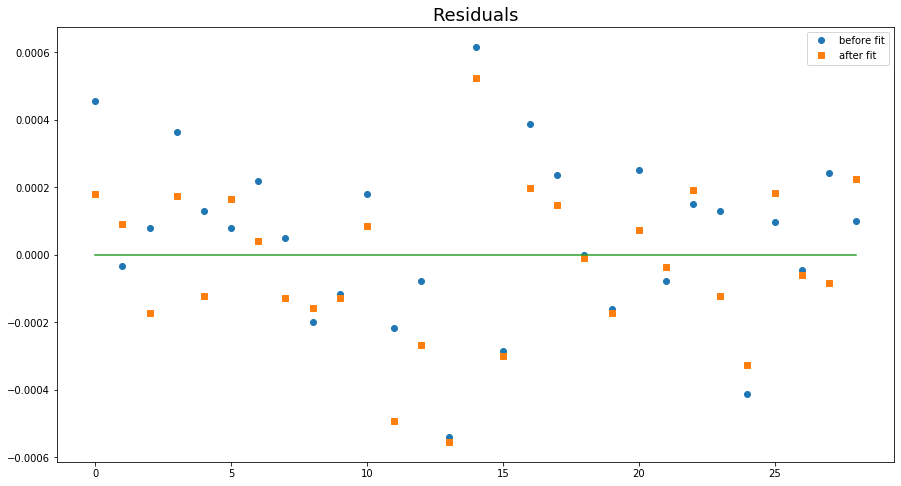

In [16]:
Lambda_g=0
N_range_g=[1,12]
v2_g=1
I_g=0
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,12]
v2_e=0
I_e=0
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    'Torg': [319.908939  ,'float'],
    'Be':  [ 0.24442841 ,'float'],
   'Gamma_SR': [-0.00319972,'float'],
    'qG': [4.9153e-04,'float'],
#    'epsilonaa': [0.0006849,'float'],

}
# 'D': [1*(10**(-7)),'float'],
   # 'GammaD': [1*(10**(-7)),'float']
    
# 'bF': [0.00016,'float'],
#     'c': [0.000082,'float']


params_e = {  #In cm^-1
    'Torg': [17998.5875,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253052,'fix'],
    'D': [2.319*(10**(-7)),'fix'],
    'p2q': [-0.43807,'fix'],
    'p2qD': [3.8*(10**(-6)),'fix'],
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
#p_test['epsilonaa_g'].min = -0.05
#p_test['epsilonaa_g'].max = 0.05
#p_test['pG_g'].min = -0.005
#p_test['pG_g'].max = 0.005

p_test

test_result=fit_spectrum(p_test,Assigned_lines_for_paper,ground_state_vals,excited_state_vals, Temp, error_array)


[[Variables]]
    Torg_g:      319.908940 +/- 7.3464e-05 (0.00%) (init = 319.9089)
    Be_g:        0.24442447 +/- 1.0845e-05 (0.00%) (init = 0.2444284)
    Gamma_SR_g: -0.00311450 +/- 3.9846e-05 (1.28%) (init = -0.00319972)
    qG_g:        4.8988e-04 +/- 1.5059e-05 (3.07%) (init = 0.00049153)
    Torg_e:      17998.59 (fixed)
    ASO_e:       1350 (fixed)
    Be_e:        0.253052 (fixed)
    D_e:         2.319e-07 (fixed)
    p2q_e:      -0.43807 (fixed)
    p2qD_e:      3.8e-06 (fixed)
[[Correlations]] (unreported correlations are < 0.100)
    C(Torg_g, Be_g)     = -0.676
    C(Be_g, qG_g)       = -0.671
    C(Gamma_SR_g, qG_g) = -0.426
    C(Be_g, Gamma_SR_g) = 0.265
    C(Torg_g, qG_g)     = 0.174
None
fit residuals standard deviation 0.00022633824781264072


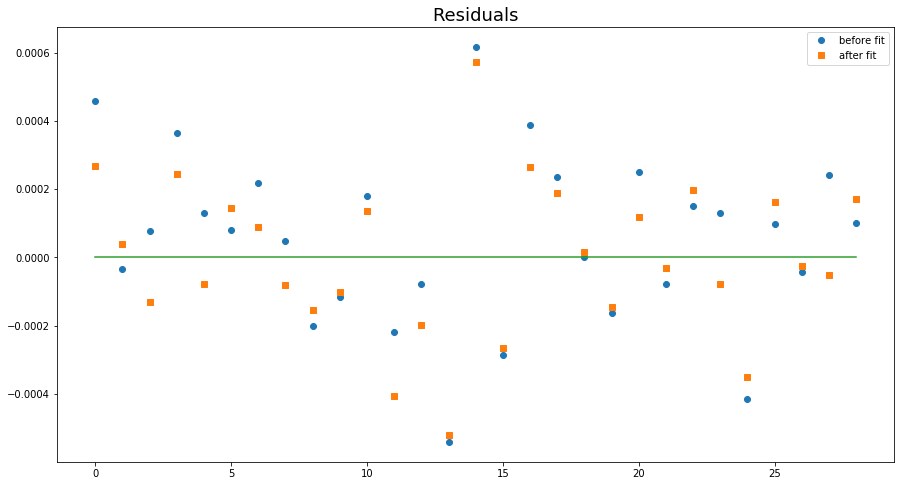

In [17]:
Lambda_g=0
N_range_g=[1,12]
v2_g=1
I_g=0
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,12]
v2_e=0
I_e=0
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    'Torg': [319.908939  ,'float'],
    'Be':  [ 0.24442841 ,'float'],
   'Gamma_SR': [-0.00319972,'float'],
    'qG': [4.9153e-04,'float'],
#    'epsilonaa': [0.0006849,'float'],

}
# 'D': [1*(10**(-7)),'float'],
   # 'GammaD': [1*(10**(-7)),'float']
    
# 'bF': [0.00016,'float'],
#     'c': [0.000082,'float']


params_e = {  #In cm^-1
    'Torg': [17998.5875,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253052,'fix'],
    'D': [2.319*(10**(-7)),'fix'],
    'p2q': [-0.43807,'fix'],
    'p2qD': [3.8*(10**(-6)),'fix'],
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
#p_test['epsilonaa_g'].min = -0.05
#p_test['epsilonaa_g'].max = 0.05
#p_test['pG_g'].min = -0.005
#p_test['pG_g'].max = 0.005

p_test

test_result=fit_spectrum(p_test,Assigned_lines_for_paper,ground_state_vals,excited_state_vals, Temp, uncertainty_array = None)


[[Variables]]
    Torg_g:      319.908988 +/- 7.6004e-05 (0.00%) (init = 319.9089)
    Be_g:        0.24441361 +/- 1.0485e-05 (0.00%) (init = 0.2444284)
    Gamma_SR_g: -0.00314047 +/- 4.1098e-05 (1.31%) (init = -0.00319972)
    qG_g:        4.9138e-04 +/- 1.6003e-05 (3.26%) (init = 0.00049153)
    Torg_e:      17998.59 (fixed)
    ASO_e:       1350 (fixed)
    Be_e:        0.253052 (fixed)
    D_e:         2.319e-07 (fixed)
    p2q_e:      -0.43807 (fixed)
    p2qD_e:      3.8e-06 (fixed)
[[Correlations]] (unreported correlations are < 0.100)
    C(Be_g, qG_g)         = -0.722
    C(Torg_g, Be_g)       = -0.639
    C(Gamma_SR_g, qG_g)   = -0.413
    C(Torg_g, Gamma_SR_g) = 0.181
    C(Torg_g, qG_g)       = 0.166
    C(Be_g, Gamma_SR_g)   = 0.150
None
fit residuals standard deviation 0.0002449699319876044


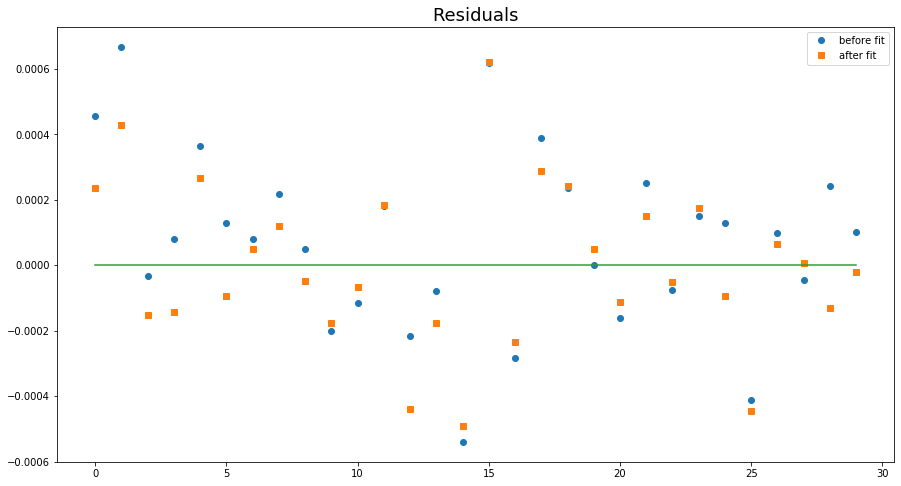

In [19]:
Lambda_g=0
N_range_g=[1,12]
v2_g=1
I_g=0
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,12]
v2_e=0
I_e=0
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    'Torg': [319.908939  ,'float'],
    'Be':  [ 0.24442841 ,'float'],
   'Gamma_SR': [-0.00319972,'float'],
    'qG': [4.9153e-04,'float'],
#    'epsilonaa': [0.0006849,'float'],

}
# 'D': [1*(10**(-7)),'float'],
   # 'GammaD': [1*(10**(-7)),'float']
    
# 'bF': [0.00016,'float'],
#     'c': [0.000082,'float']


params_e = {  #In cm^-1
    'Torg': [17998.5875,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253052,'fix'],
    'D': [2.319*(10**(-7)),'fix'],
    'p2q': [-0.43807,'fix'],
    'p2qD': [3.8*(10**(-6)),'fix'],
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
#p_test['epsilonaa_g'].min = -0.05
#p_test['epsilonaa_g'].max = 0.05
#p_test['pG_g'].min = -0.005
#p_test['pG_g'].max = 0.005

p_test

test_result=fit_spectrum(p_test,Assignments,ground_state_vals,excited_state_vals, Temp, uncertainty_array = None)


In [18]:
Assignments = [{'freq': 17001.561393285378,
  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17001.82123929486,
  'ground state': {'N': 5, 'J': 5.5, 'P': 1.5, 'Parity': 1},
  'excited state': {'J': 4.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.207592865925,
  'ground state': {'N': 4, 'J': 4.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17002.43122616474,
  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.48827449972,
  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.601175906137,
  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.611395286767,
  'ground state': {'N': 3, 'J': 3.5, 'P': 1.5, 'Parity': 1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17002.923246359198,
  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17003.024998894154,
  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17003.031418436974,
  'ground state': {'N': 2, 'J': 2.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17003.46834462022,
  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': 1},
  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17003.905288565547,
  'ground state': {'N': 1, 'J': 0.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17003.92083413967,
  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17003.903930532226,
  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17003.906970538075,
  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17004.007647939918,
  'ground state': {'N': 1, 'J': 0.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17004.009147437195,
  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17004.07429330646,
  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17004.882393796448,
  'ground state': {'N': 1, 'J': 0.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17004.884559882204,
  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': 1},
  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17005.054295704722,
  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': 1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17005.38531467196,
  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17005.391656423883,
  'ground state': {'N': 2, 'J': 2.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17005.62980122787,
  'ground state': {'N': 2, 'J': 2.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17005.90523733652,
  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': 1},
  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17005.91496237113,
  'ground state': {'N': 3, 'J': 3.5, 'P': 1.5, 'Parity': 1},
  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17006.221471788347,
  'ground state': {'N': 3, 'J': 3.5, 'P': 1.5, 'Parity': 1},
  'excited state': {'J': 4.5, 'P': 0.5, 'Parity': -1}},
 {'freq': 17006.36950333901,
  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17006.442094771188,
  'ground state': {'N': 4, 'J': 3.5, 'P': 0.5, 'Parity': -1},
  'excited state': {'J': 4.5, 'P': 0.5, 'Parity': 1}},
 {'freq': 17006.829792391243,
  'ground state': {'N': 4, 'J': 4.5, 'P': 1.5, 'Parity': -1},
  'excited state': {'J': 5.5, 'P': 0.5, 'Parity': 1}}]

[[Variables]]
    Torg_g:       319.908948 +/- 6.0727e-05 (0.00%) (init = 319.9089)
    Be_g:         0.24442425 +/- 9.0106e-06 (0.00%) (init = 0.2444284)
    Gamma_SR_g:  -0.00320340 +/- 3.8457e-05 (1.20%) (init = -0.00319972)
    qG_g:         4.9006e-04 +/- 1.2936e-05 (2.64%) (init = 0.00049153)
    epsilonaa_g:  7.0824e-04 +/- 1.3224e-04 (18.67%) (init = 0.0006849)
    Torg_e:       17998.59 (fixed)
    ASO_e:        1350 (fixed)
    Be_e:         0.253052 (fixed)
    D_e:          2.319e-07 (fixed)
    p2q_e:       -0.43807 (fixed)
    p2qD_e:       3.8e-06 (fixed)
[[Correlations]] (unreported correlations are < 0.100)
    C(Be_g, qG_g)              = -0.671
    C(Torg_g, Be_g)            = -0.669
    C(Gamma_SR_g, epsilonaa_g) = -0.514
    C(Gamma_SR_g, qG_g)        = -0.494
    C(Be_g, Gamma_SR_g)        = 0.286
    C(qG_g, epsilonaa_g)       = 0.283
    C(Torg_g, qG_g)            = 0.160
    C(Be_g, epsilonaa_g)       = -0.117
None
fit residuals standard deviation 0.00018307907

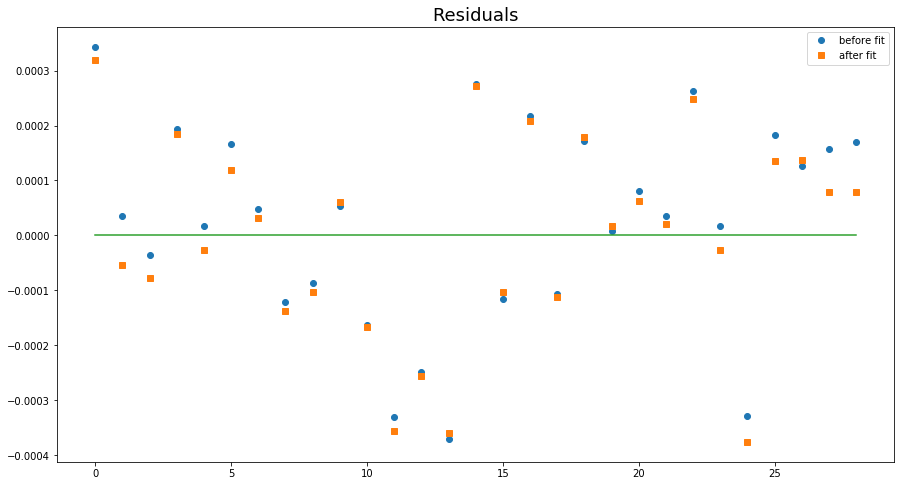

In [20]:
Lambda_g=0
N_range_g=[1,12]
v2_g=1
I_g=0
case_g='case b'
ground_state_vals=[Lambda_g,N_range_g,v2_g,I_g,case_g]

Lambda_e=1
N_range_e=[1,12]
v2_e=0
I_e=0
case_e = 'case a'
excited_state_vals=[Lambda_e,N_range_e,v2_e,I_e,case_e]

Temp=4


params_g = {  #In cm^-1
    'Torg': [319.908939  ,'float'],
    'Be':  [ 0.24442841 ,'float'],
   'Gamma_SR': [-0.00319972,'float'],
    'qG': [4.9153e-04,'float'],
    'epsilonaa': [0.0006849,'float'],

}
# 'D': [1*(10**(-7)),'float'],
   # 'GammaD': [1*(10**(-7)),'float']
    
# 'bF': [0.00016,'float'],
#     'c': [0.000082,'float']


params_e = {  #In cm^-1
    'Torg': [17998.5875,'fix'],
    'ASO': [1350,'fix'],
    'Be':  [0.253052,'fix'],
    'D': [2.319*(10**(-7)),'fix'],
    'p2q': [-0.43807,'fix'],
    'p2qD': [3.8*(10**(-6)),'fix'],
}

p_test=create_fit_parameters(params_g,params_e)

p_test['Torg_g'].min = 310
p_test['Torg_g'].max = 330
p_test['Be_g'].min = 0.14
p_test['Be_g'].max = 0.34
p_test['Gamma_SR_g'].min = -0.028
p_test['Gamma_SR_g'].max = -0.00028
p_test['qG_g'].min = -0.05
p_test['qG_g'].max = 0.05
#p_test['epsilonaa_g'].min = -0.05
#p_test['epsilonaa_g'].max = 0.05
#p_test['pG_g'].min = -0.005
#p_test['pG_g'].max = 0.005

p_test

test_result=fit_spectrum(p_test,Assigned_lines_for_paper,ground_state_vals,excited_state_vals, Temp, uncertainty_array = None)
